In [1]:
import seaborn as sns
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
input_file = "../data/world_boundaries_with_stats.gpkg"
gdf = gpd.read_file(input_file)

gdf = gdf[(gdf["share_sum_edits_corporate"] > 0.1) & (gdf["sum_edits_corporate"] > 100_000)]
country_list = gdf["ISO_A3_EH"].to_list()
display(country_list)

['URY',
 'MEX',
 'EGY',
 'QAT',
 'ARE',
 'VNM',
 'CHL',
 'MYS',
 'COL',
 'DOM',
 'IND',
 'KWT',
 'IDN',
 'GRC',
 'BRA',
 'PAK',
 'TZA',
 'ECU',
 'KHM',
 'PHL',
 'THA',
 'IRN',
 'VEN',
 'MMR',
 'SRB',
 'ZAF',
 'PER',
 'ALB',
 'ROU',
 'IRQ',
 'TCD',
 'USA',
 'AGO',
 'HTI',
 'MAR',
 'UKR']

In [95]:
time_range_values = {
    "t0": "2019-06-01 - 2021-05-31",
    "t1": "2021-06-01 - 2023-05-31"
}


def read_csv(iso_a3_code):
    input_file = f'../data/country_mapping_summary_stats/summary_stats_{iso_a3_code}.csv'
    df = pd.read_csv(input_file)
    
    df.replace(
        {"contrib_type": {
            "CREATED": "creation",
            "GEOMETRY": "geometry change",
            "TAG": "tag change",
            "DELETED": "deletion",
            "TAG_GEOMETRY": "tag + geometry change",
            "NONE": "other"
        }},
        inplace=True
    )
    
    df["primary_osm_tag_keys"] = df["primary_osm_tag_keys"].str.lstrip("'[").str.rstrip("]'")
    return df


def create_plot(df,iso_a3_code, time_range, corporate):
    if corporate:
        df_selection = df[(df["time_range"] == time_range) & (df["corporation"] != "nc")]
        output_file = f"../figures/country_mapping_summary_stats/summary_stats_plot_{iso_a3_code}_{time_range}_corporate.svg"
    else:
        df_selection = df[(df["time_range"] == time_range) & (df["corporation"] == "nc")]
        output_file = f"../figures/country_mapping_summary_stats/summary_stats_plot_{iso_a3_code}_{time_range}_non_corporate.svg"

    df_selection = df_selection[0:10].reset_index()
    display(df_selection)

    plt.figure(figsize=(7,4))
    plt.subplots_adjust(left=0.15)
    plt.barh(
        df_selection["Unnamed: 0"],
        df_selection["edits"] / 1_000_000,
        color="grey"
    )

    max_x = df_selection["edits"].max() / 1_000_000
    print(max_x)
    
    for i in range(0, len(df_selection)):
        annotation = f"{round(100 * df_selection['edits_share'][i], 1)} %"
        plt.annotate(
            annotation,
            xy=(
                1.22 * max_x,
                df_selection["Unnamed: 0"][i] - 0.15),
                ha='right'
        )
    
        annotation = f"{df_selection['primary_osm_tag_keys'][i]} ({df_selection['contrib_type'][i]})"
        if df_selection["edits"][i] / 1_000_000 < 0.5 * max_x:
            plt.annotate(
                annotation,
                xy=(
                    (df_selection["edits"][i] / 1_000_000) + 0.01*max_x,
                    df_selection["Unnamed: 0"][i] - 0.15),
                    ha='left',
                    color="grey"
            )
        else:
            plt.annotate(
                annotation,
                xy=(
                    (df_selection["edits"][i] / 1_000_000) - 0.01*max_x,
                    df_selection["Unnamed: 0"][i] - 0.15),
                    ha='right',
                    color="lightgrey"
            )
    
    plt.title(f"{time_range}: {time_range_values[time_range]}")
    
    if corporate:
        plt.yticks(
            df_selection["Unnamed: 0"],
            df_selection["corporation"]
        )
    else:
        plt.yticks(
            df_selection["Unnamed: 0"],
            []
        )

    plt.xlabel("edits [Million]")
    plt.xlim((0, 1.25 * max_x))
    plt.tick_params(left = False) 
    plt.savefig(
        output_file,
        format='svg',
        transparent=True
    )
    plt.show()

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Kaart,creation,other,559400,0.749,0.749,22,0.143
1,1,1,t0,Kaart,tag change,other,129129,0.173,0.922,9,0.058
2,2,2,t0,Kaart,geometry change,highway,13705,0.018,0.940,56,0.364
3,3,3,t0,Kaart,other,other,9649,0.013,0.953,11,0.071
4,4,4,t0,Kaart,tag change,highway,9517,0.013,0.966,17,0.110
5,5,5,t0,Kaart,creation,highway,6423,0.009,0.974,67,0.435
6,6,6,t0,Apple,other,other,3830,0.005,0.979,25,0.162
7,7,7,t0,Kaart,deletion,other,3561,0.005,0.984,6,0.039
8,8,8,t0,Kaart,tag + geometry change,highway,1726,0.002,0.986,18,0.117
9,9,9,t0,Kaart,creation,building,1707,0.002,0.989,34,0.221


0.5594


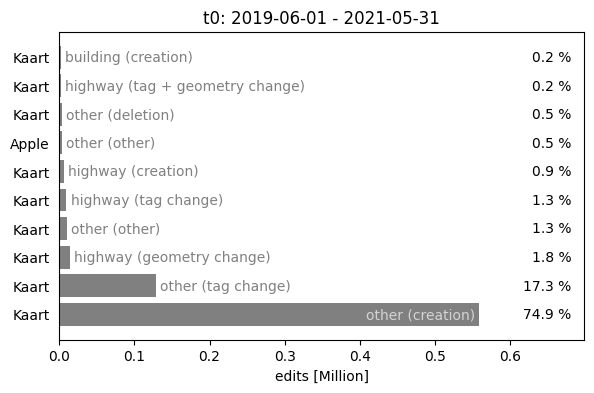

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Microsoft,creation,highway,15897,0.272,0.272,17,0.128
1,21,1,t1,Microsoft,geometry change,highway,9829,0.168,0.440,17,0.128
2,22,2,t1,Microsoft,creation,barrier,6630,0.113,0.553,9,0.068
3,23,3,t1,Kaart,creation,highway,6409,0.110,0.662,43,0.323
4,24,4,t1,Kaart,geometry change,highway,5586,0.095,0.758,44,0.331
5,25,5,t1,Kaart,tag change,highway,1952,0.033,0.791,23,0.173
6,26,6,t1,Kaart,tag + geometry change,highway,1100,0.019,0.810,28,0.211
7,27,7,t1,Microsoft,geometry change,waterway,1083,0.019,0.828,9,0.068
8,28,8,t1,Microsoft,creation,waterway,750,0.013,0.841,9,0.068
9,29,9,t1,Microsoft,tag change,highway,747,0.013,0.854,14,0.105


0.015897


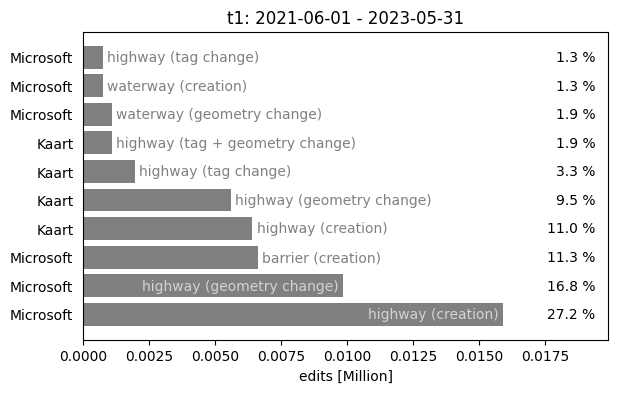

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,23993,0.237,0.237,160,0.290
1,41,1,t0,nc,creation,natural,8255,0.082,0.319,35,0.064
2,42,2,t0,nc,tag change,other,7327,0.072,0.391,100,0.181
3,43,3,t0,nc,creation,highway,7036,0.070,0.461,130,0.236
4,44,4,t0,nc,creation,building,6871,0.068,0.528,84,0.152
5,45,5,t0,nc,tag change,highway,6556,0.065,0.593,116,0.211
6,46,6,t0,nc,other,highway,5449,0.054,0.647,51,0.093
7,47,7,t0,nc,other,other,3684,0.036,0.684,88,0.160
8,48,8,t0,nc,creation,landuse,3132,0.031,0.714,47,0.085
9,49,9,t0,nc,geometry change,landuse,2596,0.026,0.740,53,0.096


0.023993


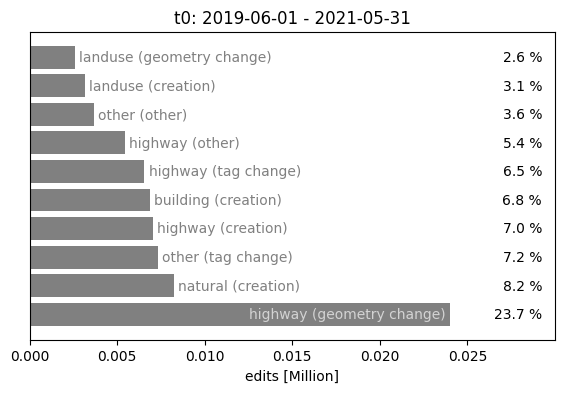

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,geometry change,highway,18059,0.175,0.175,117,0.259
1,61,1,t1,nc,tag change,highway,17301,0.168,0.344,118,0.262
2,62,2,t1,nc,creation,power,5845,0.057,0.400,11,0.024
3,63,3,t1,nc,creation,highway,5764,0.056,0.456,102,0.226
4,64,4,t1,nc,creation,building,5615,0.055,0.511,84,0.186
5,65,5,t1,nc,tag change,other,3924,0.038,0.549,78,0.173
6,66,6,t1,nc,creation,other,3803,0.037,0.586,62,0.137
7,67,7,t1,nc,deletion,other,3633,0.035,0.621,29,0.064
8,68,8,t1,nc,other,highway,2987,0.029,0.650,56,0.124
9,69,9,t1,nc,geometry change,building,2767,0.027,0.677,30,0.067


0.018059


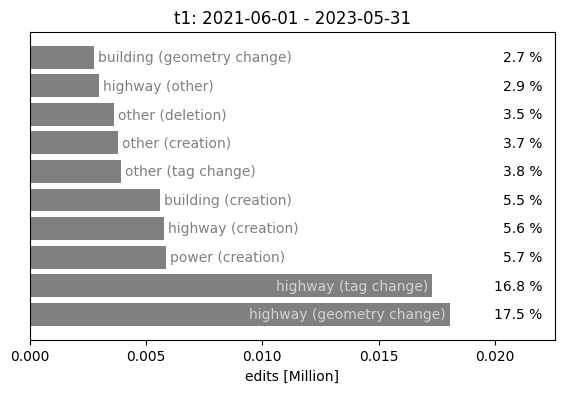

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Apple,geometry change,highway,3946219,0.342,0.342,590,0.650
1,1,1,t0,Kaart,geometry change,highway,2303887,0.199,0.541,117,0.129
2,2,2,t0,Kaart,creation,highway,1478537,0.128,0.669,118,0.130
3,3,3,t0,Kaart,tag change,highway,1072771,0.093,0.762,116,0.128
4,4,4,t0,Apple,creation,highway,773938,0.067,0.829,547,0.603
5,5,5,t0,Kaart,tag + geometry change,highway,393815,0.034,0.863,114,0.126
6,6,6,t0,Apple,tag change,highway,314298,0.027,0.890,507,0.559
7,7,7,t0,Kaart,deletion,highway,241503,0.021,0.911,113,0.125
8,8,8,t0,Kaart,creation,other,156546,0.014,0.924,109,0.120
9,9,9,t0,Apple,tag + geometry change,highway,137105,0.012,0.936,505,0.557


3.946219


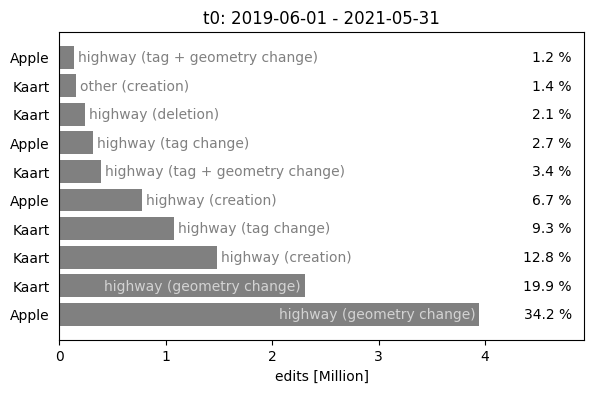

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Kaart,geometry change,highway,443610,0.309,0.309,77,0.099
1,21,1,t1,Apple,geometry change,highway,233583,0.163,0.471,387,0.499
2,22,2,t1,Kaart,creation,highway,154628,0.108,0.579,73,0.094
3,23,3,t1,Kaart,tag change,highway,141391,0.098,0.677,74,0.095
4,24,4,t1,Apple,creation,highway,106458,0.074,0.751,370,0.477
5,25,5,t1,Kaart,tag + geometry change,highway,73685,0.051,0.802,69,0.089
6,26,6,t1,Kaart,deletion,highway,56149,0.039,0.841,61,0.079
7,27,7,t1,Apple,tag change,highway,50957,0.035,0.877,357,0.460
8,28,8,t1,Kaart,creation,place,26818,0.019,0.896,3,0.004
9,29,9,t1,Apple,creation,barrier,16679,0.012,0.907,261,0.336


0.44361


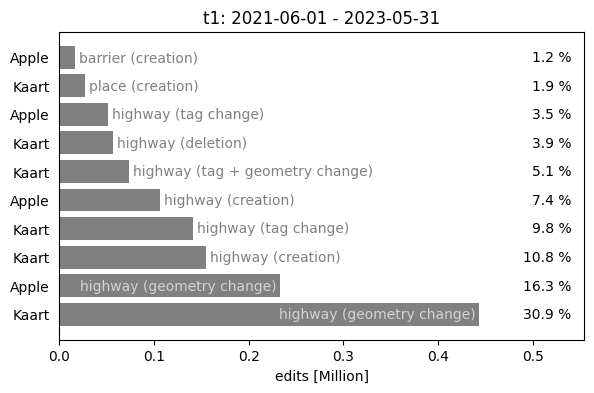

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,1024909,0.427,0.427,2634,0.461
1,41,1,t0,nc,creation,highway,378247,0.158,0.585,2007,0.351
2,42,2,t0,nc,creation,building,199276,0.083,0.668,1397,0.245
3,43,3,t0,nc,tag change,highway,154897,0.065,0.732,1534,0.269
4,44,4,t0,nc,tag + geometry change,highway,75787,0.032,0.764,1134,0.198
5,45,5,t0,nc,tag change,other,49624,0.021,0.784,572,0.100
6,46,6,t0,nc,creation,other,35492,0.015,0.799,1049,0.184
7,47,7,t0,nc,deletion,highway,33074,0.014,0.813,872,0.153
8,48,8,t0,nc,other,other,30315,0.013,0.825,570,0.100
9,49,9,t0,nc,creation,landuse,25911,0.011,0.836,788,0.138


1.024909


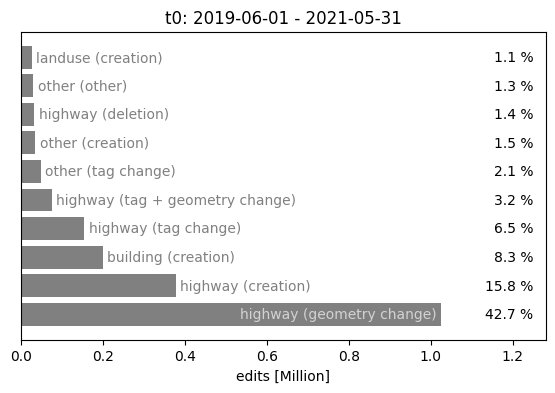

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,1395843,0.409,0.409,1220,0.271
1,61,1,t1,nc,creation,other,913618,0.268,0.676,613,0.136
2,62,2,t1,nc,geometry change,highway,147397,0.043,0.720,1838,0.408
3,63,3,t1,nc,tag change,highway,117245,0.034,0.754,1174,0.261
4,64,4,t1,nc,creation,power,106993,0.031,0.785,87,0.019
5,65,5,t1,nc,tag change,other,88077,0.026,0.811,435,0.097
6,66,6,t1,nc,creation,highway,83549,0.024,0.835,1259,0.280
7,67,7,t1,nc,geometry change,building,28782,0.008,0.844,658,0.146
8,68,8,t1,nc,creation,natural,26254,0.008,0.852,443,0.098
9,69,9,t1,nc,tag + geometry change,highway,23532,0.007,0.858,688,0.153


1.395843


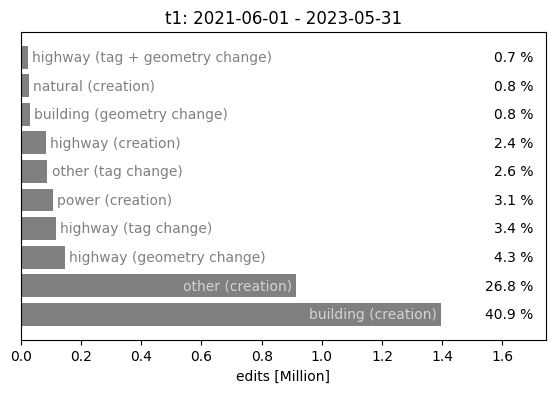

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,DigitalEgypt,creation,other,2209066,0.416,0.416,21,0.160
1,1,1,t0,DigitalEgypt,tag change,other,1168089,0.220,0.635,21,0.160
2,2,2,t0,DigitalEgypt,geometry change,highway,619585,0.117,0.752,21,0.160
3,3,3,t0,DigitalEgypt,creation,highway,313604,0.059,0.811,21,0.160
4,4,4,t0,DigitalEgypt,other,other,253950,0.048,0.859,21,0.160
5,5,5,t0,DigitalEgypt,tag + geometry change,highway,155394,0.029,0.888,21,0.160
6,6,6,t0,DigitalEgypt,deletion,highway,130936,0.025,0.912,21,0.160
7,7,7,t0,DigitalEgypt,tag change,highway,122420,0.023,0.936,21,0.160
8,8,8,t0,Apple,geometry change,highway,109791,0.021,0.956,48,0.366
9,9,9,t0,DigitalEgypt,other,highway,88030,0.017,0.973,21,0.160


2.209066


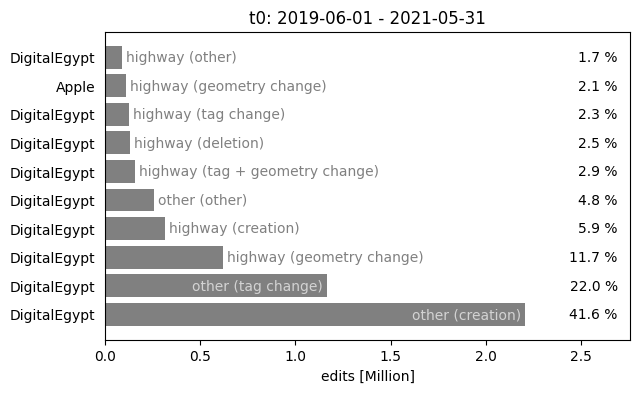

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,DigitalEgypt,tag change,other,179476,0.320,0.320,27,0.119
1,21,1,t1,DigitalEgypt,geometry change,highway,105818,0.189,0.509,31,0.137
2,22,2,t1,DigitalEgypt,creation,highway,63340,0.113,0.622,31,0.137
3,23,3,t1,DigitalEgypt,creation,other,28025,0.050,0.672,28,0.123
4,24,4,t1,TomTom,creation,highway,21889,0.039,0.711,63,0.278
5,25,5,t1,DigitalEgypt,deletion,highway,20020,0.036,0.747,31,0.137
6,26,6,t1,DigitalEgypt,tag change,highway,19767,0.035,0.782,31,0.137
7,27,7,t1,DigitalEgypt,tag + geometry change,highway,17974,0.032,0.814,31,0.137
8,28,8,t1,TomTom,geometry change,highway,17925,0.032,0.846,72,0.317
9,29,9,t1,DigitalEgypt,other,other,8764,0.016,0.862,27,0.119


0.179476


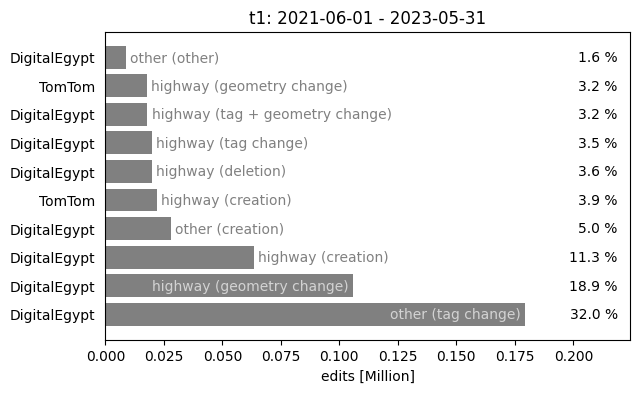

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,1332514,0.528,0.528,645,0.385
1,41,1,t0,nc,creation,highway,518918,0.205,0.733,488,0.292
2,42,2,t0,nc,tag change,highway,141415,0.056,0.789,415,0.248
3,43,3,t0,nc,creation,other,132253,0.052,0.841,327,0.195
4,44,4,t0,nc,tag + geometry change,highway,109901,0.044,0.885,315,0.188
5,45,5,t0,nc,tag change,other,72774,0.029,0.914,283,0.169
6,46,6,t0,nc,deletion,highway,27967,0.011,0.925,273,0.163
7,47,7,t0,nc,other,other,27236,0.011,0.935,293,0.175
8,48,8,t0,nc,creation,building,25356,0.010,0.946,276,0.165
9,49,9,t0,nc,geometry change,building,11425,0.005,0.950,241,0.144


1.332514


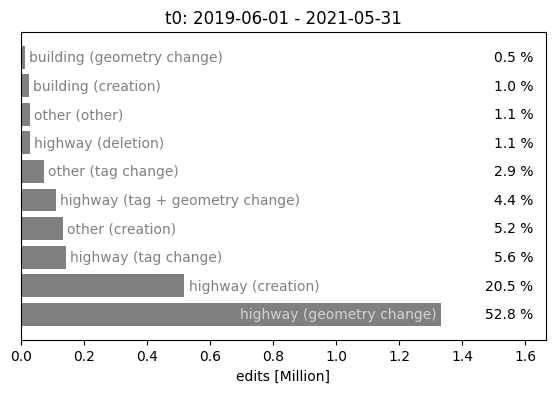

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,135961,0.428,0.428,1672,0.582
1,61,1,t1,nc,geometry change,highway,32837,0.103,0.531,1244,0.433
2,62,2,t1,nc,creation,highway,16105,0.051,0.582,411,0.143
3,63,3,t1,nc,creation,other,11142,0.035,0.617,233,0.081
4,64,4,t1,nc,creation,natural,8734,0.027,0.644,214,0.074
5,65,5,t1,nc,tag change,highway,8345,0.026,0.670,299,0.104
6,66,6,t1,nc,geometry change,building,8152,0.026,0.696,685,0.238
7,67,7,t1,nc,creation,landuse,8025,0.025,0.721,194,0.068
8,68,8,t1,nc,tag change,other,6136,0.019,0.741,221,0.077
9,69,9,t1,nc,deletion,place,4976,0.016,0.756,14,0.005


0.135961


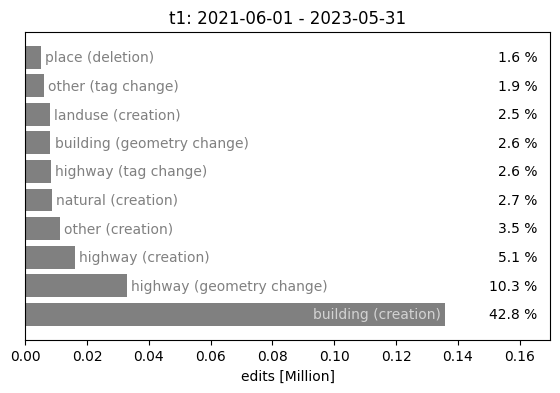

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Kaart,geometry change,highway,14385,0.342,0.342,20,0.260
1,1,1,t0,Kaart,creation,highway,11139,0.265,0.607,20,0.260
2,2,2,t0,Apple,tag change,other,2761,0.066,0.672,24,0.312
3,3,3,t0,Apple,other,other,2243,0.053,0.726,30,0.390
4,4,4,t0,Kaart,tag + geometry change,highway,1519,0.036,0.762,19,0.247
5,5,5,t0,Kaart,tag change,highway,1460,0.035,0.796,18,0.234
6,6,6,t0,Kaart,deletion,highway,1371,0.033,0.829,17,0.221
7,7,7,t0,Apple,geometry change,highway,1040,0.025,0.854,17,0.221
8,8,8,t0,Kaart,creation,other,671,0.016,0.870,18,0.234
9,9,9,t0,Apple,creation,highway,614,0.015,0.884,11,0.143


0.014385


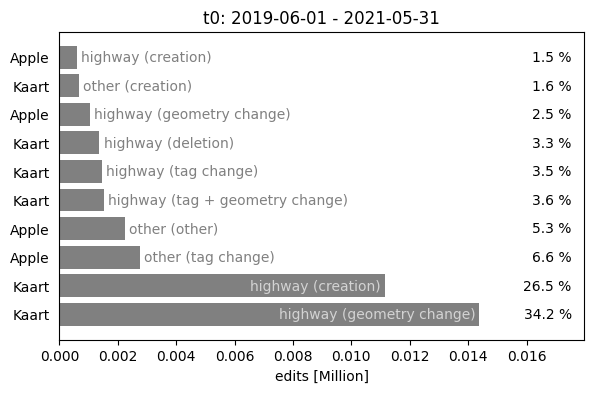

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Kaart,tag change,highway,75675,0.223,0.223,43,0.176
1,21,1,t1,Kaart,geometry change,highway,43119,0.127,0.350,43,0.176
2,22,2,t1,DigitalEgypt,geometry change,highway,32572,0.096,0.445,27,0.111
3,23,3,t1,Apple,geometry change,highway,24139,0.071,0.516,58,0.238
4,24,4,t1,TomTom,creation,building,22789,0.067,0.583,67,0.275
5,25,5,t1,Apple,creation,highway,18308,0.054,0.637,51,0.209
6,26,6,t1,Kaart,creation,highway,17674,0.052,0.689,41,0.168
7,27,7,t1,DigitalEgypt,tag change,highway,13781,0.041,0.730,27,0.111
8,28,8,t1,Kaart,other,highway,12887,0.038,0.768,33,0.135
9,29,9,t1,DigitalEgypt,creation,highway,10554,0.031,0.799,27,0.111


0.075675


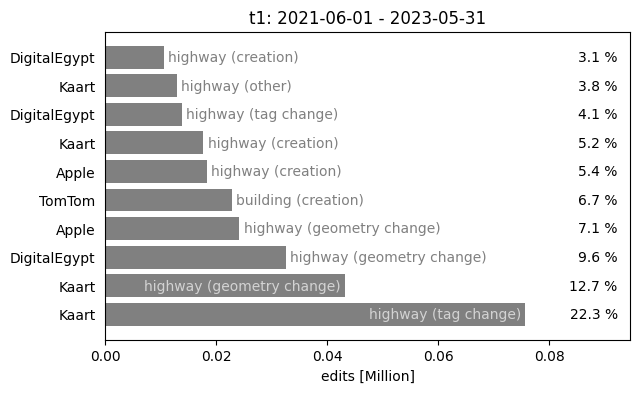

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,6277,0.171,0.171,123,0.335
1,41,1,t0,nc,creation,highway,6064,0.165,0.336,94,0.256
2,42,2,t0,nc,creation,building,5435,0.148,0.484,57,0.155
3,43,3,t0,nc,tag change,highway,4608,0.126,0.610,76,0.207
4,44,4,t0,nc,creation,natural,1439,0.039,0.649,16,0.044
5,45,5,t0,nc,tag change,other,932,0.025,0.675,33,0.090
6,46,6,t0,nc,geometry change,building,744,0.020,0.695,37,0.101
7,47,7,t0,nc,deletion,highway,637,0.017,0.712,45,0.123
8,48,8,t0,nc,tag + geometry change,highway,616,0.017,0.729,62,0.169
9,49,9,t0,nc,creation,landuse,597,0.016,0.745,24,0.065


0.006277


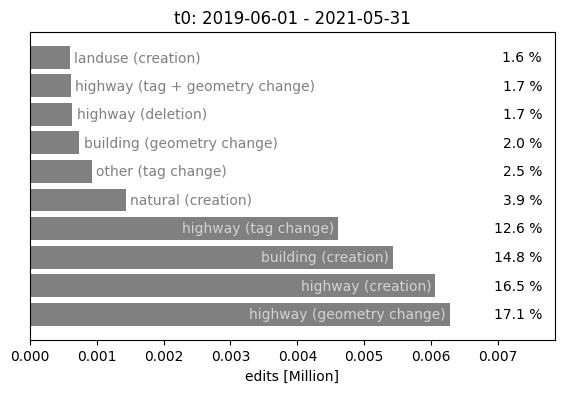

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,96724,0.542,0.542,330,0.531
1,61,1,t1,nc,geometry change,highway,17881,0.100,0.642,242,0.389
2,62,2,t1,nc,creation,highway,17716,0.099,0.742,156,0.251
3,63,3,t1,nc,geometry change,building,5096,0.029,0.770,160,0.257
4,64,4,t1,nc,tag change,highway,3907,0.022,0.792,77,0.124
5,65,5,t1,nc,creation,power,3425,0.019,0.811,12,0.019
6,66,6,t1,nc,creation,waterway,3215,0.018,0.829,6,0.010
7,67,7,t1,nc,creation,barrier,2021,0.011,0.841,38,0.061
8,68,8,t1,nc,creation,landuse,1903,0.011,0.851,60,0.096
9,69,9,t1,nc,creation,amenity,1697,0.010,0.861,90,0.145


0.096724


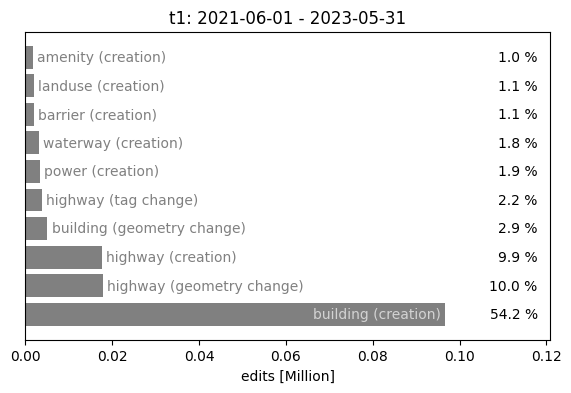

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Kaart,geometry change,highway,35255,0.288,0.288,32,0.222
1,1,1,t0,Kaart,creation,highway,25452,0.208,0.496,32,0.222
2,2,2,t0,Kaart,tag change,highway,16535,0.135,0.631,33,0.229
3,3,3,t0,Kaart,tag + geometry change,highway,4555,0.037,0.668,31,0.215
4,4,4,t0,Amazon,creation,highway,4277,0.035,0.703,9,0.063
5,5,5,t0,Apple,other,other,3453,0.028,0.732,39,0.271
6,6,6,t0,DigitalEgypt,tag change,highway,3410,0.028,0.759,1,0.007
7,7,7,t0,Kaart,deletion,highway,2862,0.023,0.783,31,0.215
8,8,8,t0,Kaart,other,other,2490,0.020,0.803,30,0.208
9,9,9,t0,Amazon,geometry change,highway,2384,0.019,0.823,9,0.063


0.035255


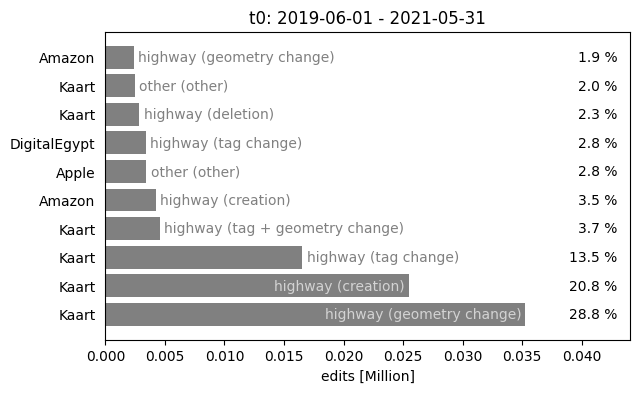

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Apple,creation,building,392804,0.242,0.242,81,0.303
1,21,1,t1,DigitalEgypt,geometry change,highway,340995,0.210,0.453,28,0.105
2,22,2,t1,Apple,geometry change,building,166955,0.103,0.556,94,0.352
3,23,3,t1,DigitalEgypt,tag change,highway,159766,0.099,0.655,29,0.109
4,24,4,t1,DigitalEgypt,deletion,highway,153007,0.094,0.749,28,0.105
5,25,5,t1,DigitalEgypt,creation,highway,126484,0.078,0.827,28,0.105
6,26,6,t1,DigitalEgypt,other,highway,46632,0.029,0.856,28,0.105
7,27,7,t1,DigitalEgypt,tag + geometry change,highway,38601,0.024,0.880,28,0.105
8,28,8,t1,DigitalEgypt,other,other,29244,0.018,0.898,28,0.105
9,29,9,t1,Apple,other,building,15025,0.009,0.907,69,0.258


0.392804


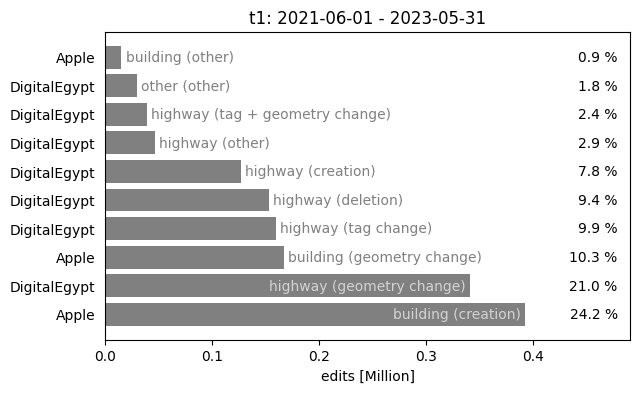

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,39500,0.166,0.166,158,0.138
1,41,1,t0,nc,creation,highway,28647,0.120,0.286,179,0.156
2,42,2,t0,nc,creation,power,24727,0.104,0.389,13,0.011
3,43,3,t0,nc,geometry change,highway,23149,0.097,0.487,253,0.221
4,44,4,t0,nc,tag change,highway,21617,0.091,0.577,159,0.139
5,45,5,t0,nc,creation,barrier,9569,0.040,0.617,52,0.045
6,46,6,t0,nc,creation,other,7734,0.032,0.650,125,0.109
7,47,7,t0,nc,creation,landuse,6089,0.026,0.675,65,0.057
8,48,8,t0,nc,creation,natural,5786,0.024,0.700,45,0.039
9,49,9,t0,nc,creation,waterway,5284,0.022,0.722,14,0.012


0.0395


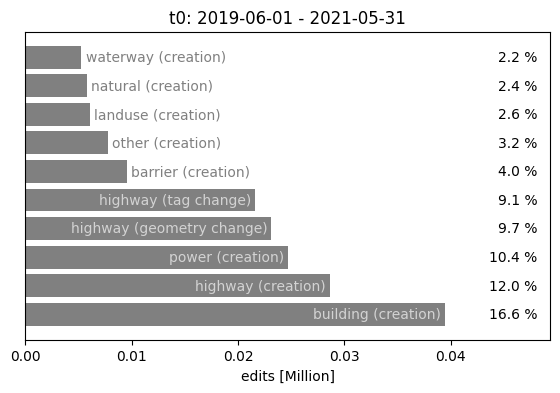

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,highway,429224,0.396,0.396,186,0.145
1,61,1,t1,nc,deletion,highway,288692,0.266,0.662,105,0.082
2,62,2,t1,nc,creation,other,77082,0.071,0.733,130,0.101
3,63,3,t1,nc,creation,power,49569,0.046,0.779,23,0.018
4,64,4,t1,nc,creation,building,46147,0.043,0.821,297,0.231
5,65,5,t1,nc,tag change,highway,37483,0.035,0.856,208,0.162
6,66,6,t1,nc,geometry change,highway,32431,0.030,0.886,267,0.208
7,67,7,t1,nc,tag change,building,16060,0.015,0.901,214,0.167
8,68,8,t1,nc,tag change,other,13566,0.013,0.913,124,0.097
9,69,9,t1,nc,tag + geometry change,highway,10456,0.010,0.923,95,0.074


0.429224


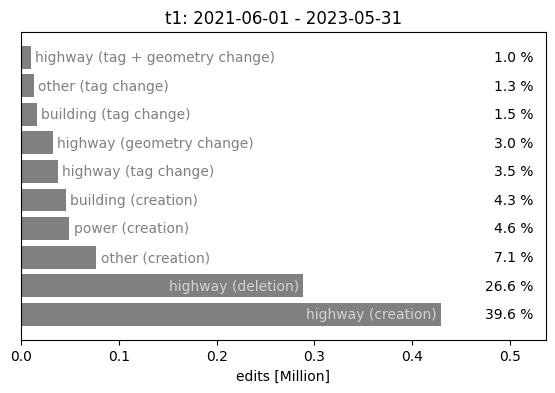

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Meta,geometry change,highway,1613340,0.381,0.381,85,0.200
1,1,1,t0,Meta,creation,highway,1334252,0.315,0.696,82,0.192
2,2,2,t0,Grab,creation,highway,270760,0.064,0.760,140,0.329
3,3,3,t0,Grab,geometry change,highway,217133,0.051,0.811,144,0.338
4,4,4,t0,Meta,deletion,highway,214856,0.051,0.862,79,0.185
5,5,5,t0,Meta,tag + geometry change,highway,68627,0.016,0.878,78,0.183
6,6,6,t0,Kaart,tag change,highway,63022,0.015,0.893,38,0.089
7,7,7,t0,Meta,other,highway,62897,0.015,0.907,69,0.162
8,8,8,t0,Meta,tag change,highway,58510,0.014,0.921,79,0.185
9,9,9,t0,Kaart,geometry change,highway,39923,0.009,0.931,38,0.089


1.61334


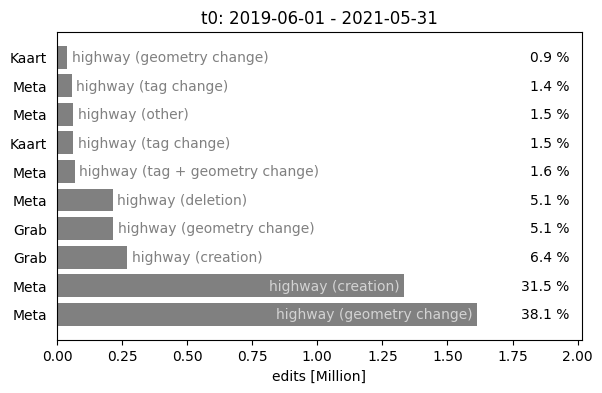

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Meta,geometry change,highway,158733,0.280,0.280,49,0.116
1,21,1,t1,Grab,geometry change,highway,109977,0.194,0.474,214,0.508
2,22,2,t1,Grab,creation,highway,73862,0.130,0.605,188,0.447
3,23,3,t1,Meta,creation,highway,41858,0.074,0.679,45,0.107
4,24,4,t1,Grab,creation,building,33757,0.060,0.738,14,0.033
5,25,5,t1,Grab,tag change,highway,30416,0.054,0.792,197,0.468
6,26,6,t1,Meta,deletion,highway,14720,0.026,0.818,45,0.107
7,27,7,t1,Meta,tag change,highway,11320,0.020,0.838,45,0.107
8,28,8,t1,Apple,geometry change,building,8498,0.015,0.853,5,0.012
9,29,9,t1,Grab,tag + geometry change,highway,8178,0.014,0.868,164,0.390


0.158733


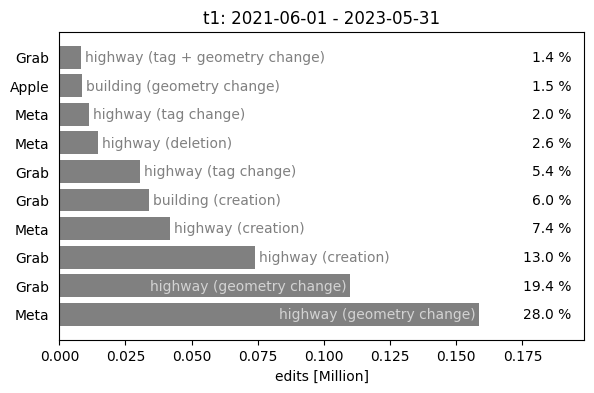

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,highway,960690,0.356,0.356,1324,0.239
1,41,1,t0,nc,geometry change,highway,918588,0.341,0.697,1997,0.361
2,42,2,t0,nc,creation,building,336388,0.125,0.822,2356,0.426
3,43,3,t0,nc,tag change,highway,70815,0.026,0.848,806,0.146
4,44,4,t0,nc,geometry change,building,58661,0.022,0.870,1283,0.232
5,45,5,t0,nc,deletion,other,37157,0.014,0.884,184,0.033
6,46,6,t0,nc,tag + geometry change,highway,36907,0.014,0.898,607,0.110
7,47,7,t0,nc,deletion,building,34091,0.013,0.910,572,0.103
8,48,8,t0,nc,deletion,highway,33607,0.012,0.923,601,0.109
9,49,9,t0,nc,tag change,other,15418,0.006,0.928,383,0.069


0.96069


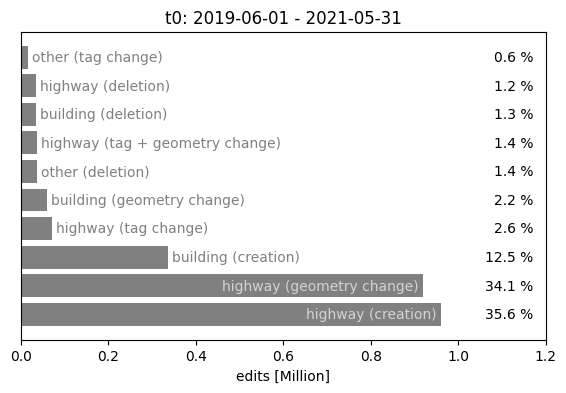

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,geometry change,highway,260171,0.246,0.246,920,0.395
1,61,1,t1,nc,creation,highway,180975,0.171,0.417,633,0.272
2,62,2,t1,nc,tag change,highway,125384,0.118,0.535,585,0.251
3,63,3,t1,nc,creation,building,92132,0.087,0.622,531,0.228
4,64,4,t1,nc,deletion,highway,51211,0.048,0.670,371,0.159
5,65,5,t1,nc,tag + geometry change,highway,27537,0.026,0.696,359,0.154
6,66,6,t1,nc,creation,power,24638,0.023,0.719,41,0.018
7,67,7,t1,nc,geometry change,building,17510,0.017,0.736,367,0.157
8,68,8,t1,nc,other,highway,17063,0.016,0.752,384,0.165
9,69,9,t1,nc,deletion,building,16520,0.016,0.768,172,0.074


0.260171


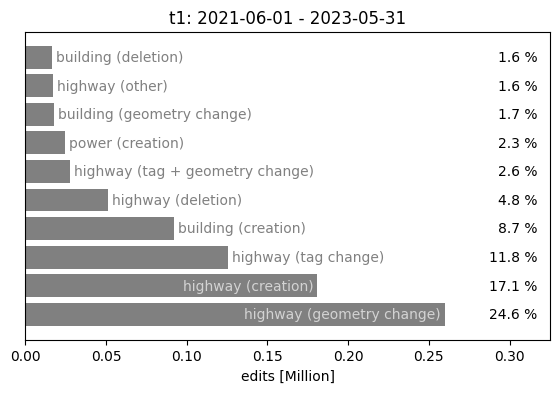

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Kaart,tag change,other,250057,0.165,0.165,20,0.094
1,1,1,t0,Kaart,creation,other,176592,0.117,0.282,23,0.108
2,2,2,t0,Kaart,geometry change,highway,170762,0.113,0.395,28,0.132
3,3,3,t0,Kaart,tag change,highway,168375,0.111,0.507,27,0.127
4,4,4,t0,Kaart,creation,highway,152790,0.101,0.608,26,0.123
5,5,5,t0,Apple,tag change,other,96175,0.064,0.671,68,0.321
6,6,6,t0,Apple,other,other,61578,0.041,0.712,89,0.420
7,7,7,t0,Microsoft,creation,highway,61334,0.041,0.753,30,0.142
8,8,8,t0,Kaart,tag + geometry change,highway,53247,0.035,0.788,24,0.113
9,9,9,t0,Kaart,other,other,32209,0.021,0.809,27,0.127


0.250057


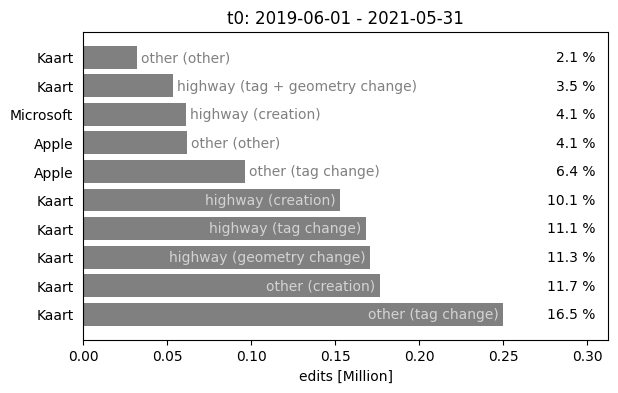

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Kaart,tag change,highway,364778,0.236,0.236,50,0.236
1,21,1,t1,Kaart,geometry change,highway,260144,0.168,0.404,53,0.250
2,22,2,t1,Kaart,tag change,other,190457,0.123,0.527,38,0.179
3,23,3,t1,Kaart,creation,highway,148672,0.096,0.623,52,0.245
4,24,4,t1,Kaart,creation,other,116363,0.075,0.698,41,0.193
5,25,5,t1,Kaart,tag + geometry change,highway,82795,0.054,0.752,50,0.236
6,26,6,t1,Kaart,other,other,72512,0.047,0.799,44,0.208
7,27,7,t1,Kaart,geometry change,building,56784,0.037,0.835,23,0.108
8,28,8,t1,Kaart,other,highway,39212,0.025,0.861,48,0.226
9,29,9,t1,Kaart,deletion,other,19730,0.013,0.874,15,0.071


0.364778


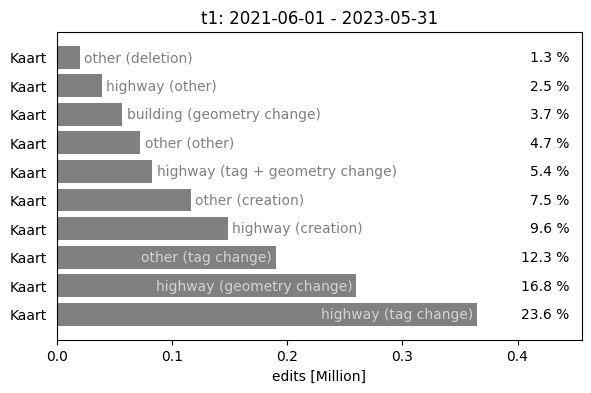

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,tag change,other,410962,0.239,0.239,364,0.135
1,41,1,t0,nc,tag change,power,193783,0.113,0.352,36,0.013
2,42,2,t0,nc,other,other,193422,0.112,0.464,409,0.151
3,43,3,t0,nc,creation,building,133034,0.077,0.541,517,0.191
4,44,4,t0,nc,geometry change,highway,112273,0.065,0.607,989,0.366
5,45,5,t0,nc,creation,natural,102818,0.060,0.667,367,0.136
6,46,6,t0,nc,creation,highway,70528,0.041,0.708,731,0.270
7,47,7,t0,nc,deletion,other,50162,0.029,0.737,290,0.107
8,48,8,t0,nc,creation,other,41014,0.024,0.761,419,0.155
9,49,9,t0,nc,tag change,highway,38624,0.022,0.783,664,0.246


0.410962


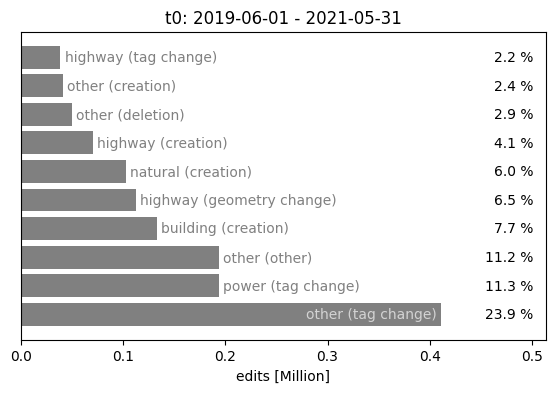

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,104065,0.140,0.140,438,0.228
1,61,1,t1,nc,geometry change,highway,88301,0.119,0.259,705,0.367
2,62,2,t1,nc,tag change,highway,64893,0.087,0.347,560,0.291
3,63,3,t1,nc,creation,highway,62920,0.085,0.431,534,0.278
4,64,4,t1,nc,creation,natural,48364,0.065,0.497,222,0.115
5,65,5,t1,nc,tag change,other,39657,0.053,0.550,249,0.129
6,66,6,t1,nc,creation,landuse,22419,0.030,0.580,235,0.122
7,67,7,t1,nc,creation,other,19695,0.027,0.607,305,0.159
8,68,8,t1,nc,tag change,building,17586,0.024,0.631,334,0.174
9,69,9,t1,nc,other,other,17375,0.023,0.654,287,0.149


0.104065


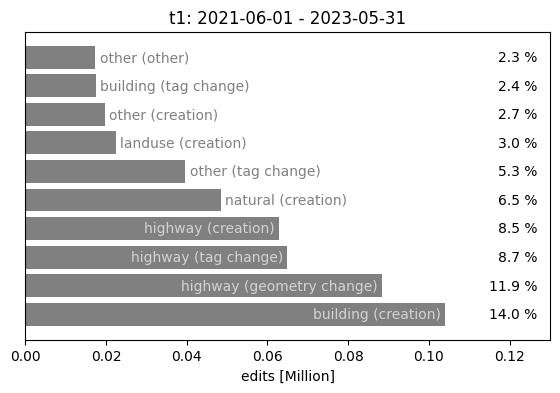

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Apple,geometry change,highway,619800,0.261,0.261,247,0.373
1,1,1,t0,Meta,geometry change,highway,403149,0.170,0.431,91,0.137
2,2,2,t0,Meta,creation,highway,241906,0.102,0.533,88,0.133
3,3,3,t0,Kaart,tag change,highway,134278,0.057,0.590,40,0.060
4,4,4,t0,Apple,creation,highway,115168,0.049,0.638,208,0.314
5,5,5,t0,Kaart,geometry change,highway,105726,0.045,0.683,38,0.057
6,6,6,t0,Grab,creation,highway,70952,0.030,0.713,211,0.319
7,7,7,t0,Grab,geometry change,highway,68516,0.029,0.742,210,0.317
8,8,8,t0,Kaart,creation,highway,62696,0.026,0.768,38,0.057
9,9,9,t0,Apple,tag change,highway,58492,0.025,0.793,161,0.243


0.6198


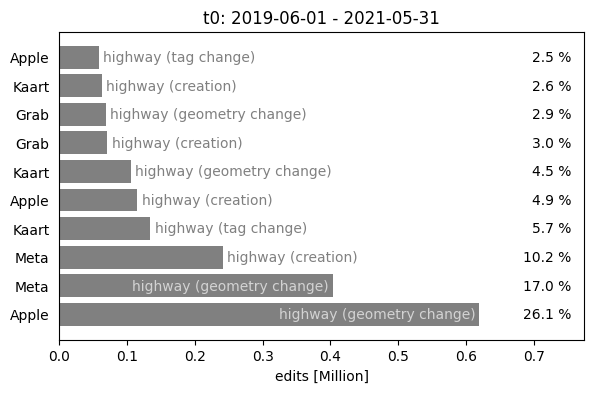

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Grab,creation,building,184007,0.288,0.288,48,0.062
1,21,1,t1,Apple,geometry change,highway,114814,0.179,0.467,375,0.481
2,22,2,t1,Kaart,tag change,highway,98358,0.154,0.621,4,0.005
3,23,3,t1,Apple,creation,highway,30163,0.047,0.668,314,0.403
4,24,4,t1,Grab,geometry change,highway,23099,0.036,0.704,233,0.299
5,25,5,t1,Grab,tag change,highway,22925,0.036,0.740,179,0.230
6,26,6,t1,Grab,creation,highway,19148,0.030,0.770,214,0.275
7,27,7,t1,Grab,geometry change,building,17568,0.027,0.797,48,0.062
8,28,8,t1,Kaart,geometry change,highway,17514,0.027,0.824,6,0.008
9,29,9,t1,Apple,tag change,highway,16008,0.025,0.850,312,0.401


0.184007


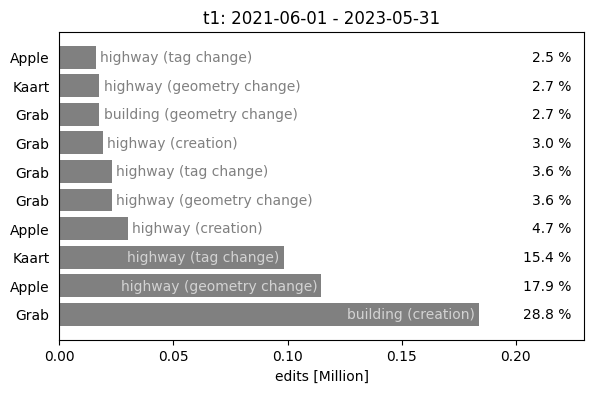

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,706076,0.419,0.419,1185,0.436
1,41,1,t0,nc,creation,highway,290869,0.173,0.592,986,0.363
2,42,2,t0,nc,creation,building,207282,0.123,0.715,622,0.229
3,43,3,t0,nc,tag change,highway,106352,0.063,0.778,779,0.287
4,44,4,t0,nc,tag + geometry change,highway,56069,0.033,0.811,577,0.213
5,45,5,t0,nc,deletion,highway,30715,0.018,0.829,501,0.185
6,46,6,t0,nc,geometry change,building,30333,0.018,0.847,492,0.181
7,47,7,t0,nc,other,highway,17610,0.010,0.858,486,0.179
8,48,8,t0,nc,other,other,14230,0.008,0.866,361,0.133
9,49,9,t0,nc,creation,other,13735,0.008,0.874,535,0.197


0.706076


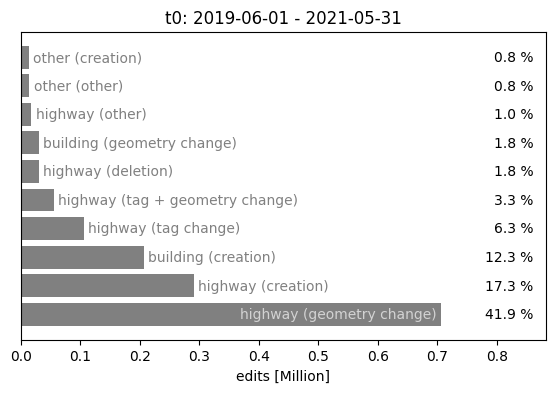

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,202493,0.246,0.246,397,0.210
1,61,1,t1,nc,geometry change,highway,143502,0.174,0.420,699,0.370
2,62,2,t1,nc,creation,highway,62746,0.076,0.497,514,0.272
3,63,3,t1,nc,tag change,highway,55632,0.068,0.564,482,0.255
4,64,4,t1,nc,creation,natural,37934,0.046,0.610,118,0.063
5,65,5,t1,nc,tag change,building,35606,0.043,0.654,287,0.152
6,66,6,t1,nc,tag + geometry change,highway,24578,0.030,0.684,278,0.147
7,67,7,t1,nc,deletion,highway,19198,0.023,0.707,228,0.121
8,68,8,t1,nc,geometry change,building,18901,0.023,0.730,259,0.137
9,69,9,t1,nc,creation,amenity,12990,0.016,0.746,442,0.234


0.202493


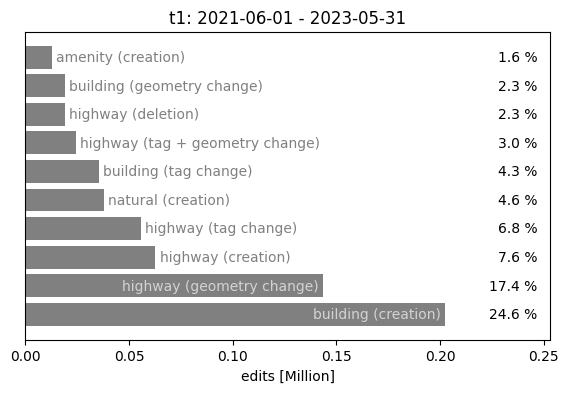

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Kaart,geometry change,highway,433307,0.404,0.404,91,0.285
1,1,1,t0,Kaart,creation,highway,220151,0.205,0.610,90,0.282
2,2,2,t0,Kaart,tag change,highway,113010,0.105,0.715,91,0.285
3,3,3,t0,Kaart,tag + geometry change,highway,60303,0.056,0.772,87,0.273
4,4,4,t0,Kaart,deletion,highway,46880,0.044,0.816,85,0.266
5,5,5,t0,Microsoft,geometry change,highway,26553,0.025,0.840,33,0.103
6,6,6,t0,Microsoft,creation,highway,26239,0.024,0.865,33,0.103
7,7,7,t0,Kaart,other,other,20977,0.020,0.884,85,0.266
8,8,8,t0,Kaart,geometry change,building,10757,0.010,0.894,76,0.238
9,9,9,t0,Apple,other,other,10303,0.010,0.904,75,0.235


0.433307


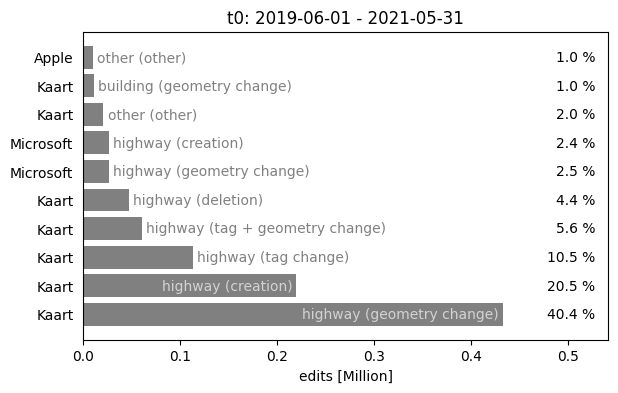

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Apple,geometry change,highway,558171,0.285,0.285,308,0.538
1,21,1,t1,Kaart,creation,building,481308,0.246,0.531,12,0.021
2,22,2,t1,Kaart,geometry change,highway,147901,0.076,0.607,70,0.122
3,23,3,t1,Apple,creation,highway,128128,0.065,0.672,291,0.508
4,24,4,t1,Kaart,tag change,highway,83933,0.043,0.715,64,0.112
5,25,5,t1,Kaart,creation,highway,69309,0.035,0.750,66,0.115
6,26,6,t1,Apple,tag change,highway,55409,0.028,0.779,283,0.494
7,27,7,t1,Apple,geometry change,building,48164,0.025,0.803,213,0.372
8,28,8,t1,Kaart,other,highway,38960,0.020,0.823,60,0.105
9,29,9,t1,Kaart,geometry change,building,33668,0.017,0.840,34,0.059


0.558171


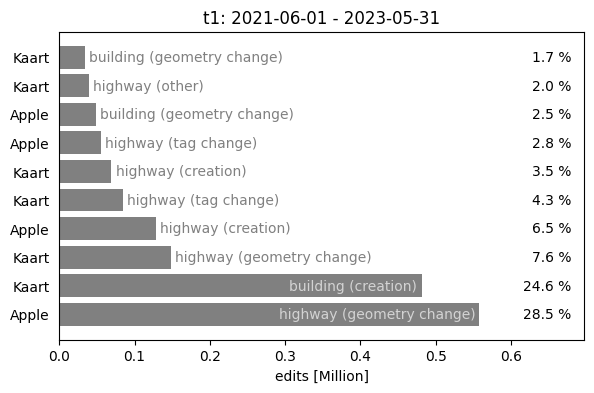

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,800477,0.428,0.428,5470,0.632
1,41,1,t0,nc,geometry change,highway,164280,0.088,0.516,3881,0.449
2,42,2,t0,nc,deletion,building,131966,0.071,0.586,1574,0.182
3,43,3,t0,nc,creation,highway,114705,0.061,0.647,2509,0.290
4,44,4,t0,nc,geometry change,building,105630,0.056,0.704,2947,0.341
5,45,5,t0,nc,tag change,building,61697,0.033,0.737,805,0.093
6,46,6,t0,nc,tag change,highway,43465,0.023,0.760,943,0.109
7,47,7,t0,nc,creation,other,32303,0.017,0.777,921,0.106
8,48,8,t0,nc,creation,natural,31097,0.017,0.794,858,0.099
9,49,9,t0,nc,tag + geometry change,highway,28683,0.015,0.809,720,0.083


0.800477


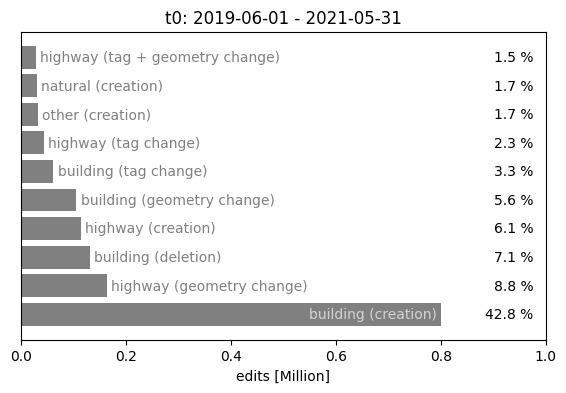

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,271905,0.298,0.298,1858,0.464
1,61,1,t1,nc,geometry change,highway,113883,0.125,0.423,1488,0.372
2,62,2,t1,nc,tag change,highway,61909,0.068,0.491,631,0.158
3,63,3,t1,nc,creation,highway,55713,0.061,0.552,955,0.239
4,64,4,t1,nc,geometry change,building,42179,0.046,0.598,1061,0.265
5,65,5,t1,nc,deletion,building,36427,0.040,0.638,661,0.165
6,66,6,t1,nc,creation,natural,33232,0.036,0.675,460,0.115
7,67,7,t1,nc,other,highway,18348,0.020,0.695,412,0.103
8,68,8,t1,nc,tag change,building,18030,0.020,0.715,514,0.128
9,69,9,t1,nc,deletion,highway,16345,0.018,0.733,381,0.095


0.271905


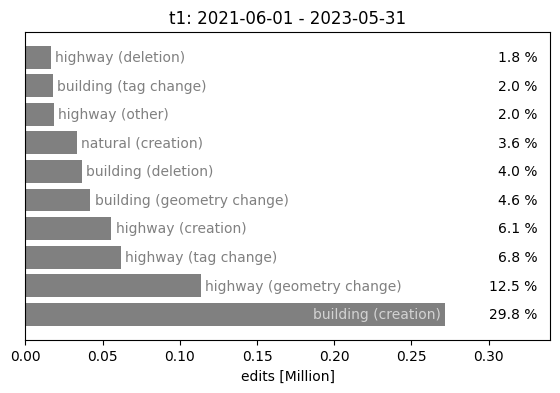

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Kaart,geometry change,highway,21080,0.273,0.273,30,0.492
1,1,1,t0,Kaart,creation,highway,16212,0.210,0.483,30,0.492
2,2,2,t0,Apple,geometry change,highway,12002,0.155,0.638,12,0.197
3,3,3,t0,Apple,creation,building,7635,0.099,0.737,6,0.098
4,4,4,t0,Apple,creation,highway,4356,0.056,0.793,10,0.164
5,5,5,t0,Kaart,tag change,highway,3732,0.048,0.841,29,0.475
6,6,6,t0,Kaart,tag + geometry change,highway,1739,0.023,0.864,28,0.459
7,7,7,t0,Apple,other,other,1543,0.020,0.884,8,0.131
8,8,8,t0,Kaart,geometry change,building,1026,0.013,0.897,22,0.361
9,9,9,t0,Kaart,other,other,926,0.012,0.909,25,0.410


0.02108


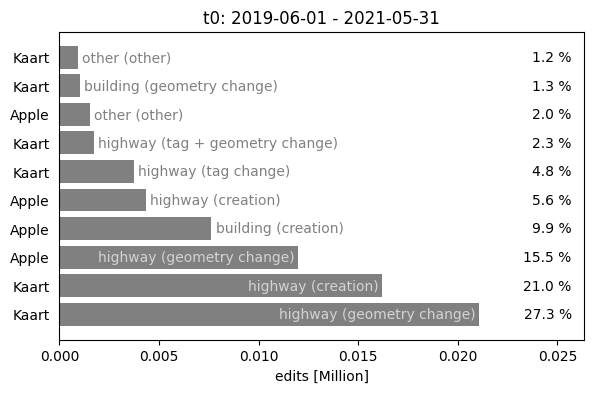

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,TomTom,geometry change,highway,19626,0.294,0.294,118,0.420
1,21,1,t1,TomTom,creation,highway,15805,0.237,0.531,110,0.391
2,22,2,t1,Apple,geometry change,highway,10114,0.151,0.682,100,0.356
3,23,3,t1,Apple,creation,building,7478,0.112,0.794,5,0.018
4,24,4,t1,Apple,creation,highway,4675,0.070,0.864,81,0.288
5,25,5,t1,Apple,tag change,highway,1337,0.020,0.884,84,0.299
6,26,6,t1,Microsoft,creation,building,727,0.011,0.895,5,0.018
7,27,7,t1,Apple,tag + geometry change,highway,702,0.011,0.905,66,0.235
8,28,8,t1,Microsoft,creation,highway,690,0.010,0.916,11,0.039
9,29,9,t1,Microsoft,geometry change,highway,622,0.009,0.925,12,0.043


0.019626


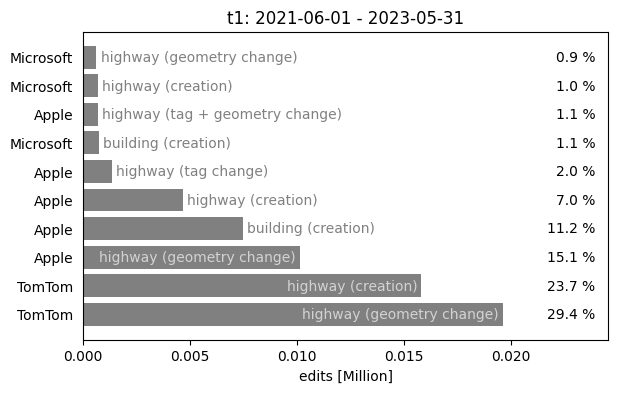

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,12595,0.186,0.186,118,0.203
1,41,1,t0,nc,tag change,highway,11250,0.166,0.352,101,0.174
2,42,2,t0,nc,geometry change,highway,10967,0.162,0.515,209,0.360
3,43,3,t0,nc,creation,highway,6040,0.089,0.604,139,0.239
4,44,4,t0,nc,creation,power,3553,0.053,0.656,8,0.014
5,45,5,t0,nc,tag + geometry change,highway,1732,0.026,0.682,56,0.096
6,46,6,t0,nc,other,other,1671,0.025,0.707,45,0.077
7,47,7,t0,nc,creation,shop,1542,0.023,0.729,92,0.158
8,48,8,t0,nc,geometry change,building,1226,0.018,0.748,66,0.114
9,49,9,t0,nc,deletion,other,1132,0.017,0.764,37,0.064


0.012595


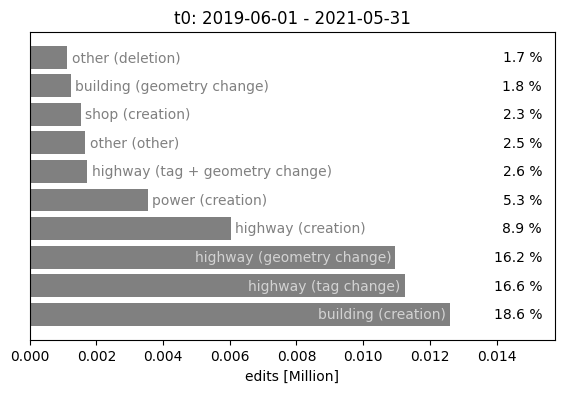

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,29837,0.309,0.309,431,0.482
1,61,1,t1,nc,geometry change,highway,11909,0.123,0.432,303,0.339
2,62,2,t1,nc,creation,highway,11816,0.122,0.554,168,0.188
3,63,3,t1,nc,geometry change,building,8412,0.087,0.641,184,0.206
4,64,4,t1,nc,tag change,highway,6080,0.063,0.704,131,0.146
5,65,5,t1,nc,deletion,highway,2844,0.029,0.734,62,0.069
6,66,6,t1,nc,deletion,building,2077,0.021,0.755,126,0.141
7,67,7,t1,nc,tag change,building,1568,0.016,0.771,82,0.092
8,68,8,t1,nc,tag + geometry change,highway,1538,0.016,0.787,81,0.091
9,69,9,t1,nc,other,building,1306,0.014,0.801,57,0.064


0.029837


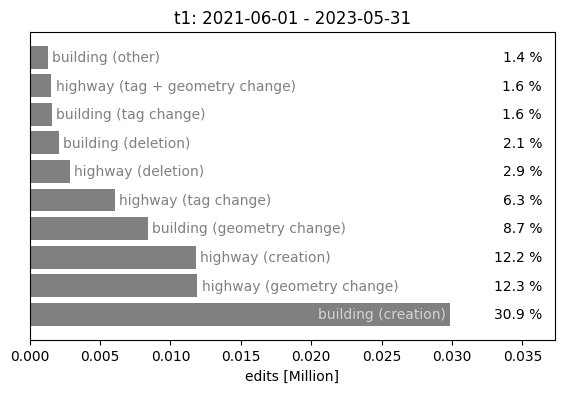

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Meta,creation,highway,2103802,0.408,0.408,92,0.089
1,1,1,t0,Meta,geometry change,highway,1871424,0.363,0.772,103,0.100
2,2,2,t0,Meta,deletion,highway,181478,0.035,0.807,91,0.088
3,3,3,t0,Meta,tag change,highway,159037,0.031,0.838,94,0.091
4,4,4,t0,Kaart,creation,building,147713,0.029,0.866,9,0.009
5,5,5,t0,Meta,tag + geometry change,highway,132594,0.026,0.892,89,0.086
6,6,6,t0,Meta,geometry change,building,80183,0.016,0.908,100,0.097
7,7,7,t0,Amazon,creation,building,58290,0.011,0.919,575,0.558
8,8,8,t0,Kaart,geometry change,building,54550,0.011,0.930,8,0.008
9,9,9,t0,Uber,geometry change,highway,38558,0.007,0.937,35,0.034


2.103802


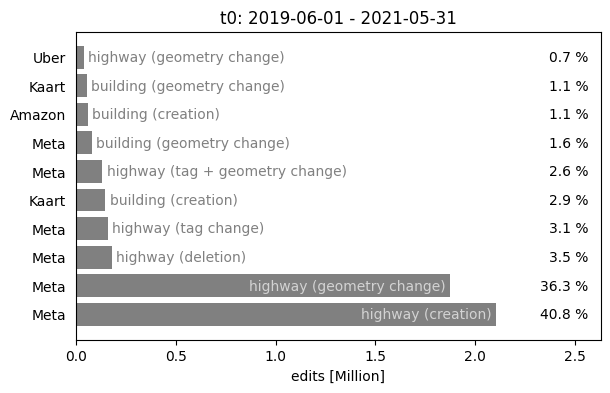

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Meta,creation,highway,2789578,0.440,0.440,92,0.163
1,21,1,t1,Meta,geometry change,highway,2763058,0.436,0.876,107,0.190
2,22,2,t1,Meta,deletion,highway,239360,0.038,0.914,90,0.160
3,23,3,t1,Meta,tag change,highway,147149,0.023,0.937,100,0.178
4,24,4,t1,Meta,tag + geometry change,highway,128705,0.020,0.957,89,0.158
5,25,5,t1,Meta,geometry change,building,69462,0.011,0.968,103,0.183
6,26,6,t1,Stackbox,creation,highway,28465,0.004,0.973,14,0.025
7,27,7,t1,TomTom,geometry change,highway,24820,0.004,0.977,84,0.149
8,28,8,t1,Meta,other,highway,13024,0.002,0.979,98,0.174
9,29,9,t1,Meta,geometry change,waterway,10233,0.002,0.981,89,0.158


2.789578


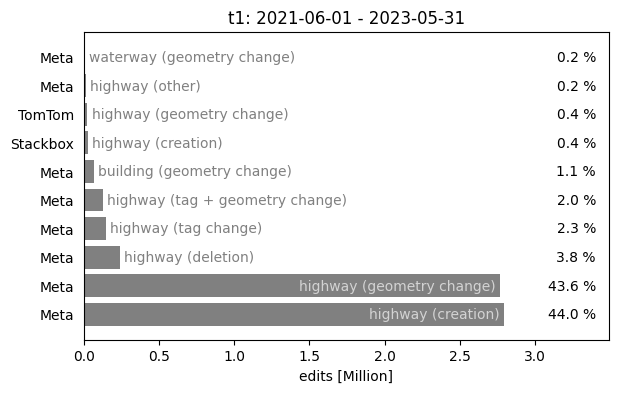

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,3247254,0.388,0.388,23048,0.661
1,41,1,t0,nc,creation,highway,837625,0.100,0.488,11090,0.318
2,42,2,t0,nc,geometry change,building,685170,0.082,0.570,9526,0.273
3,43,3,t0,nc,geometry change,highway,598595,0.072,0.641,12452,0.357
4,44,4,t0,nc,deletion,building,220324,0.026,0.668,5262,0.151
5,45,5,t0,nc,creation,amenity,177737,0.021,0.689,6456,0.185
6,46,6,t0,nc,tag change,highway,171892,0.021,0.710,4343,0.125
7,47,7,t0,nc,creation,landuse,152357,0.018,0.728,4675,0.134
8,48,8,t0,nc,deletion,highway,140462,0.017,0.745,2722,0.078
9,49,9,t0,nc,tag change,building,138039,0.016,0.761,3985,0.114


3.247254


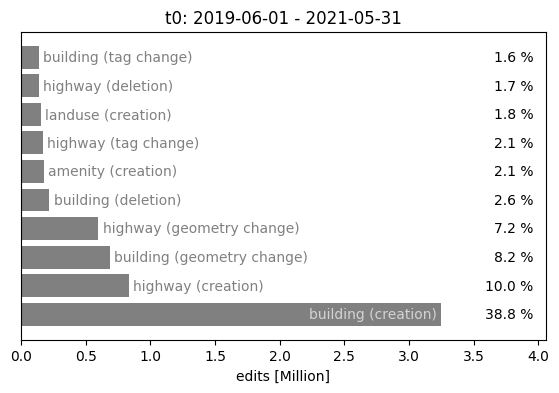

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,1862676,0.310,0.310,8076,0.518
1,61,1,t1,nc,creation,highway,992493,0.165,0.475,4996,0.320
2,62,2,t1,nc,geometry change,highway,830784,0.138,0.613,6752,0.433
3,63,3,t1,nc,geometry change,building,296499,0.049,0.662,4271,0.274
4,64,4,t1,nc,tag change,highway,248157,0.041,0.703,2950,0.189
5,65,5,t1,nc,creation,power,122839,0.020,0.724,280,0.018
6,66,6,t1,nc,deletion,building,121279,0.020,0.744,2512,0.161
7,67,7,t1,nc,creation,landuse,108248,0.018,0.762,2441,0.156
8,68,8,t1,nc,creation,place,105236,0.017,0.779,651,0.042
9,69,9,t1,nc,deletion,highway,69037,0.011,0.791,1800,0.115


1.862676


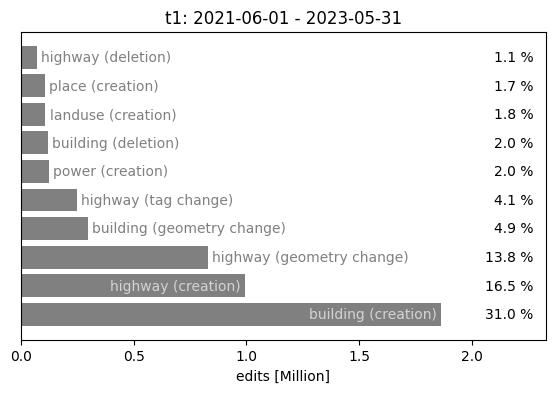

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Kaart,geometry change,highway,11455,0.366,0.366,23,0.338
1,1,1,t0,Kaart,creation,highway,7359,0.235,0.601,23,0.338
2,2,2,t0,Kaart,tag change,highway,4070,0.130,0.731,21,0.309
3,3,3,t0,Apple,other,other,1862,0.059,0.790,17,0.250
4,4,4,t0,Kaart,tag + geometry change,highway,1404,0.045,0.835,20,0.294
5,5,5,t0,Apple,creation,building,1205,0.038,0.873,5,0.074
6,6,6,t0,Kaart,deletion,highway,866,0.028,0.901,17,0.250
7,7,7,t0,Kaart,geometry change,building,652,0.021,0.922,8,0.118
8,8,8,t0,Kaart,other,highway,593,0.019,0.941,19,0.279
9,9,9,t0,Apple,geometry change,highway,333,0.011,0.951,15,0.221


0.011455


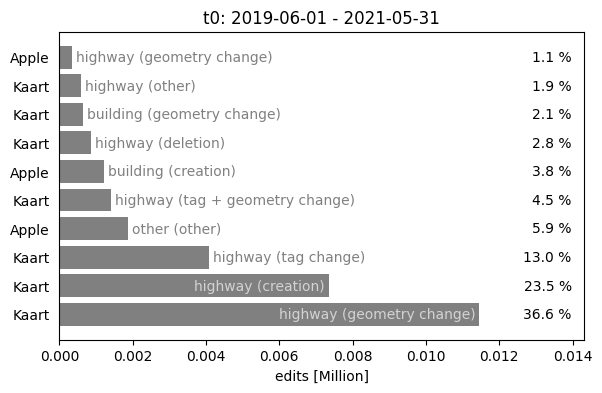

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,DigitalEgypt,geometry change,highway,37574,0.261,0.261,21,0.188
1,21,1,t1,Kaart,tag change,highway,18966,0.132,0.393,18,0.161
2,22,2,t1,Apple,geometry change,highway,17522,0.122,0.515,37,0.330
3,23,3,t1,DigitalEgypt,creation,highway,13240,0.092,0.607,19,0.170
4,24,4,t1,Kaart,geometry change,highway,11249,0.078,0.685,17,0.152
5,25,5,t1,Apple,creation,highway,7986,0.056,0.741,37,0.330
6,26,6,t1,DigitalEgypt,tag change,highway,5191,0.036,0.777,21,0.188
7,27,7,t1,Kaart,creation,highway,4211,0.029,0.806,17,0.152
8,28,8,t1,Apple,tag change,highway,3811,0.026,0.833,37,0.330
9,29,9,t1,DigitalEgypt,deletion,highway,3363,0.023,0.856,20,0.179


0.037574


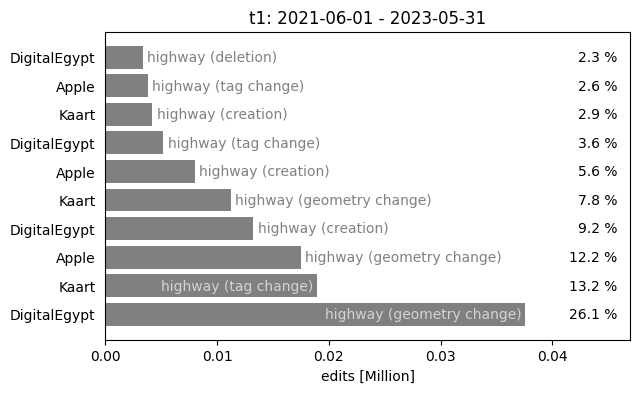

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,tag change,building,147262,0.814,0.814,38,0.134
1,41,1,t0,nc,creation,building,7470,0.041,0.856,35,0.123
2,42,2,t0,nc,geometry change,highway,5255,0.029,0.885,68,0.239
3,43,3,t0,nc,tag change,highway,5000,0.028,0.912,37,0.130
4,44,4,t0,nc,creation,highway,2599,0.014,0.927,50,0.176
5,45,5,t0,nc,deletion,other,2338,0.013,0.940,16,0.056
6,46,6,t0,nc,creation,amenity,2084,0.012,0.951,42,0.148
7,47,7,t0,nc,tag change,other,1145,0.006,0.958,25,0.088
8,48,8,t0,nc,creation,power,873,0.005,0.962,8,0.028
9,49,9,t0,nc,other,other,750,0.004,0.967,16,0.056


0.147262


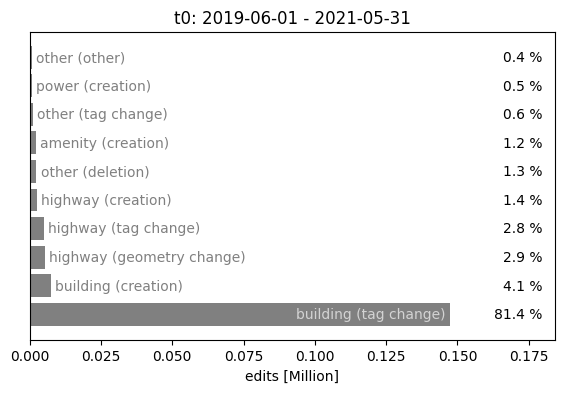

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,other,11166,0.161,0.161,21,0.096
1,61,1,t1,nc,deletion,other,9488,0.137,0.298,12,0.055
2,62,2,t1,nc,creation,power,7298,0.105,0.403,8,0.037
3,63,3,t1,nc,tag change,building,5113,0.074,0.477,31,0.142
4,64,4,t1,nc,tag change,highway,3306,0.048,0.525,26,0.119
5,65,5,t1,nc,creation,highway,3228,0.047,0.571,42,0.192
6,66,6,t1,nc,creation,building,3189,0.046,0.617,35,0.160
7,67,7,t1,nc,creation,amenity' 'building,3028,0.044,0.661,18,0.082
8,68,8,t1,nc,creation,man_made,2667,0.038,0.699,13,0.059
9,69,9,t1,nc,geometry change,highway,2542,0.037,0.736,61,0.279


0.011166


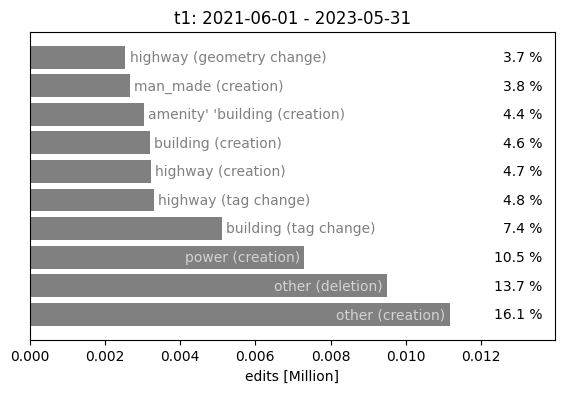

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Meta,geometry change,highway,830195,0.136,0.136,104,0.076
1,1,1,t0,Apple,geometry change,highway,801562,0.131,0.267,477,0.348
2,2,2,t0,Meta,geometry change,building,496891,0.081,0.348,101,0.074
3,3,3,t0,Apple,geometry change,building,441637,0.072,0.421,406,0.296
4,4,4,t0,Meta,creation,highway,409284,0.067,0.488,101,0.074
5,5,5,t0,Grab,geometry change,highway,403988,0.066,0.554,118,0.086
6,6,6,t0,Apple,other,building,272166,0.045,0.598,220,0.160
7,7,7,t0,Apple,creation,highway,187568,0.031,0.629,364,0.265
8,8,8,t0,Grab,creation,highway,178141,0.029,0.658,116,0.085
9,9,9,t0,Grab,geometry change,building,173982,0.028,0.687,92,0.067


0.830195


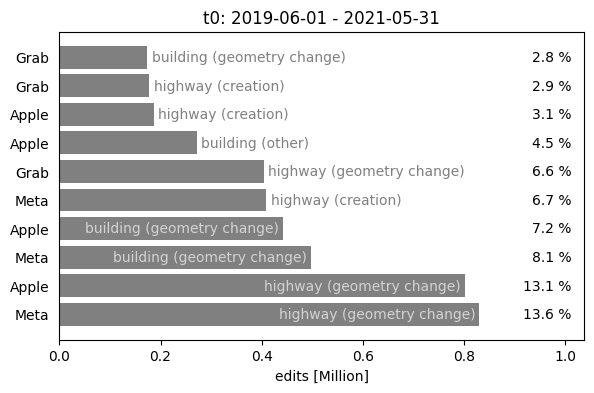

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Meta,creation,building,3113420,0.323,0.323,33,0.022
1,21,1,t1,Meta,geometry change,building,1784024,0.185,0.508,44,0.029
2,22,2,t1,Apple,geometry change,highway,924072,0.096,0.604,609,0.404
3,23,3,t1,Apple,geometry change,building,524046,0.054,0.659,517,0.343
4,24,4,t1,Grab,creation,building,487282,0.051,0.709,38,0.025
5,25,5,t1,Meta,other,building,459193,0.048,0.757,35,0.023
6,26,6,t1,Meta,deletion,building,306129,0.032,0.789,36,0.024
7,27,7,t1,Meta,geometry change,highway,260285,0.027,0.816,41,0.027
8,28,8,t1,Kaart,geometry change,highway,164442,0.017,0.833,29,0.019
9,29,9,t1,Grab,geometry change,highway,159234,0.017,0.849,253,0.168


3.11342


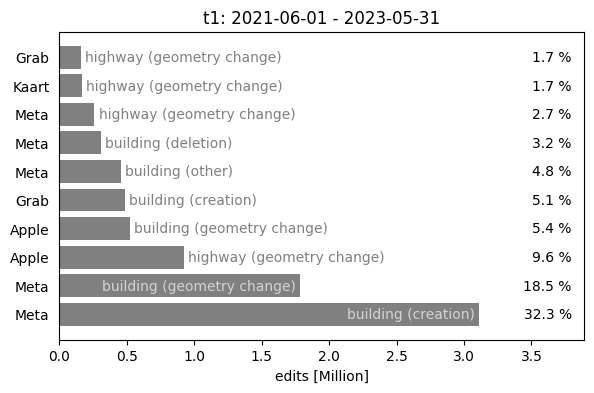

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,7594182,0.467,0.467,28424,0.837
1,41,1,t0,nc,geometry change,highway,3676415,0.226,0.694,17084,0.503
2,42,2,t0,nc,geometry change,building,1425049,0.088,0.782,15661,0.461
3,43,3,t0,nc,creation,highway,1112630,0.068,0.850,4543,0.134
4,44,4,t0,nc,deletion,building,532067,0.033,0.883,6450,0.190
5,45,5,t0,nc,creation,waterway,398400,0.025,0.907,812,0.024
6,46,6,t0,nc,tag change,highway,246065,0.015,0.922,2352,0.069
7,47,7,t0,nc,tag change,building,137147,0.008,0.931,1653,0.049
8,48,8,t0,nc,tag + geometry change,highway,119533,0.007,0.938,1912,0.056
9,49,9,t0,nc,creation,other,110763,0.007,0.945,2349,0.069


7.594182


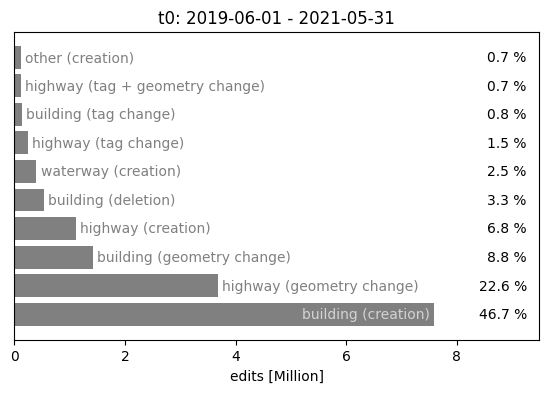

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,3778648,0.584,0.584,12498,0.745
1,61,1,t1,nc,geometry change,building,745268,0.115,0.699,7786,0.464
2,62,2,t1,nc,geometry change,highway,461472,0.071,0.770,8949,0.534
3,63,3,t1,nc,deletion,building,324014,0.050,0.820,3551,0.212
4,64,4,t1,nc,creation,highway,196512,0.030,0.851,2615,0.156
5,65,5,t1,nc,tag change,highway,172427,0.027,0.877,1882,0.112
6,66,6,t1,nc,tag change,building,82812,0.013,0.890,1698,0.101
7,67,7,t1,nc,other,building,68551,0.011,0.901,1460,0.087
8,68,8,t1,nc,other,other,63057,0.010,0.910,729,0.043
9,69,9,t1,nc,creation,other,43078,0.007,0.917,1351,0.081


3.778648


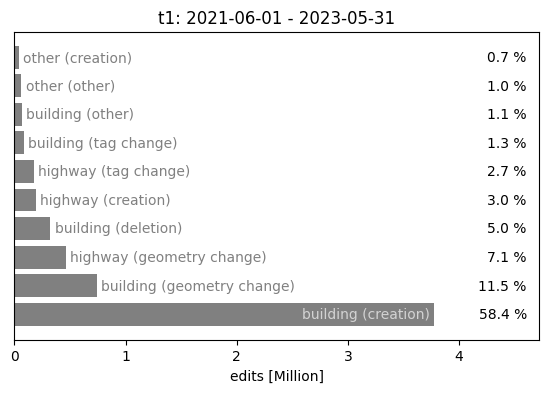

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Apple,geometry change,highway,349996,0.339,0.339,111,0.432
1,1,1,t0,Kaart,geometry change,highway,321097,0.311,0.649,79,0.307
2,2,2,t0,Kaart,creation,highway,70168,0.068,0.717,48,0.187
3,3,3,t0,Kaart,geometry change,building,43271,0.042,0.759,27,0.105
4,4,4,t0,Apple,creation,highway,36722,0.036,0.794,93,0.362
5,5,5,t0,Apple,other,other,26770,0.026,0.820,94,0.366
6,6,6,t0,Kaart,other,other,20038,0.019,0.840,37,0.144
7,7,7,t0,Kaart,tag change,highway,12974,0.013,0.852,23,0.089
8,8,8,t0,Kaart,tag + geometry change,highway,12361,0.012,0.864,27,0.105
9,9,9,t0,Apple,other,highway,10013,0.010,0.874,83,0.323


0.349996


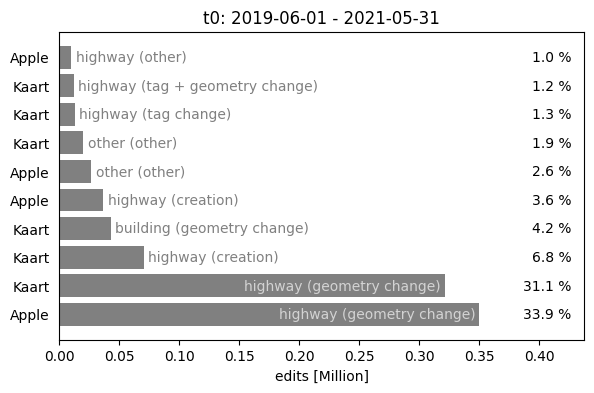

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Apple,geometry change,highway,733891,0.541,0.541,220,0.546
1,21,1,t1,Apple,creation,building,162493,0.120,0.661,43,0.107
2,22,2,t1,Apple,creation,highway,141633,0.104,0.765,188,0.467
3,23,3,t1,Apple,geometry change,building,70568,0.052,0.817,168,0.417
4,24,4,t1,Apple,tag + geometry change,highway,63017,0.046,0.864,169,0.419
5,25,5,t1,Apple,tag change,highway,58606,0.043,0.907,182,0.452
6,26,6,t1,Apple,other,other,26460,0.020,0.927,177,0.439
7,27,7,t1,Kaart,tag change,highway,13374,0.010,0.936,42,0.104
8,28,8,t1,Apple,geometry change,landuse,8688,0.006,0.943,163,0.404
9,29,9,t1,Apple,creation,barrier,7135,0.005,0.948,127,0.315


0.733891


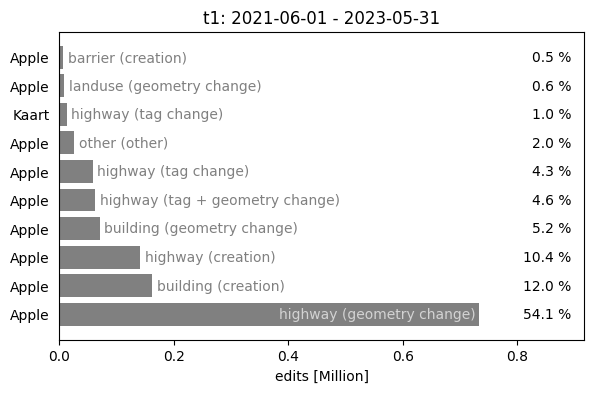

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,365881,0.181,0.181,1279,0.349
1,41,1,t0,nc,tag change,other,278306,0.137,0.318,381,0.104
2,42,2,t0,nc,tag change,highway,250473,0.124,0.441,894,0.244
3,43,3,t0,nc,creation,highway,203059,0.100,0.542,1087,0.296
4,44,4,t0,nc,creation,building,153462,0.076,0.617,638,0.174
5,45,5,t0,nc,other,highway,71758,0.035,0.653,517,0.141
6,46,6,t0,nc,creation,other,71644,0.035,0.688,578,0.158
7,47,7,t0,nc,other,other,52785,0.026,0.714,365,0.100
8,48,8,t0,nc,tag change,building,45650,0.023,0.737,463,0.126
9,49,9,t0,nc,geometry change,building,37035,0.018,0.755,449,0.122


0.365881


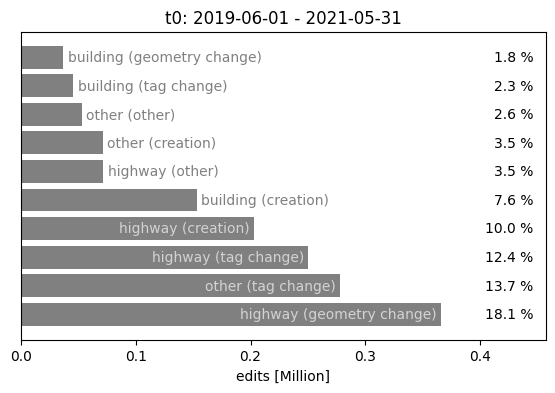

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,275181,0.187,0.187,816,0.217
1,61,1,t1,nc,geometry change,highway,251084,0.171,0.358,1272,0.338
2,62,2,t1,nc,tag change,highway,181669,0.124,0.482,1218,0.324
3,63,3,t1,nc,creation,highway,120474,0.082,0.564,1037,0.276
4,64,4,t1,nc,tag change,building,42069,0.029,0.592,690,0.183
5,65,5,t1,nc,geometry change,building,41285,0.028,0.621,558,0.148
6,66,6,t1,nc,creation,other,33762,0.023,0.643,501,0.133
7,67,7,t1,nc,other,highway,32034,0.022,0.665,656,0.174
8,68,8,t1,nc,deletion,highway,30872,0.021,0.686,423,0.112
9,69,9,t1,nc,tag + geometry change,highway,29008,0.020,0.706,590,0.157


0.275181


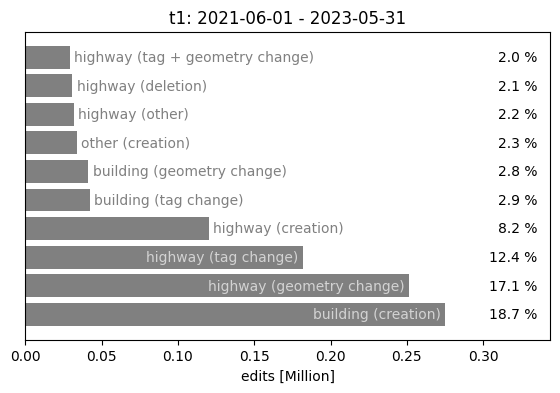

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Apple,geometry change,highway,4407645,0.604,0.604,462,0.629
1,1,1,t0,Apple,creation,highway,836175,0.115,0.719,378,0.514
2,2,2,t0,Kaart,tag change,highway,445356,0.061,0.780,99,0.135
3,3,3,t0,Apple,tag change,highway,290902,0.040,0.820,377,0.513
4,4,4,t0,Apple,other,other,217111,0.030,0.850,400,0.544
5,5,5,t0,Kaart,geometry change,highway,161717,0.022,0.872,103,0.140
6,6,6,t0,Kaart,creation,highway,144889,0.020,0.892,96,0.131
7,7,7,t0,Apple,tag + geometry change,highway,135374,0.019,0.910,359,0.488
8,8,8,t0,Apple,other,highway,88280,0.012,0.923,354,0.482
9,9,9,t0,Kaart,tag + geometry change,highway,65478,0.009,0.932,94,0.128


4.407645


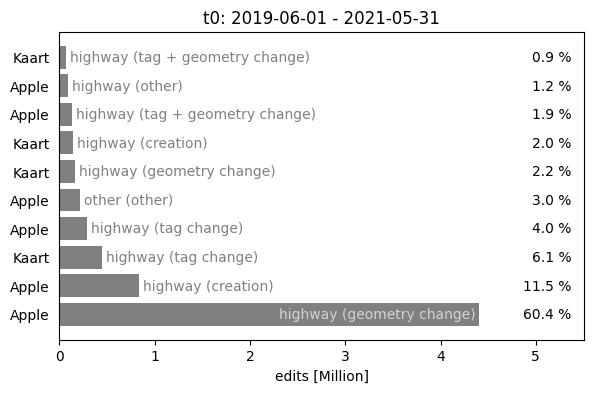

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Apple,geometry change,highway,797633,0.260,0.260,505,0.535
1,21,1,t1,Kaart,tag change,highway,475443,0.155,0.415,91,0.096
2,22,2,t1,Kaart,creation,other,265127,0.086,0.501,50,0.053
3,23,3,t1,Kaart,geometry change,highway,229834,0.075,0.576,85,0.090
4,24,4,t1,Kaart,creation,highway,209025,0.068,0.645,80,0.085
5,25,5,t1,Apple,creation,highway,194768,0.063,0.708,472,0.500
6,26,6,t1,Apple,geometry change,building,98320,0.032,0.740,315,0.334
7,27,7,t1,Apple,tag change,highway,96124,0.031,0.771,476,0.504
8,28,8,t1,Kaart,creation,building,91901,0.030,0.801,17,0.018
9,29,9,t1,Kaart,tag + geometry change,highway,68744,0.022,0.824,74,0.078


0.797633


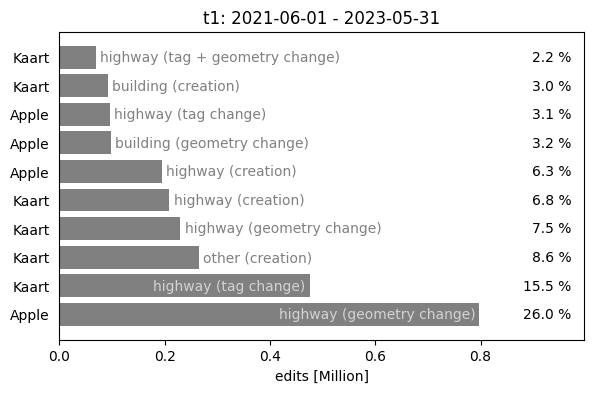

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,2821983,0.235,0.235,7334,0.459
1,41,1,t0,nc,creation,building,2419861,0.202,0.437,5596,0.350
2,42,2,t0,nc,creation,highway,1232449,0.103,0.540,5039,0.315
3,43,3,t0,nc,tag change,highway,695141,0.058,0.598,4721,0.295
4,44,4,t0,nc,creation,waterway,617001,0.051,0.650,1088,0.068
5,45,5,t0,nc,creation,natural,497158,0.041,0.691,2156,0.135
6,46,6,t0,nc,creation,other,323165,0.027,0.718,2803,0.175
7,47,7,t0,nc,tag change,other,278294,0.023,0.741,1587,0.099
8,48,8,t0,nc,deletion,building,256848,0.021,0.763,1629,0.102
9,49,9,t0,nc,tag + geometry change,highway,233967,0.020,0.782,2827,0.177


2.821983


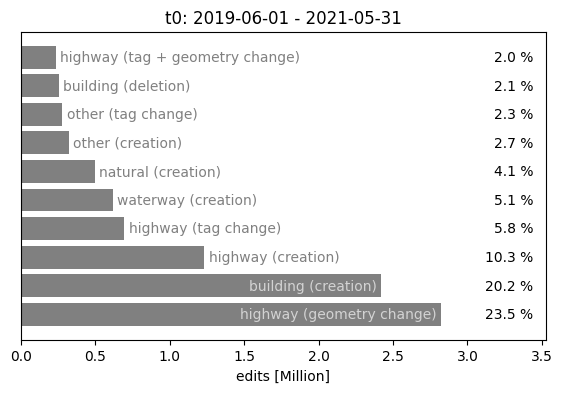

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,2255337,0.242,0.242,5491,0.373
1,61,1,t1,nc,geometry change,highway,871984,0.094,0.336,5995,0.407
2,62,2,t1,nc,creation,highway,869285,0.093,0.429,3875,0.263
3,63,3,t1,nc,creation,other,667636,0.072,0.501,2201,0.149
4,64,4,t1,nc,tag change,highway,602588,0.065,0.565,3670,0.249
5,65,5,t1,nc,creation,waterway,443367,0.048,0.613,896,0.061
6,66,6,t1,nc,creation,natural,419648,0.045,0.658,2207,0.150
7,67,7,t1,nc,geometry change,building,277971,0.030,0.688,2759,0.187
8,68,8,t1,nc,tag change,other,270857,0.029,0.717,1340,0.091
9,69,9,t1,nc,tag change,building,239669,0.026,0.743,1798,0.122


2.255337


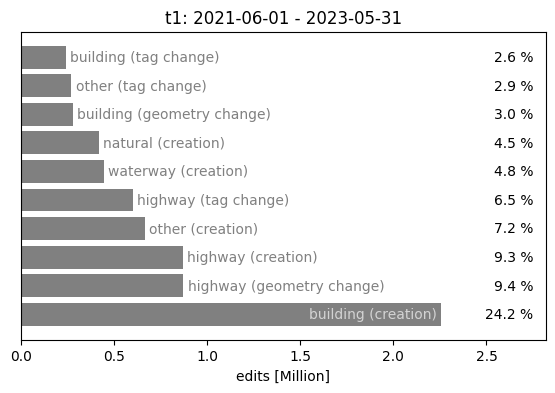

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Kaart,geometry change,highway,41276,0.203,0.203,13,0.071
1,1,1,t0,Kaart,creation,highway,30349,0.149,0.351,13,0.071
2,2,2,t0,Apple,creation,highway,22215,0.109,0.460,49,0.266
3,3,3,t0,Apple,geometry change,highway,18321,0.090,0.550,74,0.402
4,4,4,t0,MeNextBillion,geometry change,highway,14072,0.069,0.619,8,0.043
5,5,5,t0,Kaart,tag change,highway,12399,0.061,0.680,12,0.065
6,6,6,t0,Apple,tag change,other,12203,0.060,0.740,51,0.277
7,7,7,t0,MeNextBillion,creation,highway,12120,0.059,0.799,8,0.043
8,8,8,t0,Apple,other,other,6408,0.031,0.831,51,0.277
9,9,9,t0,Kaart,tag + geometry change,highway,3570,0.018,0.848,13,0.071


0.041276


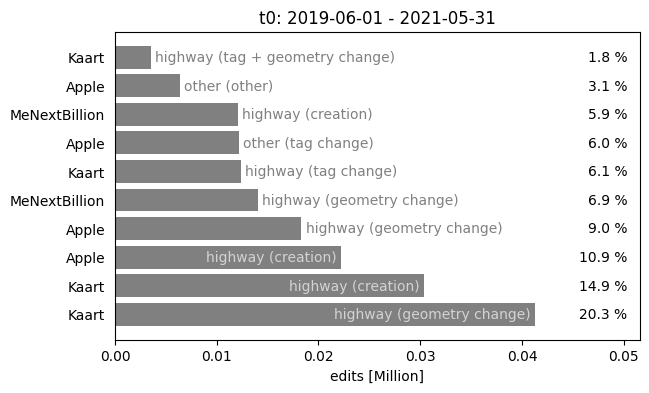

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Kaart,creation,highway,173758,0.411,0.411,57,0.185
1,21,1,t1,Kaart,geometry change,highway,107256,0.254,0.665,57,0.185
2,22,2,t1,Apple,geometry change,highway,45182,0.107,0.772,107,0.347
3,23,3,t1,Apple,creation,highway,29959,0.071,0.843,82,0.266
4,24,4,t1,Kaart,tag + geometry change,highway,7837,0.019,0.862,50,0.162
5,25,5,t1,Kaart,tag change,highway,6981,0.017,0.878,45,0.146
6,26,6,t1,Kaart,tag change,other,5927,0.014,0.892,22,0.071
7,27,7,t1,Kaart,deletion,highway,5749,0.014,0.906,43,0.140
8,28,8,t1,Apple,creation,other,3077,0.007,0.913,65,0.211
9,29,9,t1,Apple,tag change,highway,2813,0.007,0.920,58,0.188


0.173758


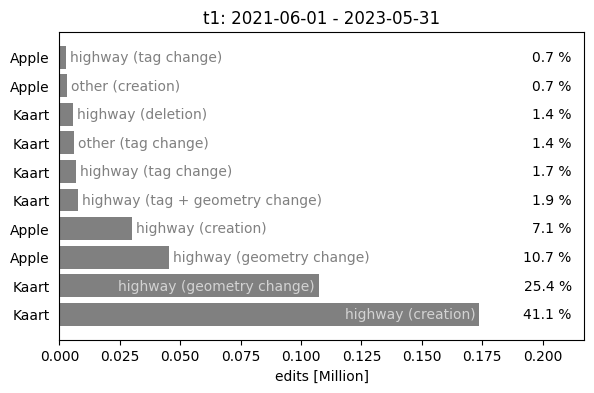

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,highway,154985,0.333,0.333,418,0.269
1,41,1,t0,nc,geometry change,highway,91581,0.197,0.530,525,0.338
2,42,2,t0,nc,creation,building,43501,0.094,0.623,317,0.204
3,43,3,t0,nc,tag change,highway,42182,0.091,0.714,277,0.178
4,44,4,t0,nc,deletion,other,17219,0.037,0.751,82,0.053
5,45,5,t0,nc,tag + geometry change,highway,8477,0.018,0.769,195,0.125
6,46,6,t0,nc,deletion,highway,7634,0.016,0.786,160,0.103
7,47,7,t0,nc,other,highway,7044,0.015,0.801,172,0.111
8,48,8,t0,nc,tag change,amenity,6743,0.014,0.815,189,0.122
9,49,9,t0,nc,tag change,other,6416,0.014,0.829,191,0.123


0.154985


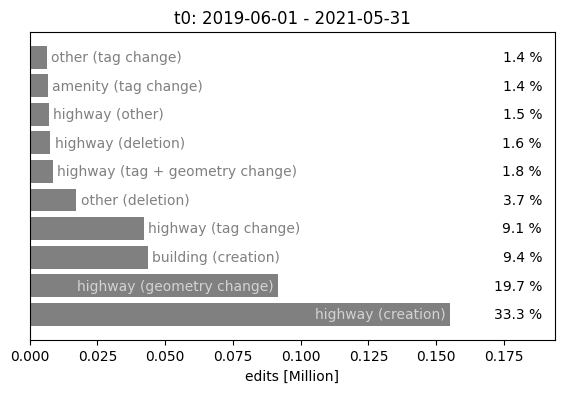

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,highway,326288,0.351,0.351,808,0.417
1,61,1,t1,nc,deletion,highway,168936,0.182,0.533,283,0.146
2,62,2,t1,nc,creation,building,160717,0.173,0.706,784,0.405
3,63,3,t1,nc,geometry change,highway,90688,0.098,0.803,936,0.483
4,64,4,t1,nc,tag change,highway,34832,0.037,0.841,405,0.209
5,65,5,t1,nc,geometry change,building,12174,0.013,0.854,347,0.179
6,66,6,t1,nc,creation,waterway,11422,0.012,0.866,235,0.121
7,67,7,t1,nc,tag + geometry change,highway,11337,0.012,0.878,338,0.174
8,68,8,t1,nc,creation,place,10282,0.011,0.889,102,0.053
9,69,9,t1,nc,creation,landuse,9698,0.010,0.900,263,0.136


0.326288


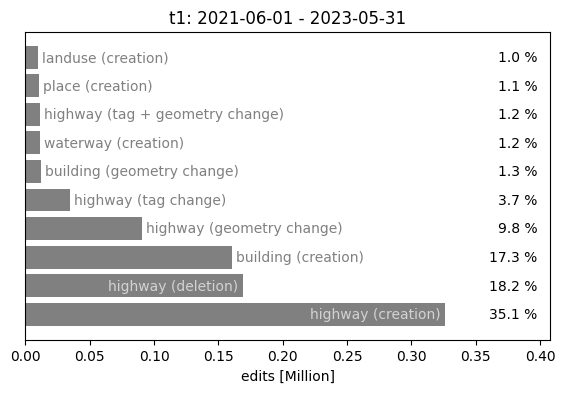

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Meta,geometry change,highway,545401,0.331,0.331,57,0.252
1,1,1,t0,Meta,creation,highway,370201,0.225,0.555,52,0.230
2,2,2,t0,Meta,geometry change,building,204557,0.124,0.679,54,0.239
3,3,3,t0,Meta,tag + geometry change,highway,111846,0.068,0.747,38,0.168
4,4,4,t0,Meta,tag change,highway,78836,0.048,0.795,39,0.173
5,5,5,t0,Meta,deletion,highway,69142,0.042,0.837,38,0.168
6,6,6,t0,Meta,creation,other,63902,0.039,0.876,33,0.146
7,7,7,t0,Meta,other,other,30288,0.018,0.894,29,0.128
8,8,8,t0,Meta,creation,building,20221,0.012,0.906,48,0.212
9,9,9,t0,Meta,other,highway,18373,0.011,0.918,42,0.186


0.545401


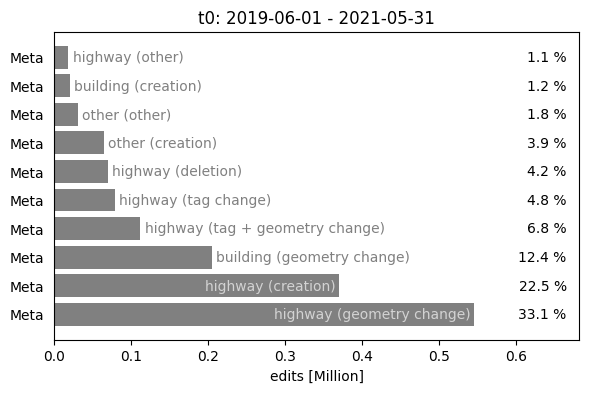

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Meta,geometry change,highway,1139004,0.354,0.354,51,0.081
1,21,1,t1,Meta,creation,highway,634940,0.197,0.551,41,0.065
2,22,2,t1,Meta,geometry change,building,263952,0.082,0.633,56,0.089
3,23,3,t1,Meta,tag + geometry change,highway,168278,0.052,0.686,38,0.061
4,24,4,t1,Meta,other,highway,168098,0.052,0.738,40,0.064
5,25,5,t1,Meta,other,building,158320,0.049,0.787,37,0.059
6,26,6,t1,Meta,deletion,highway,136361,0.042,0.829,45,0.072
7,27,7,t1,Meta,tag change,other,130394,0.041,0.870,28,0.045
8,28,8,t1,Meta,tag change,highway,94408,0.029,0.899,36,0.057
9,29,9,t1,Amazon,creation,building,43737,0.014,0.913,105,0.167


1.139004


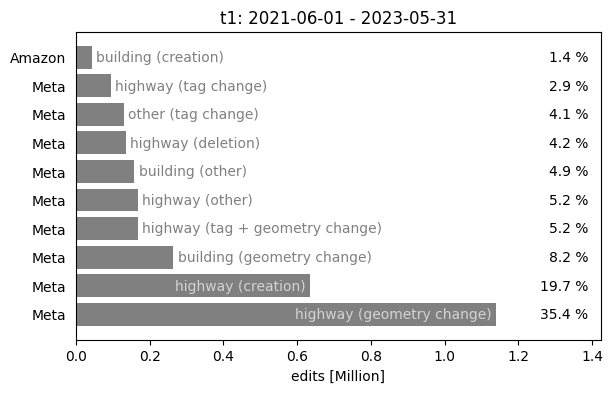

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,3562919,0.486,0.486,7509,0.800
1,41,1,t0,nc,geometry change,building,1129618,0.154,0.640,4038,0.430
2,42,2,t0,nc,other,building,712170,0.097,0.737,1072,0.114
3,43,3,t0,nc,deletion,building,687382,0.094,0.831,3117,0.332
4,44,4,t0,nc,geometry change,highway,231731,0.032,0.863,4078,0.435
5,45,5,t0,nc,creation,highway,227560,0.031,0.894,3706,0.395
6,46,6,t0,nc,tag change,building,188684,0.026,0.919,534,0.057
7,47,7,t0,nc,creation,other,183892,0.025,0.944,852,0.091
8,48,8,t0,nc,deletion,highway,58943,0.008,0.953,1044,0.111
9,49,9,t0,nc,tag change,highway,40214,0.005,0.958,929,0.099


3.562919


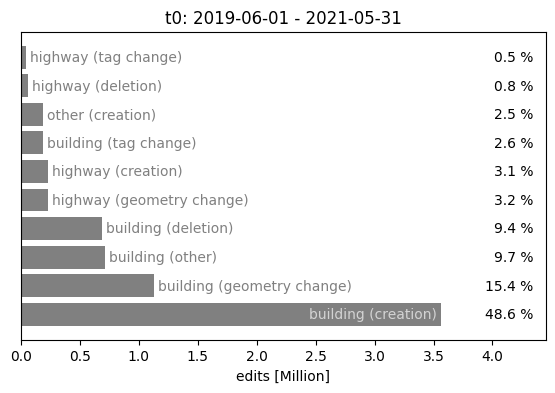

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,1329696,0.353,0.353,3935,0.767
1,61,1,t1,nc,geometry change,building,833848,0.222,0.575,1831,0.357
2,62,2,t1,nc,other,building,252855,0.067,0.642,577,0.113
3,63,3,t1,nc,deletion,building,208691,0.055,0.698,1265,0.247
4,64,4,t1,nc,geometry change,highway,173876,0.046,0.744,1954,0.381
5,65,5,t1,nc,creation,other,151418,0.040,0.784,502,0.098
6,66,6,t1,nc,tag + geometry change,building,131905,0.035,0.819,296,0.058
7,67,7,t1,nc,tag change,other,109923,0.029,0.848,190,0.037
8,68,8,t1,nc,creation,highway,103959,0.028,0.876,1313,0.256
9,69,9,t1,nc,tag change,building,73361,0.019,0.896,403,0.079


1.329696


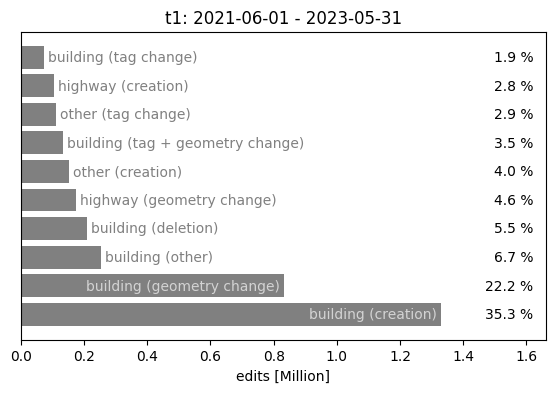

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Microsoft,creation,highway,68011,0.348,0.348,32,0.215
1,1,1,t0,Microsoft,geometry change,highway,45342,0.232,0.579,32,0.215
2,2,2,t0,Kaart,geometry change,highway,27317,0.140,0.719,35,0.235
3,3,3,t0,Kaart,creation,highway,6851,0.035,0.754,32,0.215
4,4,4,t0,Kaart,tag change,highway,4972,0.025,0.779,28,0.188
5,5,5,t0,Microsoft,geometry change,building,4914,0.025,0.804,25,0.168
6,6,6,t0,Apple,geometry change,highway,4498,0.023,0.827,19,0.128
7,7,7,t0,Microsoft,tag change,highway,3756,0.019,0.847,31,0.208
8,8,8,t0,Microsoft,tag + geometry change,highway,3302,0.017,0.863,27,0.181
9,9,9,t0,Kaart,tag + geometry change,highway,2623,0.013,0.877,27,0.181


0.068011


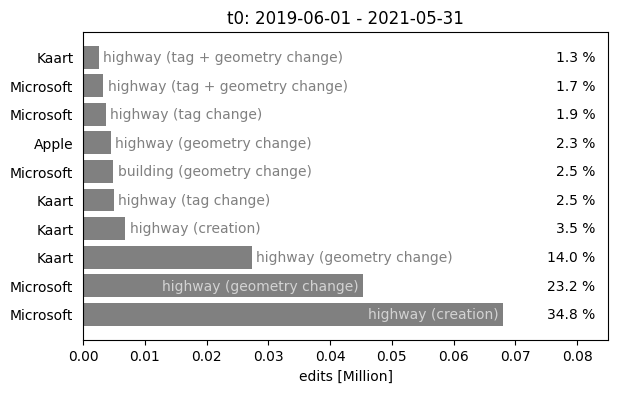

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Kaart,geometry change,highway,50575,0.328,0.328,56,0.199
1,21,1,t1,Kaart,tag change,highway,27307,0.177,0.506,49,0.174
2,22,2,t1,Kaart,creation,highway,14103,0.092,0.597,53,0.188
3,23,3,t1,Apple,geometry change,highway,8957,0.058,0.655,75,0.266
4,24,4,t1,Kaart,other,other,6740,0.044,0.699,43,0.152
5,25,5,t1,Kaart,other,highway,5452,0.035,0.734,45,0.160
6,26,6,t1,Kaart,tag + geometry change,highway,4732,0.031,0.765,47,0.167
7,27,7,t1,Apple,creation,highway,2436,0.016,0.781,61,0.216
8,28,8,t1,Microsoft,geometry change,highway,2296,0.015,0.796,23,0.082
9,29,9,t1,Kaart,tag change,barrier,2225,0.014,0.810,36,0.128


0.050575


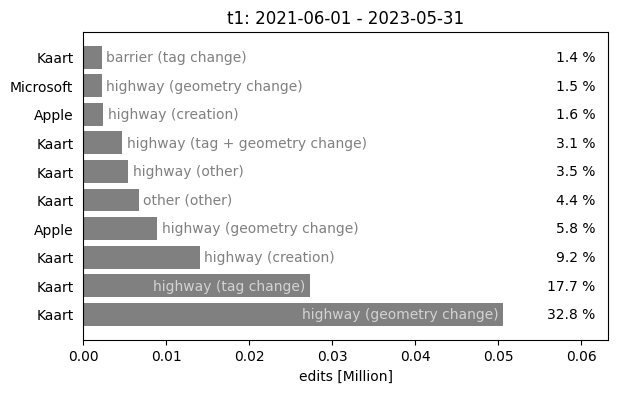

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,58712,0.184,0.184,600,0.196
1,41,1,t0,nc,geometry change,highway,56581,0.178,0.362,917,0.300
2,42,2,t0,nc,creation,highway,35628,0.112,0.474,689,0.225
3,43,3,t0,nc,tag change,highway,29243,0.092,0.566,450,0.147
4,44,4,t0,nc,creation,shop,11246,0.035,0.601,682,0.223
5,45,5,t0,nc,geometry change,building,8231,0.026,0.627,356,0.116
6,46,6,t0,nc,creation,amenity,6534,0.021,0.648,972,0.318
7,47,7,t0,nc,other,other,6050,0.019,0.667,180,0.059
8,48,8,t0,nc,tag + geometry change,highway,5495,0.017,0.684,289,0.095
9,49,9,t0,nc,deletion,building,5274,0.017,0.701,202,0.066


0.058712


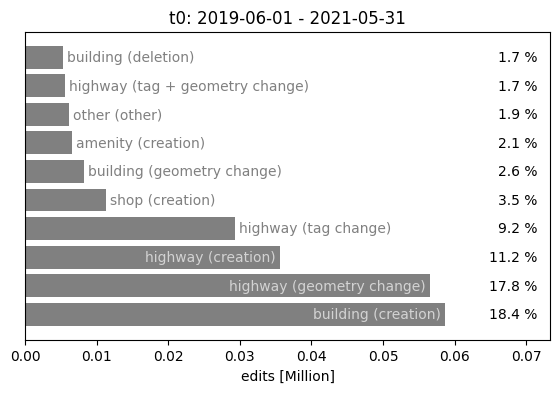

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,93808,0.164,0.164,951,0.347
1,61,1,t1,nc,geometry change,highway,85808,0.150,0.314,1039,0.379
2,62,2,t1,nc,creation,highway,64453,0.113,0.426,730,0.267
3,63,3,t1,nc,creation,barrier,28625,0.050,0.477,188,0.069
4,64,4,t1,nc,tag change,highway,25797,0.045,0.522,534,0.195
5,65,5,t1,nc,creation,natural,23714,0.041,0.563,381,0.139
6,66,6,t1,nc,deletion,shop,19295,0.034,0.597,89,0.033
7,67,7,t1,nc,geometry change,building,15164,0.026,0.623,513,0.187
8,68,8,t1,nc,creation,power,13272,0.023,0.646,111,0.041
9,69,9,t1,nc,creation,amenity,12739,0.022,0.669,632,0.231


0.093808


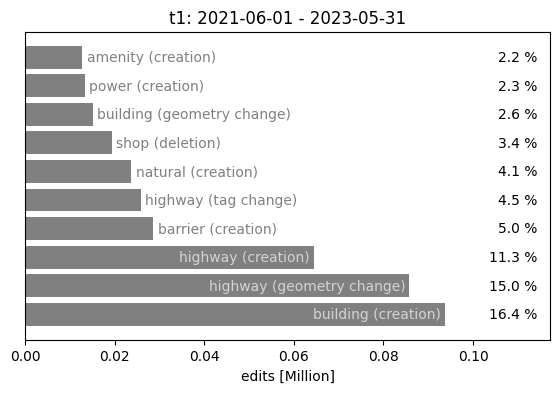

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Grab,geometry change,highway,7847,0.229,0.229,46,0.230
1,1,1,t0,Apple,geometry change,highway,5539,0.161,0.390,78,0.390
2,2,2,t0,Kaart,geometry change,highway,4456,0.130,0.520,2,0.010
3,3,3,t0,Grab,creation,highway,4313,0.126,0.646,45,0.225
4,4,4,t0,Apple,creation,highway,3839,0.112,0.758,48,0.240
5,5,5,t0,Kaart,creation,highway,1046,0.030,0.788,2,0.010
6,6,6,t0,Apple,geometry change,waterway,814,0.024,0.812,49,0.245
7,7,7,t0,Meta,geometry change,highway,538,0.016,0.827,40,0.200
8,8,8,t0,Apple,geometry change,other,500,0.015,0.842,40,0.200
9,9,9,t0,Meta,creation,highway,424,0.012,0.854,33,0.165


0.007847


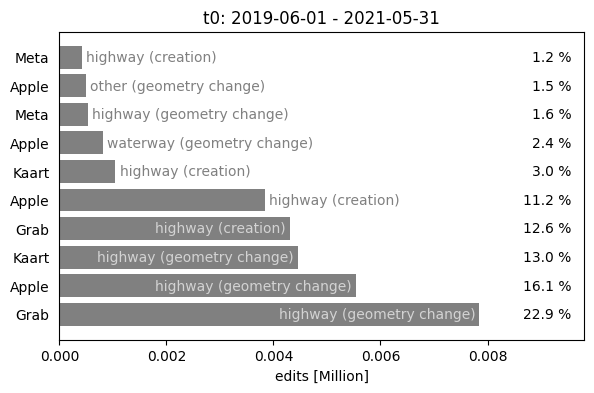

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Apple,geometry change,highway,20094,0.229,0.229,99,0.369
1,21,1,t1,Kaart,geometry change,highway,11272,0.128,0.357,15,0.056
2,22,2,t1,Apple,creation,highway,10278,0.117,0.475,76,0.284
3,23,3,t1,Kaart,creation,highway,9007,0.103,0.577,14,0.052
4,24,4,t1,Kaart,tag change,highway,5236,0.060,0.637,14,0.052
5,25,5,t1,Grab,geometry change,highway,5054,0.058,0.695,42,0.157
6,26,6,t1,Grab,creation,highway,4337,0.049,0.744,28,0.104
7,27,7,t1,Kaart,other,highway,3078,0.035,0.779,14,0.052
8,28,8,t1,Kaart,creation,barrier,2639,0.030,0.809,13,0.049
9,29,9,t1,Kaart,tag + geometry change,highway,2528,0.029,0.838,14,0.052


0.020094


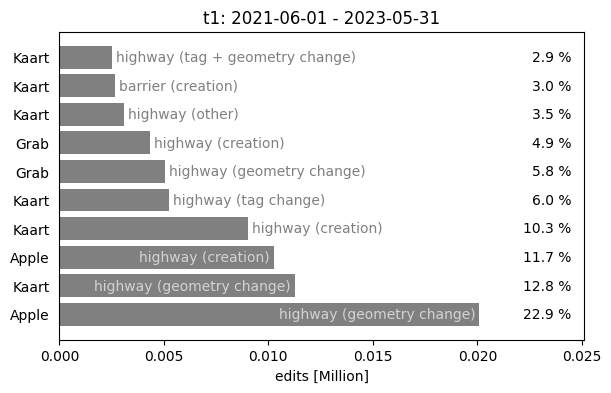

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,68374,0.357,0.357,352,0.286
1,41,1,t0,nc,creation,highway,38607,0.202,0.559,311,0.252
2,42,2,t0,nc,creation,building,11460,0.060,0.618,98,0.080
3,43,3,t0,nc,deletion,highway,6051,0.032,0.650,138,0.112
4,44,4,t0,nc,deletion,other,5842,0.031,0.680,29,0.024
5,45,5,t0,nc,creation,other,5641,0.029,0.710,138,0.112
6,46,6,t0,nc,geometry change,building,4846,0.025,0.735,122,0.099
7,47,7,t0,nc,tag change,highway,4829,0.025,0.760,192,0.156
8,48,8,t0,nc,creation,railway,3934,0.021,0.781,17,0.014
9,49,9,t0,nc,deletion,railway,3388,0.018,0.799,3,0.002


0.068374


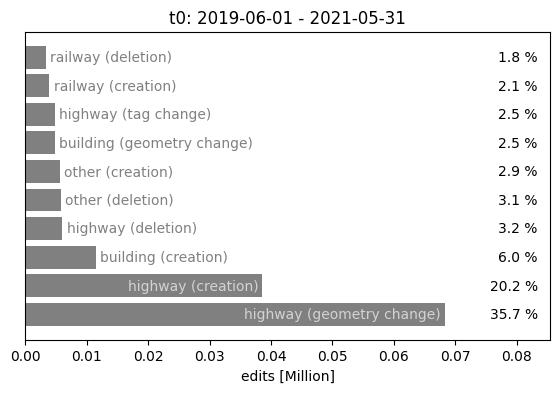

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,geometry change,highway,33738,0.277,0.277,215,0.319
1,61,1,t1,nc,creation,building,19810,0.162,0.439,128,0.190
2,62,2,t1,nc,creation,highway,16052,0.132,0.571,143,0.212
3,63,3,t1,nc,tag change,highway,6224,0.051,0.622,111,0.164
4,64,4,t1,nc,deletion,highway,4814,0.039,0.661,63,0.093
5,65,5,t1,nc,tag change,amenity,2275,0.019,0.680,99,0.147
6,66,6,t1,nc,tag + geometry change,highway,2154,0.018,0.697,76,0.113
7,67,7,t1,nc,other,highway,2098,0.017,0.714,70,0.104
8,68,8,t1,nc,geometry change,building,2016,0.017,0.731,72,0.107
9,69,9,t1,nc,creation,waterway,1894,0.016,0.747,33,0.049


0.033738


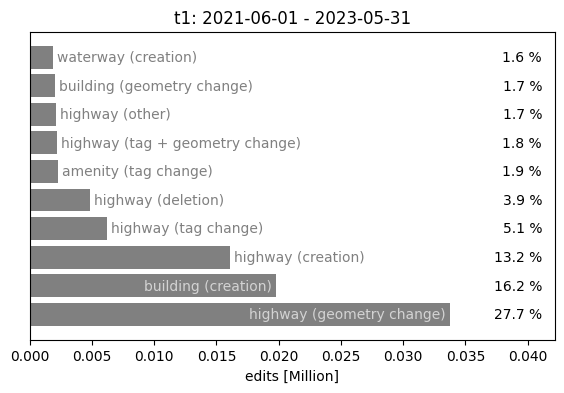

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Apple,geometry change,highway,921535,0.323,0.323,324,0.374
1,1,1,t0,Apple,geometry change,building,312964,0.110,0.433,273,0.315
2,2,2,t0,Apple,creation,highway,231667,0.081,0.514,256,0.295
3,3,3,t0,Kaart,geometry change,building,135250,0.047,0.562,24,0.028
4,4,4,t0,Apple,tag change,highway,117652,0.041,0.603,230,0.265
5,5,5,t0,Grab,creation,building,110227,0.039,0.642,157,0.181
6,6,6,t0,Kaart,geometry change,highway,96953,0.034,0.676,65,0.075
7,7,7,t0,Apple,other,other,75610,0.027,0.702,245,0.283
8,8,8,t0,Kaart,tag change,highway,66649,0.023,0.726,31,0.036
9,9,9,t0,Apple,other,building,65281,0.023,0.749,153,0.176


0.921535


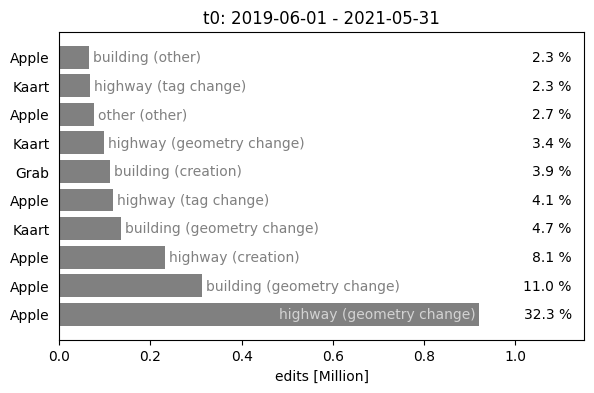

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Kaart,tag change,highway,177875,0.154,0.154,29,0.034
1,21,1,t1,Apple,geometry change,highway,99765,0.087,0.241,332,0.392
2,22,2,t1,Kaart,geometry change,highway,91487,0.079,0.321,29,0.034
3,23,3,t1,Kaart,creation,highway,71767,0.062,0.383,21,0.025
4,24,4,t1,Kaart,creation,building,69926,0.061,0.444,13,0.015
5,25,5,t1,Kaart,tag + geometry change,highway,60506,0.053,0.496,21,0.025
6,26,6,t1,Kaart,geometry change,building,51966,0.045,0.541,18,0.021
7,27,7,t1,Grab,geometry change,highway,49331,0.043,0.584,199,0.235
8,28,8,t1,Apple,geometry change,building,30207,0.026,0.610,187,0.221
9,29,9,t1,Apple,tag change,highway,23918,0.021,0.631,270,0.319


0.177875


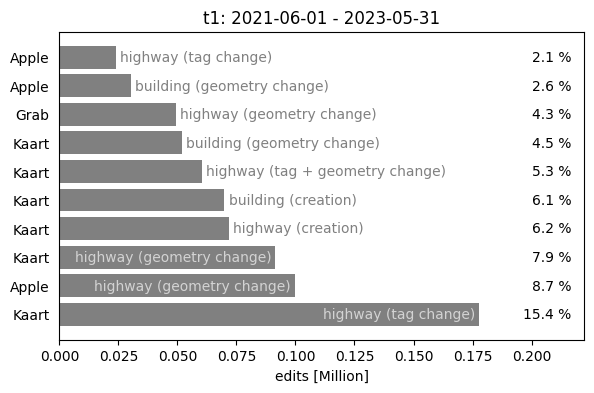

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,3503159,0.466,0.466,15404,0.732
1,41,1,t0,nc,geometry change,building,1518207,0.202,0.668,7954,0.378
2,42,2,t0,nc,geometry change,highway,479559,0.064,0.732,9045,0.430
3,43,3,t0,nc,deletion,building,280257,0.037,0.769,4653,0.221
4,44,4,t0,nc,creation,highway,268459,0.036,0.805,5963,0.283
5,45,5,t0,nc,tag change,building,209545,0.028,0.832,1635,0.078
6,46,6,t0,nc,other,building,155596,0.021,0.853,1659,0.079
7,47,7,t0,nc,tag change,highway,134187,0.018,0.871,1729,0.082
8,48,8,t0,nc,creation,landuse,81131,0.011,0.882,3751,0.178
9,49,9,t0,nc,other,other,74990,0.010,0.892,1443,0.069


3.503159


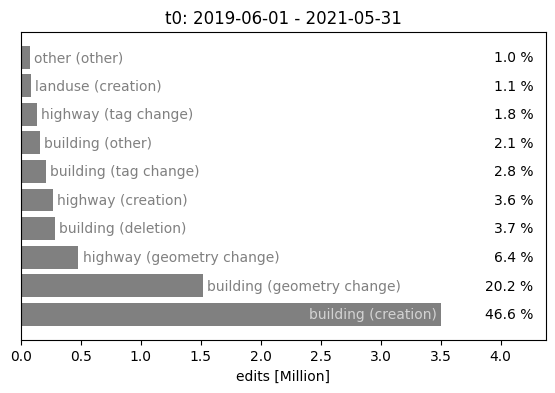

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,1379353,0.419,0.419,4084,0.519
1,61,1,t1,nc,geometry change,building,438973,0.133,0.552,2560,0.326
2,62,2,t1,nc,geometry change,highway,202291,0.061,0.613,2630,0.334
3,63,3,t1,nc,deletion,building,178036,0.054,0.667,1551,0.197
4,64,4,t1,nc,tag change,highway,143898,0.044,0.711,1162,0.148
5,65,5,t1,nc,tag change,building,123166,0.037,0.748,1424,0.181
6,66,6,t1,nc,creation,highway,95021,0.029,0.777,1496,0.190
7,67,7,t1,nc,other,building,56442,0.017,0.794,638,0.081
8,68,8,t1,nc,creation,other,38772,0.012,0.806,827,0.105
9,69,9,t1,nc,other,other,38289,0.012,0.818,669,0.085


1.379353


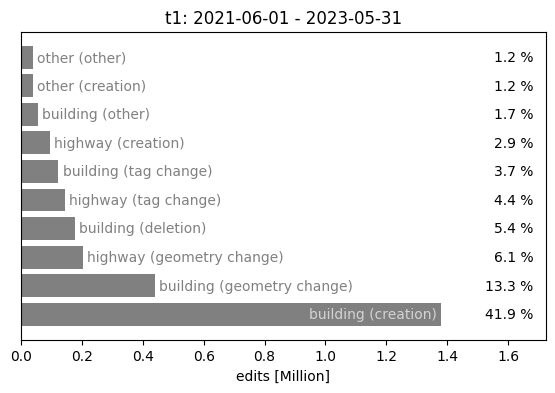

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Grab,geometry change,highway,246172,0.335,0.335,115,0.282
1,1,1,t0,Grab,creation,highway,211657,0.288,0.623,111,0.272
2,2,2,t0,Kaart,creation,highway,55010,0.075,0.698,27,0.066
3,3,3,t0,Kaart,geometry change,highway,54737,0.074,0.772,28,0.069
4,4,4,t0,Kaart,tag change,highway,38657,0.053,0.825,25,0.061
5,5,5,t0,Grab,tag change,highway,16504,0.022,0.847,90,0.221
6,6,6,t0,Grab,tag + geometry change,highway,14142,0.019,0.867,89,0.218
7,7,7,t0,Kaart,tag + geometry change,highway,9732,0.013,0.880,24,0.059
8,8,8,t0,Kaart,creation,building,8603,0.012,0.892,12,0.029
9,9,9,t0,Grab,other,other,5604,0.008,0.899,61,0.150


0.246172


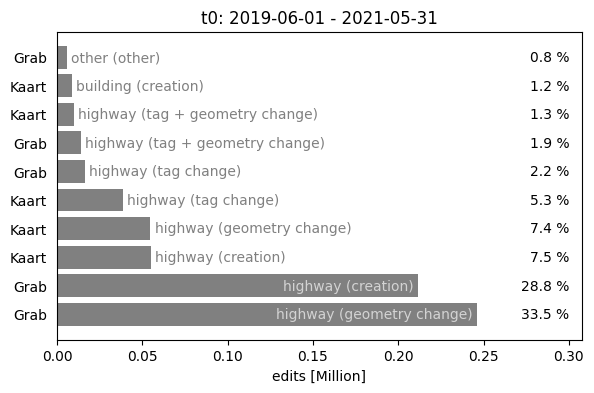

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Grab,geometry change,highway,196917,0.351,0.351,211,0.474
1,21,1,t1,Grab,creation,highway,158827,0.283,0.634,191,0.429
2,22,2,t1,Grab,creation,building,52123,0.093,0.727,23,0.052
3,23,3,t1,Grab,tag change,highway,37789,0.067,0.794,185,0.416
4,24,4,t1,Grab,other,highway,12233,0.022,0.816,143,0.321
5,25,5,t1,Grab,tag change,other,10908,0.019,0.836,101,0.227
6,26,6,t1,Grab,tag + geometry change,highway,9596,0.017,0.853,163,0.366
7,27,7,t1,Meta,geometry change,highway,9355,0.017,0.869,31,0.070
8,28,8,t1,Grab,geometry change,building,9227,0.016,0.886,72,0.162
9,29,9,t1,Grab,creation,other,6335,0.011,0.897,107,0.240


0.196917


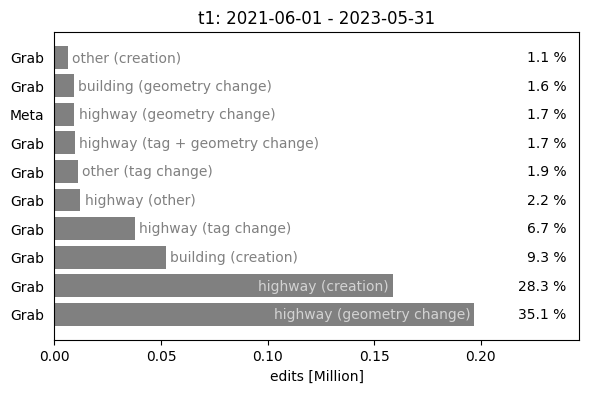

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,599793,0.289,0.289,1417,0.281
1,41,1,t0,nc,creation,highway,545715,0.263,0.553,1000,0.199
2,42,2,t0,nc,creation,building,242410,0.117,0.670,1153,0.229
3,43,3,t0,nc,deletion,other,125630,0.061,0.730,170,0.034
4,44,4,t0,nc,tag change,highway,84263,0.041,0.771,613,0.122
5,45,5,t0,nc,geometry change,building,56259,0.027,0.798,616,0.122
6,46,6,t0,nc,tag + geometry change,highway,47516,0.023,0.821,429,0.085
7,47,7,t0,nc,other,other,39758,0.019,0.840,309,0.061
8,48,8,t0,nc,tag change,building,24926,0.012,0.852,325,0.065
9,49,9,t0,nc,creation,natural,21593,0.010,0.862,267,0.053


0.599793


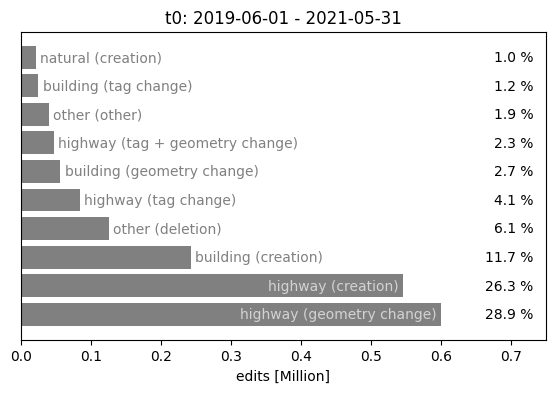

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,geometry change,highway,370077,0.251,0.251,1021,0.341
1,61,1,t1,nc,creation,highway,276921,0.188,0.439,773,0.258
2,62,2,t1,nc,tag change,highway,239744,0.163,0.601,784,0.262
3,63,3,t1,nc,creation,building,213858,0.145,0.746,527,0.176
4,64,4,t1,nc,tag + geometry change,highway,40275,0.027,0.773,478,0.160
5,65,5,t1,nc,geometry change,building,26938,0.018,0.792,413,0.138
6,66,6,t1,nc,other,highway,21501,0.015,0.806,524,0.175
7,67,7,t1,nc,tag change,building,18300,0.012,0.819,397,0.133
8,68,8,t1,nc,creation,natural,17857,0.012,0.831,176,0.059
9,69,9,t1,nc,creation,other,17682,0.012,0.843,465,0.155


0.370077


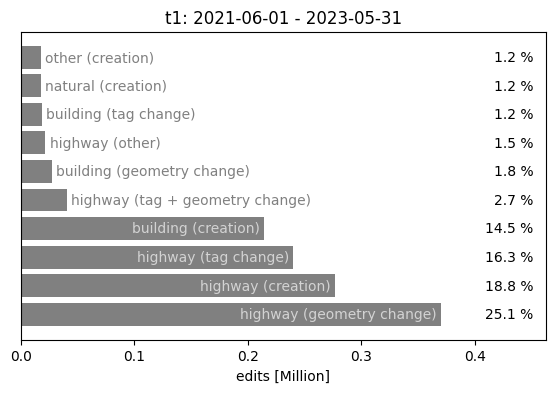

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Neshan,geometry change,highway,162268,0.302,0.302,10,0.048
1,1,1,t0,Neshan,creation,highway,87579,0.163,0.464,9,0.043
2,2,2,t0,Neshan,tag change,highway,69354,0.129,0.593,10,0.048
3,3,3,t0,Apple,geometry change,highway,59701,0.111,0.704,108,0.522
4,4,4,t0,Apple,creation,highway,21651,0.040,0.744,89,0.430
5,5,5,t0,Apple,tag change,highway,20142,0.037,0.782,71,0.343
6,6,6,t0,Neshan,tag + geometry change,highway,18731,0.035,0.817,9,0.043
7,7,7,t0,Neshan,deletion,highway,13490,0.025,0.842,9,0.043
8,8,8,t0,Apple,other,other,8462,0.016,0.858,77,0.372
9,9,9,t0,Apple,tag change,other,5594,0.010,0.868,47,0.227


0.162268


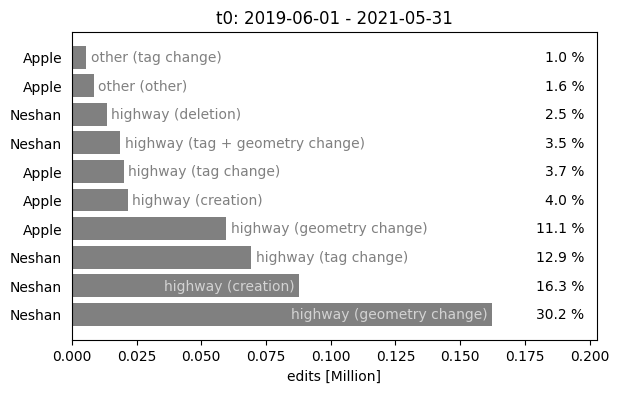

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Neshan,geometry change,highway,125556,0.250,0.250,12,0.027
1,21,1,t1,Neshan,tag change,highway,78173,0.156,0.406,12,0.027
2,22,2,t1,Neshan,creation,highway,71461,0.142,0.549,12,0.027
3,23,3,t1,Apple,geometry change,highway,37915,0.076,0.624,260,0.583
4,24,4,t1,Snapp,tag change,highway,26366,0.053,0.677,9,0.020
5,25,5,t1,Apple,creation,highway,24044,0.048,0.725,217,0.487
6,26,6,t1,Snapp,creation,highway,23800,0.047,0.772,9,0.020
7,27,7,t1,Neshan,tag + geometry change,highway,17707,0.035,0.808,12,0.027
8,28,8,t1,Snapp,geometry change,highway,14079,0.028,0.836,9,0.020
9,29,9,t1,Apple,tag change,highway,13794,0.028,0.863,242,0.543


0.125556


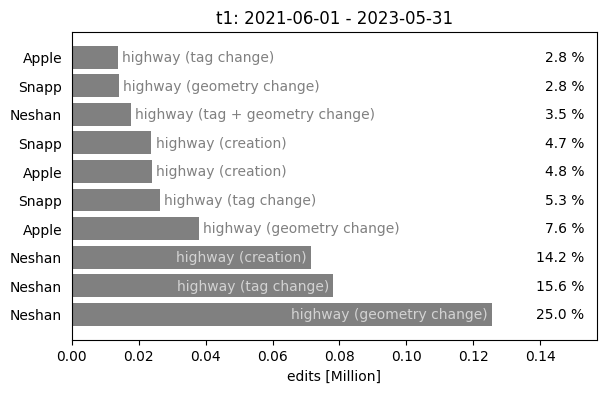

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,372742,0.218,0.218,1814,0.328
1,41,1,t0,nc,creation,highway,298749,0.175,0.393,1411,0.255
2,42,2,t0,nc,tag change,highway,279842,0.164,0.556,1397,0.253
3,43,3,t0,nc,creation,building,120595,0.071,0.627,737,0.133
4,44,4,t0,nc,tag + geometry change,highway,51891,0.030,0.657,918,0.166
5,45,5,t0,nc,tag change,boundary,42267,0.025,0.682,77,0.014
6,46,6,t0,nc,tag change,other,41205,0.024,0.706,588,0.106
7,47,7,t0,nc,creation,other,38632,0.023,0.729,987,0.179
8,48,8,t0,nc,deletion,highway,35779,0.021,0.750,778,0.141
9,49,9,t0,nc,creation,landuse,30211,0.018,0.767,527,0.095


0.372742


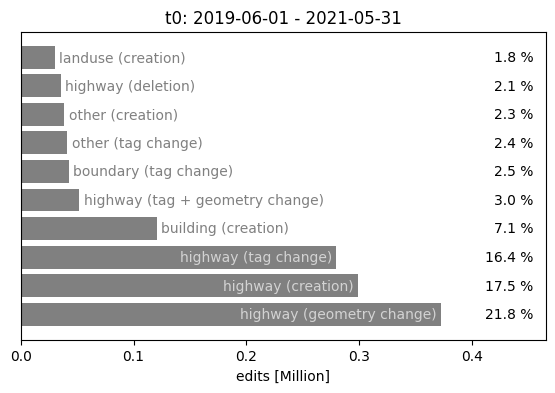

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,geometry change,highway,261189,0.207,0.207,1673,0.322
1,61,1,t1,nc,tag change,highway,186651,0.148,0.356,1252,0.241
2,62,2,t1,nc,creation,highway,185352,0.147,0.503,1130,0.218
3,63,3,t1,nc,creation,building,77837,0.062,0.565,726,0.140
4,64,4,t1,nc,tag change,other,72295,0.057,0.622,533,0.103
5,65,5,t1,nc,tag + geometry change,highway,36073,0.029,0.651,689,0.133
6,66,6,t1,nc,deletion,highway,35395,0.028,0.679,595,0.115
7,67,7,t1,nc,creation,other,30175,0.024,0.703,755,0.146
8,68,8,t1,nc,creation,waterway,22635,0.018,0.721,191,0.037
9,69,9,t1,nc,deletion,other,21852,0.017,0.738,272,0.052


0.261189


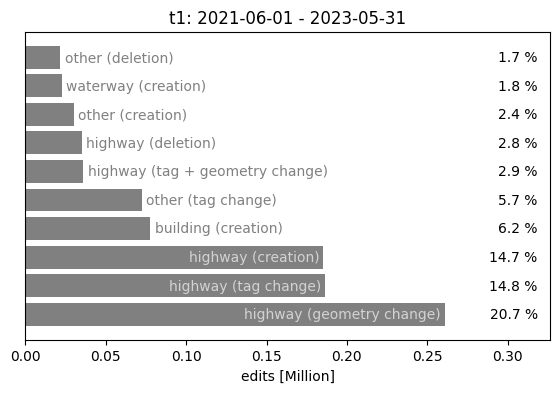

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Microsoft,creation,highway,90554,0.393,0.393,30,0.186
1,1,1,t0,Microsoft,geometry change,highway,62951,0.273,0.666,33,0.205
2,2,2,t0,Kaart,geometry change,highway,17739,0.077,0.743,34,0.211
3,3,3,t0,Kaart,creation,highway,11989,0.052,0.795,34,0.211
4,4,4,t0,Kaart,tag change,highway,5536,0.024,0.819,25,0.155
5,5,5,t0,Apple,other,other,4549,0.020,0.839,19,0.118
6,6,6,t0,Microsoft,tag change,highway,4122,0.018,0.857,30,0.186
7,7,7,t0,Microsoft,creation,place' 'landuse,3699,0.016,0.873,5,0.031
8,8,8,t0,Microsoft,tag + geometry change,highway,3596,0.016,0.888,29,0.180
9,9,9,t0,Microsoft,creation,building,1911,0.008,0.896,21,0.130


0.090554


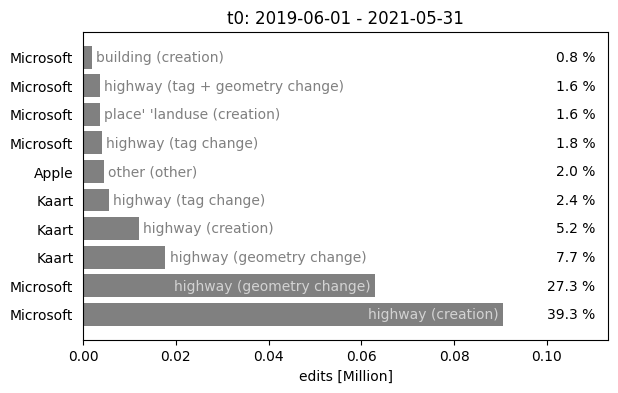

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Kaart,geometry change,highway,20092,0.347,0.347,39,0.186
1,21,1,t1,Kaart,creation,highway,11820,0.204,0.551,37,0.176
2,22,2,t1,Kaart,tag change,highway,3740,0.065,0.616,31,0.148
3,23,3,t1,TomTom,geometry change,highway,2467,0.043,0.658,38,0.181
4,24,4,t1,Apple,geometry change,highway,2144,0.037,0.695,51,0.243
5,25,5,t1,Microsoft,geometry change,highway,2049,0.035,0.731,22,0.105
6,26,6,t1,Microsoft,creation,highway,1557,0.027,0.758,20,0.095
7,27,7,t1,Kaart,tag + geometry change,highway,804,0.014,0.771,34,0.162
8,28,8,t1,Apple,geometry change,waterway,788,0.014,0.785,12,0.057
9,29,9,t1,Kaart,other,highway,747,0.013,0.798,26,0.124


0.020092


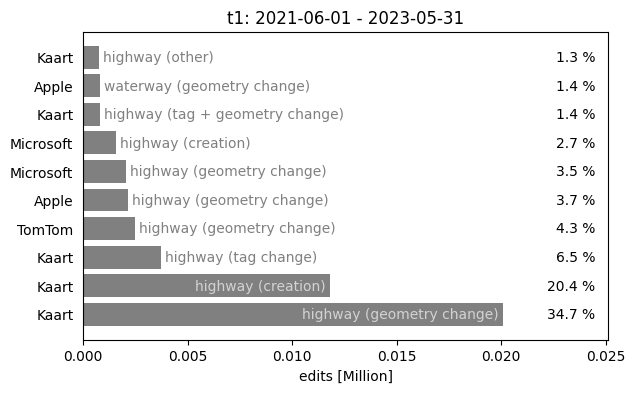

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,117411,0.214,0.214,913,0.567
1,41,1,t0,nc,tag change,highway,52589,0.096,0.310,187,0.116
2,42,2,t0,nc,creation,highway,46587,0.085,0.395,330,0.205
3,43,3,t0,nc,geometry change,highway,43265,0.079,0.474,503,0.312
4,44,4,t0,nc,tag change,other,28802,0.053,0.527,109,0.068
5,45,5,t0,nc,creation,power,26902,0.049,0.576,25,0.016
6,46,6,t0,nc,geometry change,building,25783,0.047,0.623,418,0.260
7,47,7,t0,nc,creation,natural,16876,0.031,0.654,138,0.086
8,48,8,t0,nc,deletion,building,14925,0.027,0.681,250,0.155
9,49,9,t0,nc,tag + geometry change,highway,10548,0.019,0.700,142,0.088


0.117411


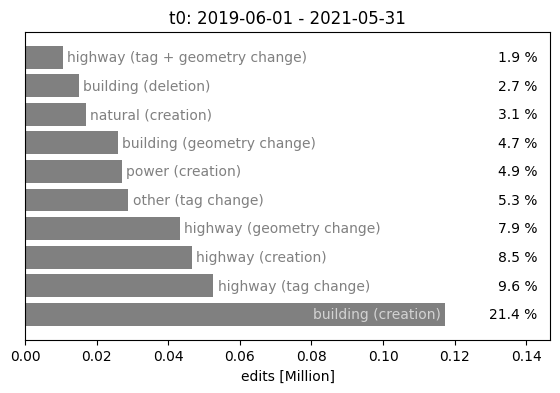

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,tag change,highway,106656,0.254,0.254,159,0.213
1,61,1,t1,nc,creation,building,71782,0.171,0.425,185,0.248
2,62,2,t1,nc,creation,highway,31109,0.074,0.500,168,0.226
3,63,3,t1,nc,geometry change,highway,23510,0.056,0.556,242,0.325
4,64,4,t1,nc,creation,place,14441,0.034,0.590,43,0.058
5,65,5,t1,nc,creation,other,10067,0.024,0.614,89,0.119
6,66,6,t1,nc,creation,natural,8613,0.021,0.635,76,0.102
7,67,7,t1,nc,tag + geometry change,highway,8551,0.020,0.655,89,0.119
8,68,8,t1,nc,deletion,highway,7439,0.018,0.673,79,0.106
9,69,9,t1,nc,tag change,amenity,7060,0.017,0.690,118,0.158


0.106656


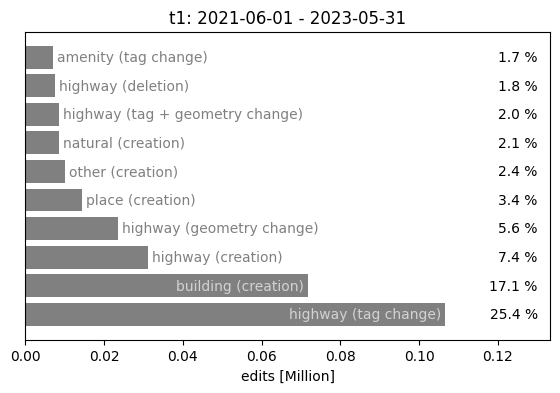

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Apple,geometry change,building,58799,0.168,0.168,147,0.519
1,1,1,t0,Apple,tag change,other,57242,0.164,0.332,84,0.297
2,2,2,t0,Apple,creation,building,56077,0.161,0.493,84,0.297
3,3,3,t0,Apple,other,building,37442,0.107,0.600,79,0.279
4,4,4,t0,Apple,geometry change,highway,29970,0.086,0.686,157,0.555
5,5,5,t0,Apple,creation,highway,19325,0.055,0.742,100,0.353
6,6,6,t0,Apple,other,other,18259,0.052,0.794,113,0.399
7,7,7,t0,Apple,geometry change,waterway,5528,0.016,0.810,107,0.378
8,8,8,t0,Grab,geometry change,highway,5318,0.015,0.825,18,0.064
9,9,9,t0,Apple,deletion,building,4880,0.014,0.839,77,0.272


0.058799


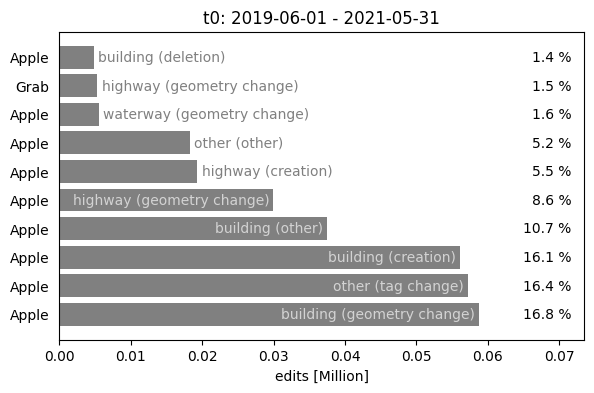

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Apple,geometry change,highway,19381,0.145,0.145,150,0.391
1,21,1,t1,Apple,tag change,other,18338,0.137,0.282,66,0.172
2,22,2,t1,Apple,other,building,15004,0.112,0.394,36,0.094
3,23,3,t1,Apple,geometry change,building,13663,0.102,0.496,85,0.221
4,24,4,t1,Apple,other,other,11829,0.088,0.584,76,0.198
5,25,5,t1,Apple,creation,highway,10832,0.081,0.665,94,0.245
6,26,6,t1,Apple,creation,building,5618,0.042,0.707,39,0.102
7,27,7,t1,Meta,geometry change,highway,5486,0.041,0.748,27,0.070
8,28,8,t1,Grab,geometry change,highway,2991,0.022,0.770,62,0.161
9,29,9,t1,Apple,tag change,highway,2328,0.017,0.788,88,0.229


0.019381


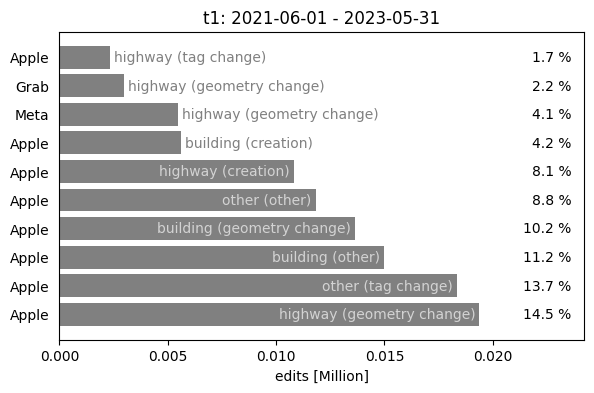

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,755083,0.521,0.521,2058,0.507
1,41,1,t0,nc,geometry change,building,154677,0.107,0.628,1085,0.267
2,42,2,t0,nc,creation,highway,120337,0.083,0.711,921,0.227
3,43,3,t0,nc,geometry change,highway,108798,0.075,0.786,1278,0.315
4,44,4,t0,nc,deletion,building,80978,0.056,0.842,604,0.149
5,45,5,t0,nc,other,building,67673,0.047,0.889,316,0.078
6,46,6,t0,nc,creation,landuse,16664,0.012,0.900,228,0.056
7,47,7,t0,nc,deletion,highway,16276,0.011,0.912,338,0.083
8,48,8,t0,nc,creation,other,16139,0.011,0.923,304,0.075
9,49,9,t0,nc,tag change,highway,10851,0.007,0.930,451,0.111


0.755083


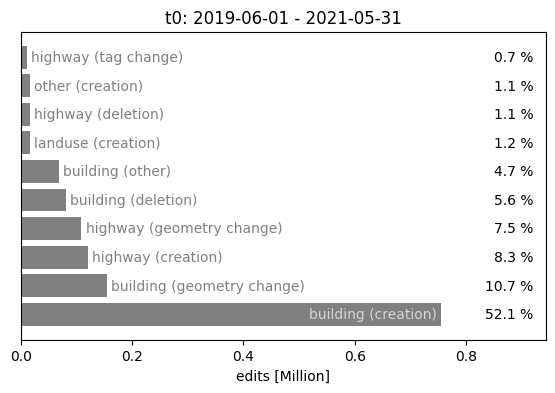

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,74355,0.444,0.444,255,0.263
1,61,1,t1,nc,creation,highway,18311,0.109,0.553,230,0.237
2,62,2,t1,nc,geometry change,highway,13499,0.081,0.633,311,0.321
3,63,3,t1,nc,deletion,building,7425,0.044,0.678,95,0.098
4,64,4,t1,nc,geometry change,building,5385,0.032,0.710,142,0.146
5,65,5,t1,nc,tag change,highway,4106,0.024,0.734,159,0.164
6,66,6,t1,nc,creation,power,3879,0.023,0.757,10,0.010
7,67,7,t1,nc,creation,landuse,3233,0.019,0.777,83,0.086
8,68,8,t1,nc,creation,waterway,2128,0.013,0.789,70,0.072
9,69,9,t1,nc,creation,railway,2020,0.012,0.802,15,0.015


0.074355


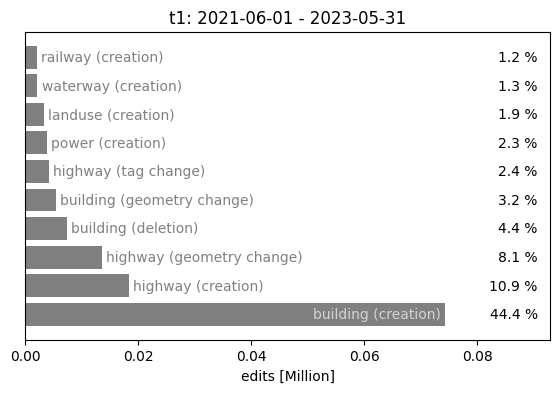

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Microsoft,creation,building,137932,0.249,0.249,14,0.098
1,1,1,t0,Microsoft,creation,highway,76480,0.138,0.387,15,0.105
2,2,2,t0,Microsoft,geometry change,highway,58395,0.105,0.493,15,0.105
3,3,3,t0,Microsoft,creation,other,37790,0.068,0.561,14,0.098
4,4,4,t0,Microsoft,tag change,highway,34592,0.062,0.624,14,0.098
5,5,5,t0,Microsoft,geometry change,building,21101,0.038,0.662,14,0.098
6,6,6,t0,Kaart,geometry change,highway,19286,0.035,0.696,17,0.119
7,7,7,t0,Microsoft,other,other,18718,0.034,0.730,14,0.098
8,8,8,t0,Microsoft,geometry change,other,15732,0.028,0.759,13,0.091
9,9,9,t0,Microsoft,tag + geometry change,highway,14313,0.026,0.785,14,0.098


0.137932


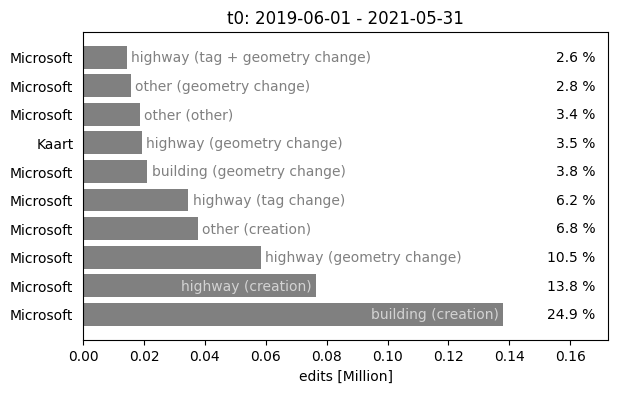

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Microsoft,creation,highway,40278,0.258,0.258,14,0.065
1,21,1,t1,Microsoft,geometry change,highway,28256,0.181,0.440,14,0.065
2,22,2,t1,Microsoft,tag change,highway,10927,0.070,0.510,14,0.065
3,23,3,t1,Microsoft,tag change,other,6321,0.041,0.550,11,0.051
4,24,4,t1,Kaart,geometry change,highway,5659,0.036,0.587,40,0.186
5,25,5,t1,Microsoft,tag + geometry change,highway,4264,0.027,0.614,14,0.065
6,26,6,t1,Microsoft,creation,building,3842,0.025,0.639,13,0.060
7,27,7,t1,TomTom,geometry change,highway,3426,0.022,0.661,69,0.321
8,28,8,t1,Microsoft,other,other,3317,0.021,0.682,11,0.051
9,29,9,t1,Microsoft,creation,barrier,3306,0.021,0.703,11,0.051


0.040278


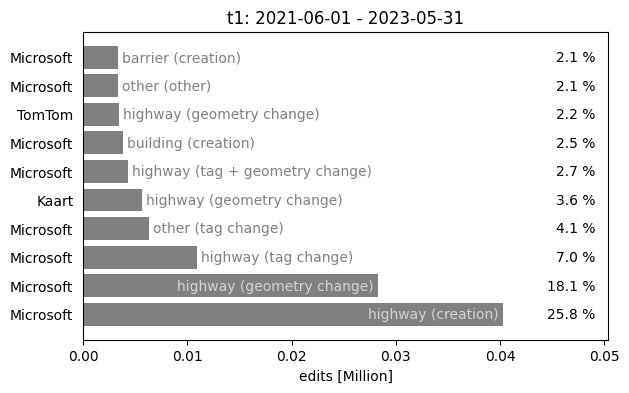

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,182069,0.179,0.179,612,0.341
1,41,1,t0,nc,geometry change,highway,120204,0.118,0.297,683,0.380
2,42,2,t0,nc,creation,highway,77409,0.076,0.373,570,0.317
3,43,3,t0,nc,tag change,highway,73203,0.072,0.445,400,0.223
4,44,4,t0,nc,creation,landuse,55995,0.055,0.500,202,0.112
5,45,5,t0,nc,tag change,other,51977,0.051,0.551,187,0.104
6,46,6,t0,nc,tag change,building,50450,0.050,0.601,293,0.163
7,47,7,t0,nc,geometry change,building,43313,0.043,0.643,342,0.190
8,48,8,t0,nc,geometry change,boundary,37364,0.037,0.680,159,0.089
9,49,9,t0,nc,other,boundary,34274,0.034,0.714,31,0.017


0.182069


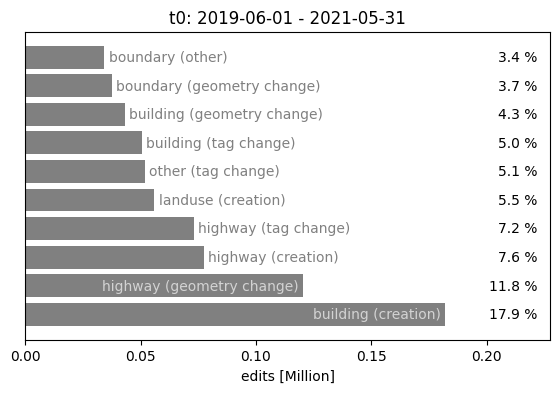

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,335628,0.221,0.221,344,0.232
1,61,1,t1,nc,creation,other,180236,0.118,0.339,257,0.173
2,62,2,t1,nc,tag change,highway,148291,0.097,0.436,479,0.323
3,63,3,t1,nc,tag change,building,128285,0.084,0.521,340,0.229
4,64,4,t1,nc,tag change,other,115374,0.076,0.597,218,0.147
5,65,5,t1,nc,geometry change,highway,106335,0.070,0.666,546,0.368
6,66,6,t1,nc,geometry change,building,83734,0.055,0.722,246,0.166
7,67,7,t1,nc,creation,highway,74665,0.049,0.771,484,0.326
8,68,8,t1,nc,creation,landuse,31813,0.021,0.791,171,0.115
9,69,9,t1,nc,other,highway,22610,0.015,0.806,277,0.187


0.335628


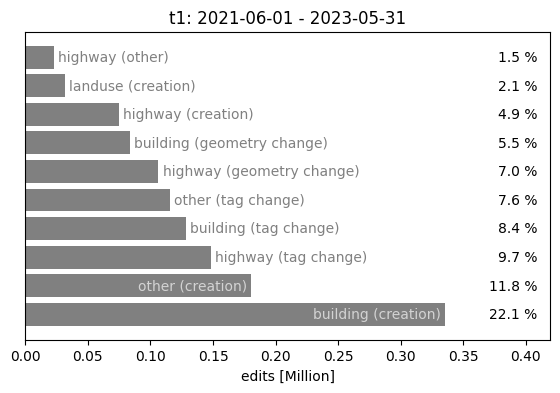

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Apple,geometry change,highway,363684,0.297,0.297,188,0.524
1,1,1,t0,Apple,creation,highway,192784,0.157,0.455,163,0.454
2,2,2,t0,Kaart,tag change,highway,168823,0.138,0.592,55,0.153
3,3,3,t0,Kaart,geometry change,highway,77388,0.063,0.656,55,0.153
4,4,4,t0,Apple,other,other,69581,0.057,0.712,176,0.490
5,5,5,t0,Kaart,creation,highway,61387,0.050,0.763,55,0.153
6,6,6,t0,Meta,creation,building,47290,0.039,0.801,6,0.017
7,7,7,t0,Kaart,tag + geometry change,highway,30964,0.025,0.826,53,0.148
8,8,8,t0,Apple,tag change,highway,29708,0.024,0.851,155,0.432
9,9,9,t0,Kaart,other,highway,19850,0.016,0.867,53,0.148


0.363684


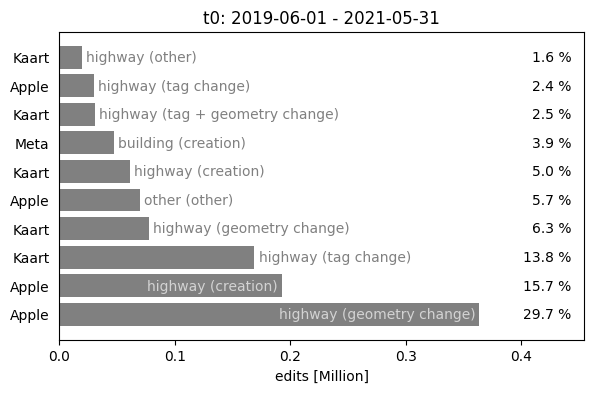

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Kaart,tag change,highway,45730,0.142,0.142,5,0.008
1,21,1,t1,Kaart,geometry change,highway,32981,0.102,0.244,5,0.008
2,22,2,t1,Kaart,creation,highway,31261,0.097,0.340,5,0.008
3,23,3,t1,TomTom,creation,highway,22943,0.071,0.411,103,0.168
4,24,4,t1,Bolt,creation,highway,21289,0.066,0.477,43,0.070
5,25,5,t1,Bolt,geometry change,highway,15491,0.048,0.525,45,0.073
6,26,6,t1,Apple,geometry change,building,13600,0.042,0.567,71,0.116
7,27,7,t1,TomTom,geometry change,highway,13097,0.041,0.608,117,0.191
8,28,8,t1,Apple,geometry change,highway,12753,0.039,0.647,234,0.382
9,29,9,t1,Kaart,tag + geometry change,highway,11612,0.036,0.683,5,0.008


0.04573


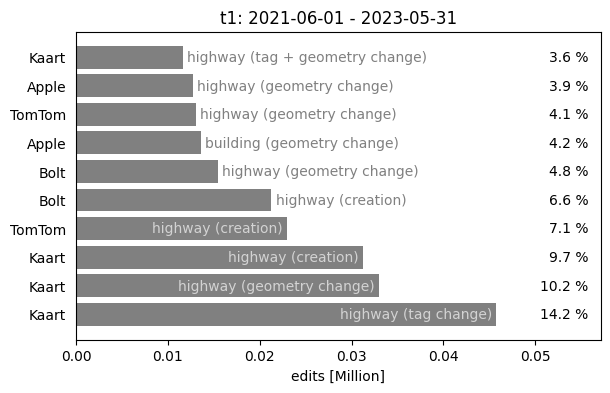

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,1293332,0.381,0.381,1406,0.475
1,41,1,t0,nc,creation,highway,715959,0.211,0.593,1194,0.404
2,42,2,t0,nc,creation,building,239412,0.071,0.663,1115,0.377
3,43,3,t0,nc,tag change,highway,207254,0.061,0.724,870,0.294
4,44,4,t0,nc,other,other,204785,0.060,0.785,555,0.188
5,45,5,t0,nc,tag change,other,77196,0.023,0.808,592,0.200
6,46,6,t0,nc,tag + geometry change,highway,70004,0.021,0.828,640,0.216
7,47,7,t0,nc,creation,power,47852,0.014,0.842,73,0.025
8,48,8,t0,nc,creation,landuse,38489,0.011,0.854,388,0.131
9,49,9,t0,nc,other,highway,37913,0.011,0.865,560,0.189


1.293332


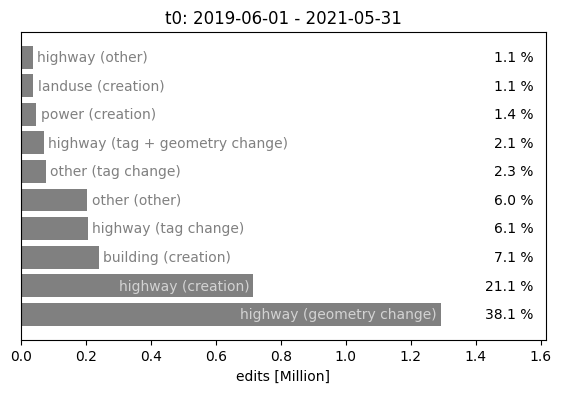

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,1091685,0.491,0.491,3735,0.729
1,61,1,t1,nc,geometry change,building,167519,0.075,0.567,1724,0.337
2,62,2,t1,nc,tag change,highway,131823,0.059,0.626,642,0.125
3,63,3,t1,nc,geometry change,highway,102903,0.046,0.672,1898,0.371
4,64,4,t1,nc,creation,highway,100483,0.045,0.718,981,0.192
5,65,5,t1,nc,creation,power,84238,0.038,0.755,78,0.015
6,66,6,t1,nc,deletion,building,75267,0.034,0.789,683,0.133
7,67,7,t1,nc,creation,landuse,51132,0.023,0.812,487,0.095
8,68,8,t1,nc,other,building,35869,0.016,0.828,367,0.072
9,69,9,t1,nc,creation,natural,27676,0.012,0.841,400,0.078


1.091685


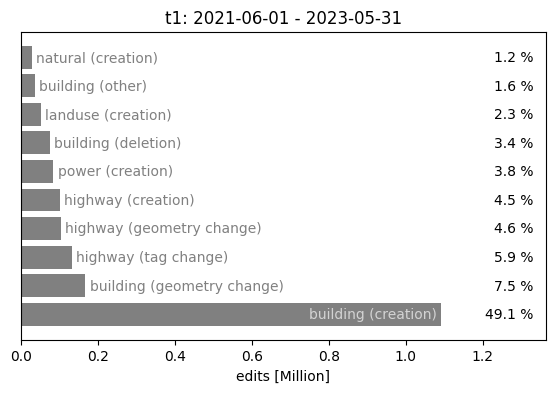

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Microsoft,creation,highway,77554,0.217,0.217,34,0.139
1,1,1,t0,DevelopmentSeed,creation,building,70498,0.197,0.414,4,0.016
2,2,2,t0,Microsoft,geometry change,highway,59554,0.167,0.581,34,0.139
3,3,3,t0,Kaart,geometry change,highway,27701,0.077,0.658,25,0.102
4,4,4,t0,Lyft,creation,building,14281,0.040,0.698,14,0.057
5,5,5,t0,DevelopmentSeed,geometry change,building,13073,0.037,0.734,4,0.016
6,6,6,t0,DevelopmentSeed,deletion,building,8623,0.024,0.759,4,0.016
7,7,7,t0,Kaart,creation,highway,6969,0.019,0.778,23,0.094
8,8,8,t0,Kaart,tag change,highway,6239,0.017,0.796,21,0.086
9,9,9,t0,Apple,geometry change,building,5269,0.015,0.810,19,0.078


0.077554


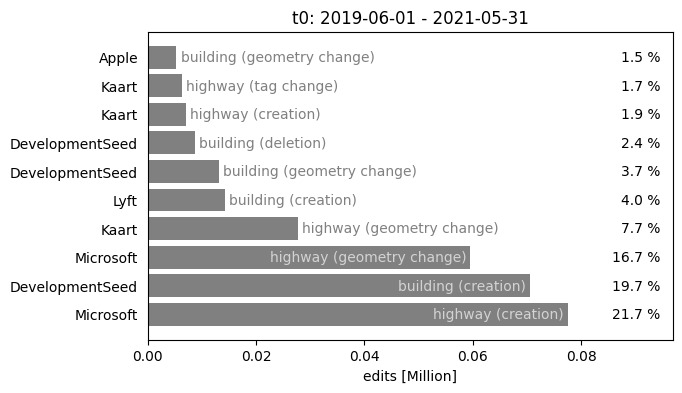

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Apple,geometry change,highway,139994,0.353,0.353,126,0.410
1,21,1,t1,Kaart,geometry change,highway,68931,0.174,0.527,54,0.176
2,22,2,t1,Kaart,creation,highway,28020,0.071,0.598,53,0.173
3,23,3,t1,Apple,creation,highway,25140,0.063,0.661,107,0.349
4,24,4,t1,Kaart,tag change,highway,21227,0.054,0.715,52,0.169
5,25,5,t1,Apple,geometry change,building,15765,0.040,0.755,80,0.261
6,26,6,t1,DevelopmentSeed,creation,power,12602,0.032,0.787,1,0.003
7,27,7,t1,Kaart,other,highway,7812,0.020,0.806,47,0.153
8,28,8,t1,Apple,tag change,highway,6594,0.017,0.823,107,0.349
9,29,9,t1,Kaart,creation,barrier,6339,0.016,0.839,41,0.134


0.139994


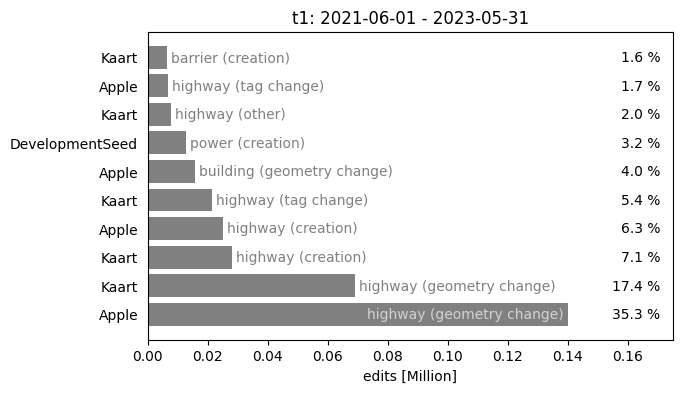

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,1034211,0.414,0.414,8595,0.761
1,41,1,t0,nc,geometry change,building,357097,0.143,0.557,3442,0.305
2,42,2,t0,nc,other,building,317641,0.127,0.684,697,0.062
3,43,3,t0,nc,geometry change,highway,137659,0.055,0.739,4836,0.428
4,44,4,t0,nc,creation,highway,121920,0.049,0.788,4639,0.411
5,45,5,t0,nc,deletion,building,102551,0.041,0.829,1982,0.175
6,46,6,t0,nc,tag change,highway,43716,0.017,0.846,862,0.076
7,47,7,t0,nc,creation,other,35385,0.014,0.860,998,0.088
8,48,8,t0,nc,tag change,building,24662,0.010,0.870,428,0.038
9,49,9,t0,nc,deletion,other,24335,0.010,0.880,266,0.024


1.034211


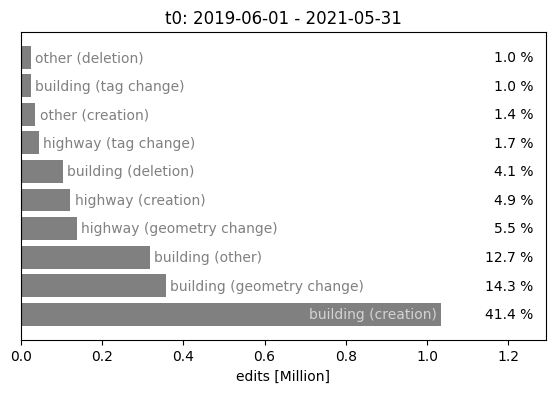

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,284785,0.309,0.309,813,0.394
1,61,1,t1,nc,geometry change,highway,130135,0.141,0.450,780,0.378
2,62,2,t1,nc,creation,highway,126795,0.137,0.587,493,0.239
3,63,3,t1,nc,tag change,highway,59266,0.064,0.651,376,0.182
4,64,4,t1,nc,geometry change,building,39409,0.043,0.694,483,0.234
5,65,5,t1,nc,creation,landuse,18064,0.020,0.714,237,0.115
6,66,6,t1,nc,tag + geometry change,highway,17617,0.019,0.733,222,0.108
7,67,7,t1,nc,deletion,building,15371,0.017,0.749,266,0.129
8,68,8,t1,nc,creation,natural,14923,0.016,0.766,171,0.083
9,69,9,t1,nc,tag change,building,11980,0.013,0.779,241,0.117


0.284785


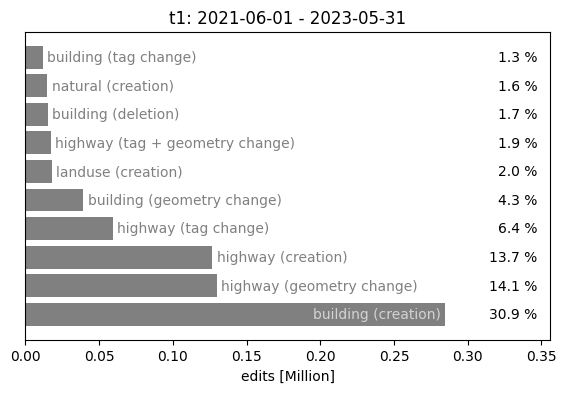

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Kaart,geometry change,highway,16874,0.177,0.177,39,0.358
1,1,1,t0,Kaart,tag change,highway,14703,0.154,0.331,35,0.321
2,2,2,t0,Kaart,creation,highway,11650,0.122,0.454,37,0.339
3,3,3,t0,Apple,geometry change,highway,11243,0.118,0.572,39,0.358
4,4,4,t0,Apple,geometry change,building,7907,0.083,0.655,18,0.165
5,5,5,t0,Kaart,tag + geometry change,highway,4552,0.048,0.702,34,0.312
6,6,6,t0,Apple,creation,highway,3304,0.035,0.737,26,0.239
7,7,7,t0,Kaart,creation,building,2946,0.031,0.768,20,0.183
8,8,8,t0,Kaart,other,highway,1887,0.020,0.788,36,0.330
9,9,9,t0,Apple,tag + geometry change,highway,1768,0.019,0.806,19,0.174


0.016874


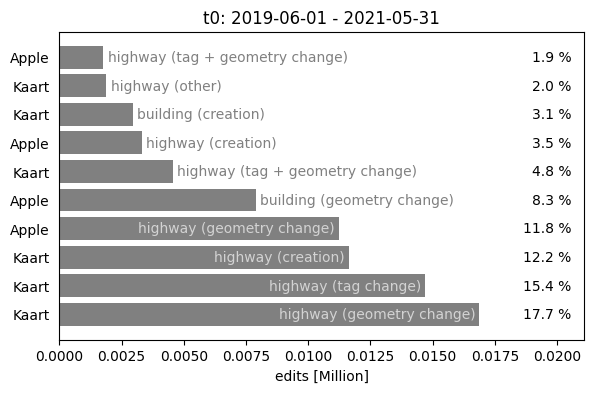

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Kaart,geometry change,highway,2985,0.266,0.266,27,0.239
1,21,1,t1,Kaart,creation,highway,1999,0.178,0.444,24,0.212
2,22,2,t1,Apple,geometry change,highway,1402,0.125,0.569,34,0.301
3,23,3,t1,Apple,creation,highway,703,0.063,0.632,25,0.221
4,24,4,t1,Kaart,tag change,highway,487,0.043,0.675,18,0.159
5,25,5,t1,Kontur,creation,building,411,0.037,0.712,2,0.018
6,26,6,t1,Kontur,other,other,374,0.033,0.745,1,0.009
7,27,7,t1,Apple,tag change,highway,260,0.023,0.768,23,0.204
8,28,8,t1,Kaart,tag + geometry change,highway,215,0.019,0.787,18,0.159
9,29,9,t1,Kaart,other,highway,204,0.018,0.805,17,0.150


0.002985


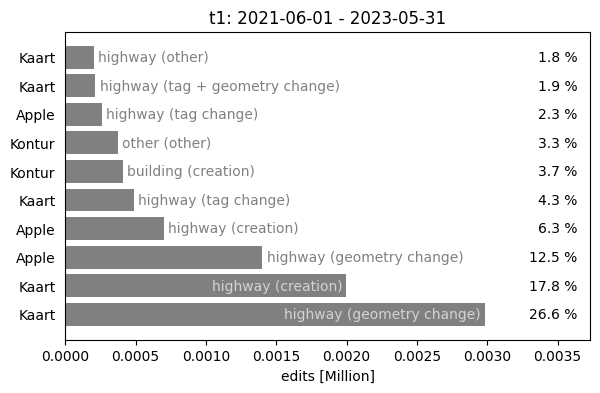

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,95282,0.240,0.240,459,0.393
1,41,1,t0,nc,geometry change,highway,82371,0.208,0.448,426,0.365
2,42,2,t0,nc,geometry change,building,55628,0.140,0.589,293,0.251
3,43,3,t0,nc,creation,highway,43424,0.110,0.698,258,0.221
4,44,4,t0,nc,tag change,highway,28385,0.072,0.770,164,0.141
5,45,5,t0,nc,tag change,building,13627,0.034,0.804,85,0.073
6,46,6,t0,nc,tag + geometry change,highway,11099,0.028,0.832,115,0.099
7,47,7,t0,nc,other,highway,7664,0.019,0.852,111,0.095
8,48,8,t0,nc,other,other,5447,0.014,0.865,89,0.076
9,49,9,t0,nc,deletion,building,5162,0.013,0.878,155,0.133


0.095282


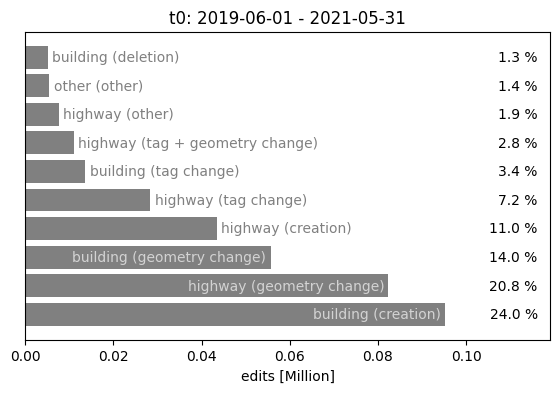

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,31738,0.249,0.249,179,0.214
1,61,1,t1,nc,tag change,highway,23209,0.182,0.431,188,0.225
2,62,2,t1,nc,tag change,building,12044,0.094,0.525,96,0.115
3,63,3,t1,nc,geometry change,highway,9047,0.071,0.596,217,0.259
4,64,4,t1,nc,creation,highway,8363,0.066,0.662,179,0.214
5,65,5,t1,nc,other,highway,3304,0.026,0.688,101,0.121
6,66,6,t1,nc,creation,amenity,3211,0.025,0.713,224,0.268
7,67,7,t1,nc,geometry change,building,2283,0.018,0.731,86,0.103
8,68,8,t1,nc,tag + geometry change,highway,2196,0.017,0.748,90,0.108
9,69,9,t1,nc,creation,natural,2192,0.017,0.765,83,0.099


0.031738


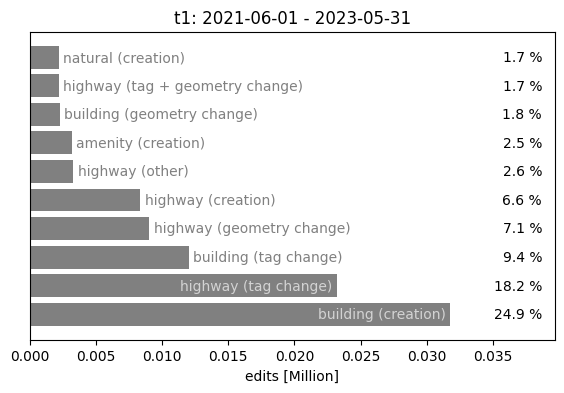

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Apple,geometry change,highway,70859,0.188,0.188,46,0.272
1,1,1,t0,Kaart,geometry change,highway,58438,0.155,0.344,33,0.195
2,2,2,t0,Kaart,creation,highway,32647,0.087,0.431,29,0.172
3,3,3,t0,Kaart,creation,other,30729,0.082,0.512,18,0.107
4,4,4,t0,Bolt,creation,other,24405,0.065,0.577,5,0.030
5,5,5,t0,Kaart,tag change,highway,23516,0.063,0.640,30,0.178
6,6,6,t0,Kaart,creation,building,20441,0.054,0.694,7,0.041
7,7,7,t0,Kaart,tag change,building,10902,0.029,0.723,7,0.041
8,8,8,t0,Apple,creation,highway,9993,0.027,0.750,35,0.207
9,9,9,t0,Apple,other,other,8573,0.023,0.773,30,0.178


0.070859


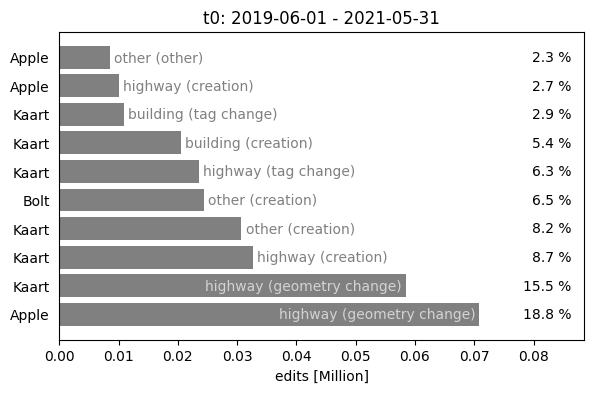

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Kaart,geometry change,highway,102284,0.431,0.431,52,0.189
1,21,1,t1,Kaart,creation,highway,37077,0.156,0.588,52,0.189
2,22,2,t1,Kaart,tag change,highway,11425,0.048,0.636,48,0.175
3,23,3,t1,Apple,geometry change,highway,7690,0.032,0.668,63,0.229
4,24,4,t1,Apple,tag change,highway,6711,0.028,0.697,39,0.142
5,25,5,t1,Kaart,geometry change,building,6607,0.028,0.724,28,0.102
6,26,6,t1,RocketData,tag change,shop,6357,0.027,0.751,3,0.011
7,27,7,t1,Apple,creation,highway,6030,0.025,0.777,40,0.145
8,28,8,t1,Kaart,other,other,5655,0.024,0.800,39,0.142
9,29,9,t1,Kaart,tag + geometry change,highway,3363,0.014,0.815,48,0.175


0.102284


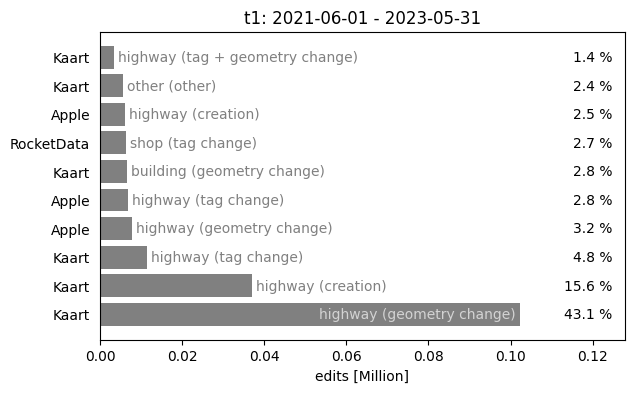

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,345723,0.214,0.214,1249,0.362
1,41,1,t0,nc,creation,building,221940,0.137,0.351,859,0.249
2,42,2,t0,nc,tag change,highway,159718,0.099,0.450,1114,0.323
3,43,3,t0,nc,tag change,other,125020,0.077,0.527,406,0.118
4,44,4,t0,nc,creation,highway,91736,0.057,0.584,1016,0.294
5,45,5,t0,nc,tag change,building,60826,0.038,0.621,800,0.232
6,46,6,t0,nc,other,other,54816,0.034,0.655,446,0.129
7,47,7,t0,nc,geometry change,building,47389,0.029,0.684,631,0.183
8,48,8,t0,nc,tag change,railway,47120,0.029,0.713,175,0.051
9,49,9,t0,nc,tag + geometry change,highway,32571,0.020,0.734,623,0.180


0.345723


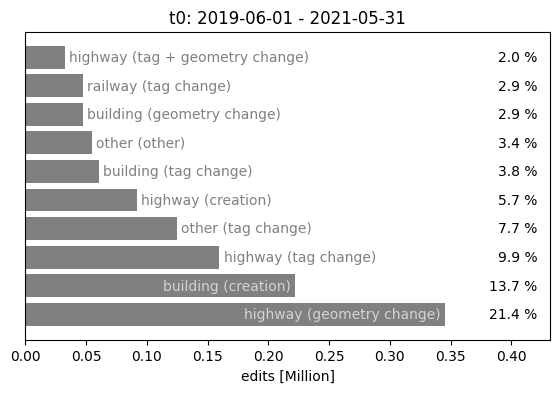

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,311722,0.168,0.168,736,0.253
1,61,1,t1,nc,tag change,highway,233621,0.126,0.293,989,0.340
2,62,2,t1,nc,geometry change,highway,205058,0.110,0.403,1024,0.352
3,63,3,t1,nc,creation,other,168177,0.090,0.494,420,0.144
4,64,4,t1,nc,creation,highway,135505,0.073,0.567,830,0.285
5,65,5,t1,nc,tag change,other,108805,0.059,0.625,380,0.130
6,66,6,t1,nc,tag change,building,72119,0.039,0.664,764,0.262
7,67,7,t1,nc,geometry change,building,59354,0.032,0.696,502,0.172
8,68,8,t1,nc,tag + geometry change,highway,41971,0.023,0.719,500,0.172
9,69,9,t1,nc,other,other,39769,0.021,0.740,415,0.143


0.311722


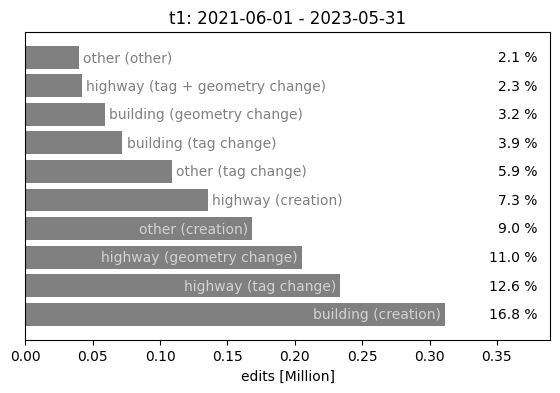

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Apple,geometry change,highway,60437,0.386,0.386,84,0.494
1,1,1,t0,Apple,creation,highway,38358,0.245,0.631,63,0.371
2,2,2,t0,Apple,other,other,14035,0.090,0.720,69,0.406
3,3,3,t0,Apple,tag change,other,8787,0.056,0.776,45,0.265
4,4,4,t0,Apple,tag change,highway,8283,0.053,0.829,54,0.318
5,5,5,t0,Apple,tag + geometry change,highway,4769,0.030,0.860,50,0.294
6,6,6,t0,Apple,geometry change,waterway,3077,0.020,0.879,74,0.435
7,7,7,t0,Apple,geometry change,other,2997,0.019,0.898,72,0.424
8,8,8,t0,Apple,deletion,other,1841,0.012,0.910,37,0.218
9,9,9,t0,Apple,creation,man_made,1350,0.009,0.919,42,0.247


0.060437


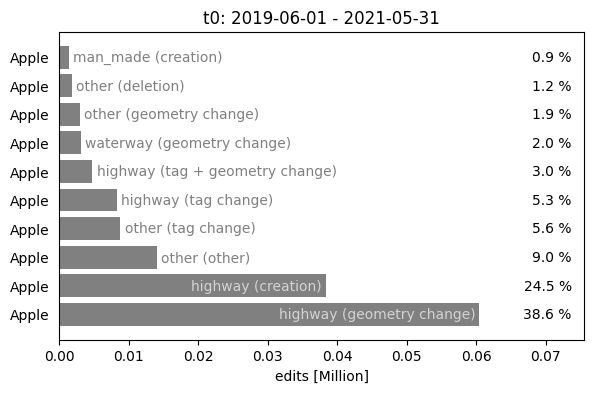

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,DigitalEgypt,geometry change,highway,67458,0.386,0.386,26,0.114
1,21,1,t1,DigitalEgypt,creation,highway,13531,0.077,0.464,25,0.110
2,22,2,t1,Apple,geometry change,highway,13530,0.077,0.541,85,0.373
3,23,3,t1,Apple,creation,highway,10765,0.062,0.603,57,0.250
4,24,4,t1,Neshan,geometry change,highway,7634,0.044,0.647,9,0.039
5,25,5,t1,DigitalEgypt,deletion,highway,7204,0.041,0.688,25,0.110
6,26,6,t1,DigitalEgypt,tag + geometry change,highway,5758,0.033,0.721,25,0.110
7,27,7,t1,DigitalEgypt,tag change,highway,5270,0.030,0.751,26,0.114
8,28,8,t1,Neshan,creation,highway,5225,0.030,0.781,7,0.031
9,29,9,t1,Apple,tag change,other,3860,0.022,0.803,62,0.272


0.067458


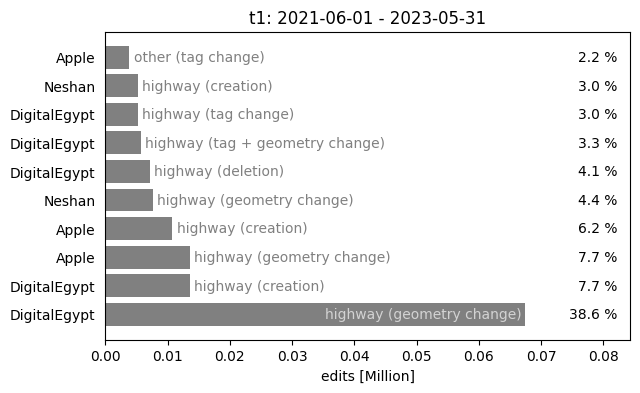

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,121593,0.195,0.195,643,0.065
1,41,1,t0,nc,geometry change,highway,116051,0.186,0.382,707,0.072
2,42,2,t0,nc,creation,highway,74906,0.120,0.502,1253,0.128
3,43,3,t0,nc,tag change,highway,23954,0.038,0.540,292,0.030
4,44,4,t0,nc,geometry change,building,23214,0.037,0.578,272,0.028
5,45,5,t0,nc,tag change,place,18176,0.029,0.607,427,0.043
6,46,6,t0,nc,creation,power,17860,0.029,0.635,40,0.004
7,47,7,t0,nc,creation,amenity,13630,0.022,0.657,3915,0.398
8,48,8,t0,nc,creation,tourism,12659,0.020,0.678,4152,0.423
9,49,9,t0,nc,deletion,tourism,11418,0.018,0.696,119,0.012


0.121593


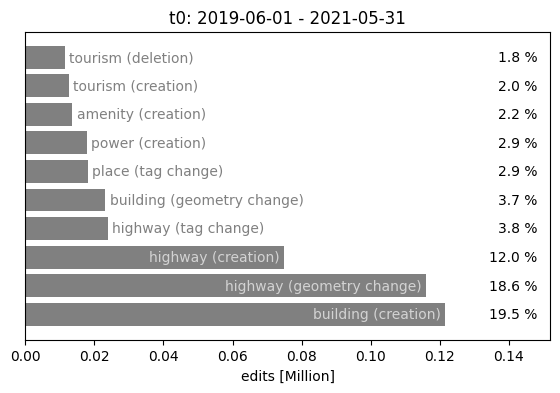

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,492588,0.313,0.313,1024,0.150
1,61,1,t1,nc,deletion,building,370669,0.235,0.548,244,0.036
2,62,2,t1,nc,geometry change,highway,133516,0.085,0.633,700,0.103
3,63,3,t1,nc,tag change,building,124402,0.079,0.712,225,0.033
4,64,4,t1,nc,creation,highway,62276,0.040,0.752,862,0.126
5,65,5,t1,nc,tag change,highway,45674,0.029,0.781,286,0.042
6,66,6,t1,nc,geometry change,building,40071,0.025,0.806,491,0.072
7,67,7,t1,nc,creation,other,22292,0.014,0.820,203,0.030
8,68,8,t1,nc,deletion,place,20181,0.013,0.833,69,0.010
9,69,9,t1,nc,deletion,highway,15535,0.010,0.843,191,0.028


0.492588


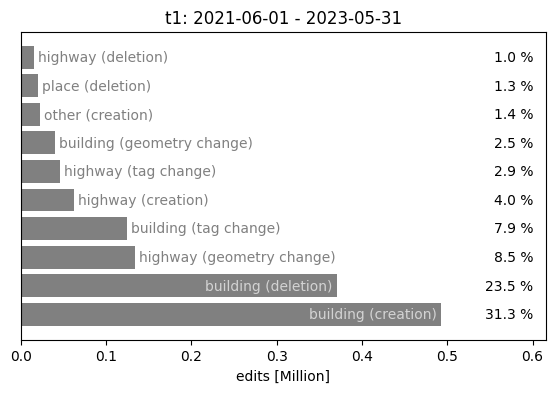

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Apple,creation,building,863,0.287,0.287,10,0.169
1,1,1,t0,Apple,geometry change,highway,693,0.230,0.517,25,0.424
2,2,2,t0,Apple,creation,highway,202,0.067,0.584,19,0.322
3,3,3,t0,Apple,tag change,highway,194,0.064,0.648,11,0.186
4,4,4,t0,Grab,creation,building,159,0.053,0.701,2,0.034
5,5,5,t0,Grab,geometry change,building,158,0.052,0.754,2,0.034
6,6,6,t0,Grab,deletion,building,92,0.031,0.815,1,0.017
7,7,7,t0,Apple,deletion,highway,92,0.031,0.815,6,0.102
8,8,8,t0,Amazon,creation,building,82,0.027,0.842,3,0.051
9,9,9,t0,Apple,tag + geometry change,highway,55,0.018,0.860,10,0.169


0.000863


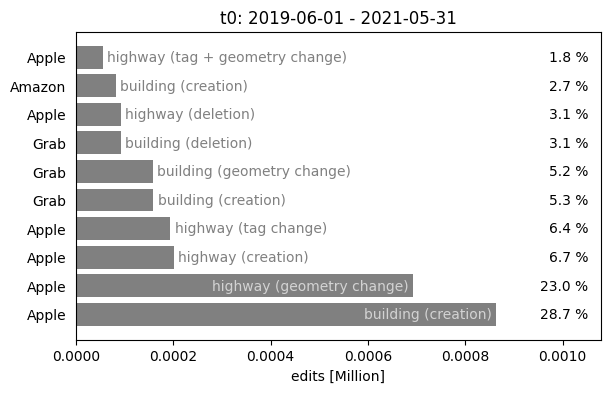

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,DevelopmentSeed,creation,building,112510,0.653,0.653,4,0.028
1,21,1,t1,DevelopmentSeed,geometry change,building,15273,0.089,0.742,4,0.028
2,22,2,t1,DevelopmentSeed,deletion,building,8714,0.051,0.792,4,0.028
3,23,3,t1,DevelopmentSeed,creation,highway,7119,0.041,0.834,4,0.028
4,24,4,t1,DevelopmentSeed,geometry change,highway,5917,0.034,0.868,4,0.028
5,25,5,t1,TomTom,creation,highway,5772,0.034,0.902,32,0.227
6,26,6,t1,TomTom,geometry change,highway,4336,0.025,0.927,46,0.326
7,27,7,t1,DigitalEgypt,geometry change,highway,3182,0.018,0.945,22,0.156
8,28,8,t1,Apple,geometry change,building,1191,0.007,0.952,9,0.064
9,29,9,t1,Apple,creation,building,730,0.004,0.956,5,0.035


0.11251


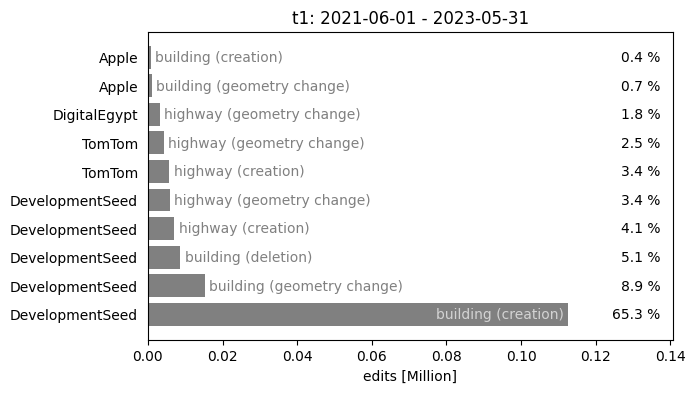

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,261917,0.500,0.500,2137,0.794
1,41,1,t0,nc,geometry change,building,73976,0.141,0.642,949,0.352
2,42,2,t0,nc,deletion,building,68566,0.131,0.773,817,0.303
3,43,3,t0,nc,creation,highway,14472,0.028,0.801,505,0.188
4,44,4,t0,nc,geometry change,highway,12264,0.023,0.824,814,0.302
5,45,5,t0,nc,creation,natural,11862,0.023,0.847,136,0.051
6,46,6,t0,nc,creation,landuse,11028,0.021,0.868,478,0.177
7,47,7,t0,nc,creation,place,10782,0.021,0.888,66,0.025
8,48,8,t0,nc,creation,waterway,7694,0.015,0.903,79,0.029
9,49,9,t0,nc,tag change,place,7552,0.014,0.917,66,0.025


0.261917


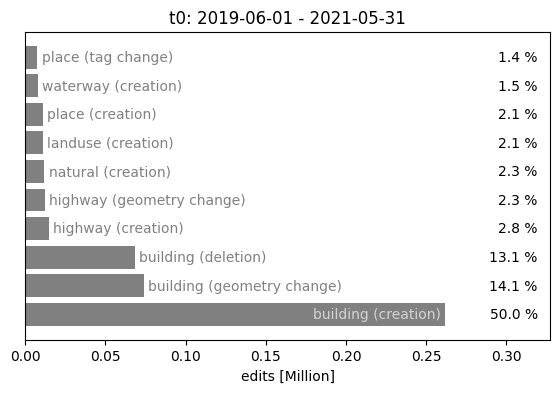

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,417819,0.652,0.652,1867,0.841
1,61,1,t1,nc,geometry change,building,68720,0.107,0.760,754,0.339
2,62,2,t1,nc,deletion,building,44248,0.069,0.829,499,0.225
3,63,3,t1,nc,other,building,41735,0.065,0.894,213,0.096
4,64,4,t1,nc,creation,landuse,11372,0.018,0.912,158,0.071
5,65,5,t1,nc,deletion,landuse,11018,0.017,0.929,98,0.044
6,66,6,t1,nc,geometry change,highway,7767,0.012,0.941,454,0.204
7,67,7,t1,nc,creation,highway,7354,0.011,0.953,242,0.109
8,68,8,t1,nc,creation,natural,4559,0.007,0.960,75,0.034
9,69,9,t1,nc,deletion,highway,2373,0.004,0.963,83,0.037


0.417819


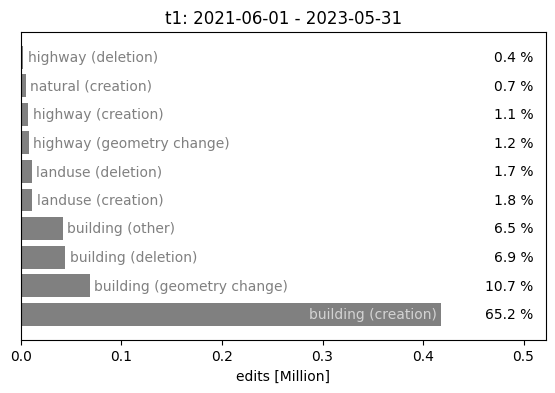

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Amazon,creation,highway,5588234,0.423,0.423,441,0.474
1,1,1,t0,Amazon,geometry change,highway,3905273,0.296,0.718,450,0.483
2,2,2,t0,Amazon,other,other,1192121,0.090,0.809,416,0.447
3,3,3,t0,Amazon,creation,barrier,526199,0.040,0.848,413,0.444
4,4,4,t0,Amazon,deletion,other,455862,0.034,0.883,396,0.425
5,5,5,t0,Amazon,tag + geometry change,highway,272930,0.021,0.904,420,0.451
6,6,6,t0,Amazon,tag change,highway,204663,0.015,0.919,417,0.448
7,7,7,t0,Amazon,creation,building,75876,0.006,0.925,113,0.121
8,8,8,t0,Amazon,deletion,highway,70132,0.005,0.930,410,0.440
9,9,9,t0,Lyft,creation,highway,61060,0.005,0.935,51,0.055


5.588234


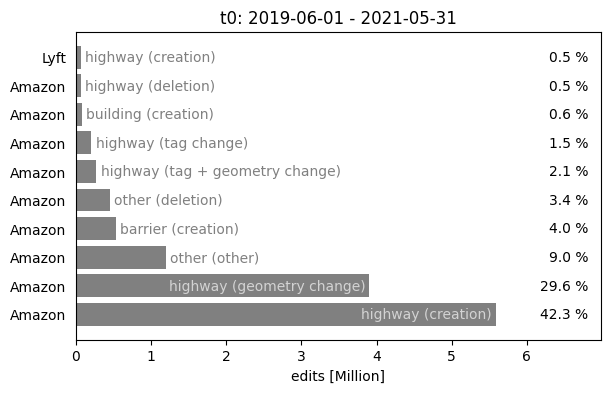

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Amazon,creation,highway,877693,0.134,0.134,980,0.587
1,21,1,t1,Meta,creation,building,805308,0.123,0.257,60,0.036
2,22,2,t1,Amazon,geometry change,highway,780536,0.119,0.376,1144,0.685
3,23,3,t1,Lyft,creation,highway,659241,0.101,0.477,20,0.012
4,24,4,t1,Amazon,other,other,371635,0.057,0.534,807,0.483
5,25,5,t1,Lyft,geometry change,highway,288737,0.044,0.578,35,0.021
6,26,6,t1,Meta,tag change,other,251533,0.038,0.617,59,0.035
7,27,7,t1,Lyft,tag change,highway,196533,0.030,0.647,20,0.012
8,28,8,t1,Amazon,tag change,highway,149658,0.023,0.669,739,0.443
9,29,9,t1,Amazon,deletion,other,141744,0.022,0.691,626,0.375


0.877693


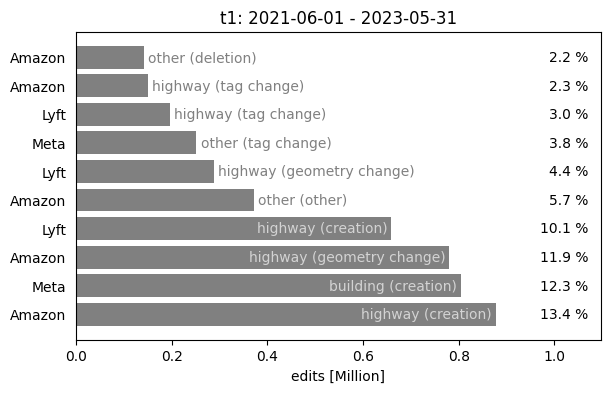

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,14891014,0.215,0.215,15528,0.322
1,41,1,t0,nc,creation,highway,7732554,0.111,0.326,19217,0.398
2,42,2,t0,nc,geometry change,highway,6409169,0.092,0.419,22355,0.463
3,43,3,t0,nc,other,other,5271868,0.076,0.495,11629,0.241
4,44,4,t0,nc,creation,other,5196030,0.075,0.569,11915,0.247
5,45,5,t0,nc,deletion,other,4616947,0.067,0.636,9331,0.193
6,46,6,t0,nc,tag change,highway,3407075,0.049,0.685,17495,0.363
7,47,7,t0,nc,tag change,building,3105064,0.045,0.730,11339,0.235
8,48,8,t0,nc,tag change,other,1515979,0.022,0.752,6694,0.139
9,49,9,t0,nc,creation,natural,1509743,0.022,0.773,5820,0.121


14.891014


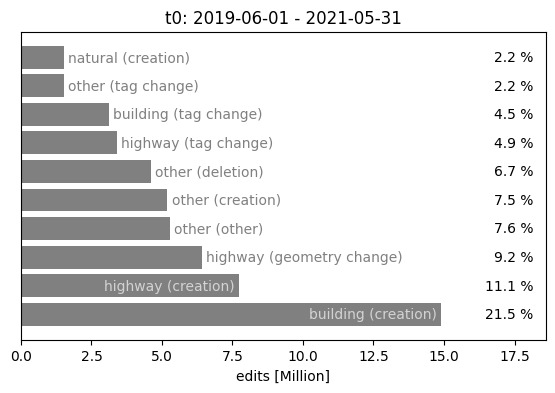

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,16155093,0.213,0.213,13681,0.280
1,61,1,t1,nc,creation,highway,5948131,0.078,0.292,16418,0.336
2,62,2,t1,nc,geometry change,highway,5631977,0.074,0.366,19610,0.401
3,63,3,t1,nc,tag change,highway,5077687,0.067,0.433,17271,0.353
4,64,4,t1,nc,tag change,building,4850713,0.064,0.497,11736,0.240
5,65,5,t1,nc,creation,other,4845286,0.064,0.561,10888,0.223
6,66,6,t1,nc,other,other,4721798,0.062,0.623,10771,0.220
7,67,7,t1,nc,tag change,other,3792513,0.050,0.673,7359,0.150
8,68,8,t1,nc,deletion,other,3550293,0.047,0.720,8128,0.166
9,69,9,t1,nc,creation,natural,2197112,0.029,0.749,5467,0.112


16.155093


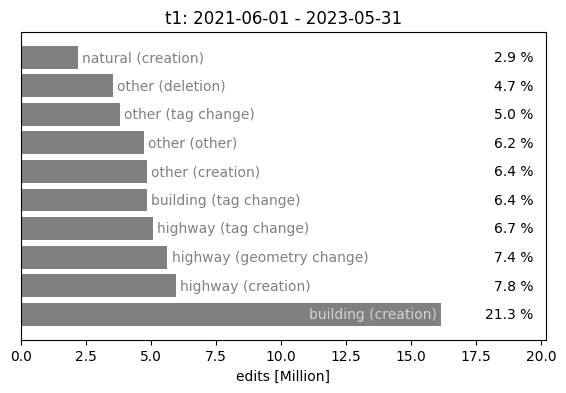

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Apple,geometry change,highway,11452,0.472,0.472,24,0.304
1,1,1,t0,Apple,creation,highway,5950,0.245,0.718,16,0.203
2,2,2,t0,Apple,geometry change,waterway,1753,0.072,0.790,30,0.380
3,3,3,t0,Apple,tag change,highway,1545,0.064,0.854,23,0.291
4,4,4,t0,Apple,tag + geometry change,highway,531,0.022,0.876,13,0.165
5,5,5,t0,Apple,geometry change,other,497,0.020,0.896,24,0.304
6,6,6,t0,Apple,geometry change,natural,276,0.011,0.907,18,0.228
7,7,7,t0,Apple,creation,waterway,217,0.009,0.916,19,0.241
8,8,8,t0,Apple,other,other,167,0.007,0.923,19,0.241
9,9,9,t0,Amazon,creation,highway,154,0.006,0.930,2,0.025


0.011452


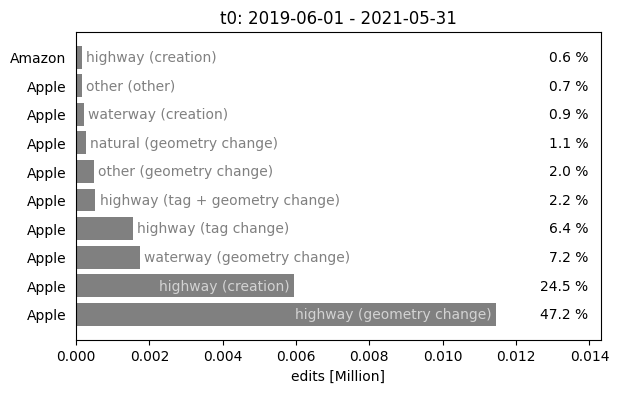

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Apple,creation,other,30309,0.388,0.388,19,0.086
1,21,1,t1,Apple,deletion,other,24680,0.316,0.705,3,0.014
2,22,2,t1,TomTom,geometry change,highway,7122,0.091,0.796,53,0.239
3,23,3,t1,Apple,geometry change,highway,4613,0.059,0.855,96,0.432
4,24,4,t1,TomTom,creation,highway,3663,0.047,0.902,47,0.212
5,25,5,t1,Apple,creation,highway,1559,0.020,0.922,69,0.311
6,26,6,t1,Apple,tag change,highway,1060,0.014,0.935,58,0.261
7,27,7,t1,Apple,geometry change,building,491,0.006,0.942,30,0.135
8,28,8,t1,Microsoft,tag change,highway,428,0.005,0.947,11,0.050
9,29,9,t1,Apple,tag + geometry change,highway,288,0.004,0.951,47,0.212


0.030309


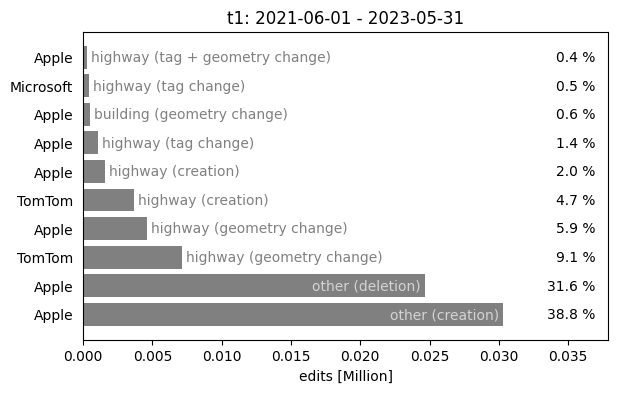

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,221880,0.487,0.487,594,0.548
1,41,1,t0,nc,geometry change,highway,56095,0.123,0.610,540,0.498
2,42,2,t0,nc,creation,highway,33517,0.074,0.684,368,0.339
3,43,3,t0,nc,tag change,highway,19699,0.043,0.727,161,0.149
4,44,4,t0,nc,geometry change,building,14114,0.031,0.758,339,0.313
5,45,5,t0,nc,other,building,9797,0.022,0.779,85,0.078
6,46,6,t0,nc,tag change,other,9604,0.021,0.801,62,0.057
7,47,7,t0,nc,creation,natural,7283,0.016,0.817,95,0.088
8,48,8,t0,nc,creation,barrier,6984,0.015,0.832,44,0.041
9,49,9,t0,nc,deletion,building,6194,0.014,0.845,146,0.135


0.22188


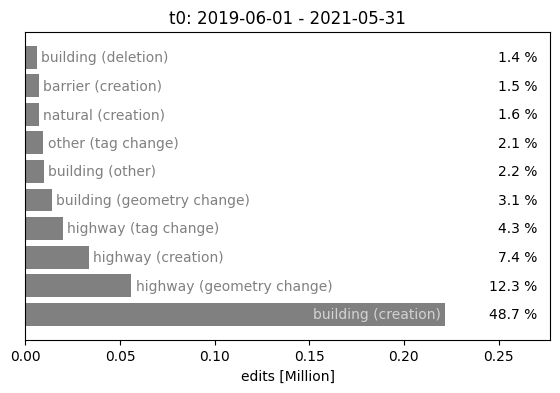

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,163923,0.529,0.529,529,0.629
1,61,1,t1,nc,tag change,highway,19559,0.063,0.592,74,0.088
2,62,2,t1,nc,geometry change,highway,18945,0.061,0.653,278,0.331
3,63,3,t1,nc,creation,highway,16615,0.054,0.706,140,0.166
4,64,4,t1,nc,geometry change,building,15291,0.049,0.756,200,0.238
5,65,5,t1,nc,deletion,building,9703,0.031,0.787,123,0.146
6,66,6,t1,nc,creation,landuse,6111,0.020,0.807,162,0.193
7,67,7,t1,nc,creation,waterway,4458,0.014,0.821,58,0.069
8,68,8,t1,nc,creation,natural,4169,0.013,0.834,61,0.073
9,69,9,t1,nc,deletion,highway,3866,0.012,0.847,42,0.050


0.163923


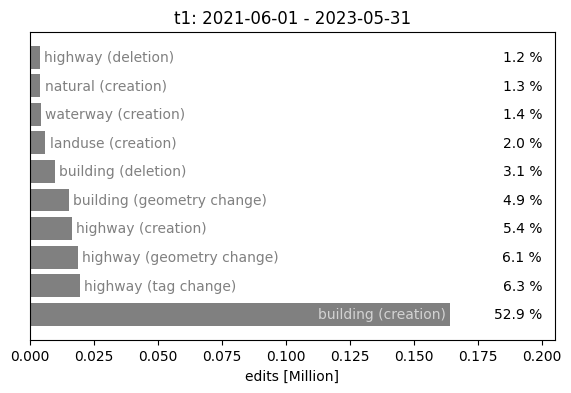

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Kaart,geometry change,highway,12235,0.287,0.287,21,0.328
1,1,1,t0,Kaart,geometry change,building,6381,0.150,0.437,16,0.250
2,2,2,t0,Kaart,creation,highway,4175,0.098,0.535,18,0.281
3,3,3,t0,Kaart,tag + geometry change,highway,3537,0.083,0.618,18,0.281
4,4,4,t0,Kaart,tag change,highway,1927,0.045,0.664,18,0.281
5,5,5,t0,Kaart,deletion,highway,1826,0.043,0.707,16,0.250
6,6,6,t0,Kaart,creation,building,1714,0.040,0.747,5,0.078
7,7,7,t0,Apple,other,other,1113,0.026,0.773,5,0.078
8,8,8,t0,Apple,geometry change,highway,1022,0.024,0.797,11,0.172
9,9,9,t0,Apple,creation,building,907,0.021,0.818,18,0.281


0.012235


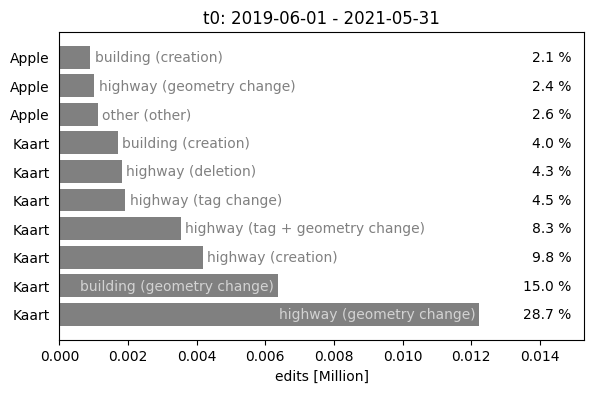

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,TomTom,geometry change,highway,16552,0.280,0.280,83,0.407
1,21,1,t1,TomTom,creation,highway,11212,0.190,0.470,77,0.377
2,22,2,t1,Apple,geometry change,building,7091,0.120,0.590,29,0.142
3,23,3,t1,Apple,deletion,building,6830,0.116,0.706,4,0.020
4,24,4,t1,TomTom,geometry change,building,3996,0.068,0.773,74,0.363
5,25,5,t1,Apple,other,building,1655,0.028,0.801,4,0.020
6,26,6,t1,TomTom,other,other,1583,0.027,0.828,51,0.250
7,27,7,t1,Apple,creation,building,1264,0.021,0.850,6,0.029
8,28,8,t1,Apple,geometry change,highway,1258,0.021,0.871,60,0.294
9,29,9,t1,Kaart,creation,building,935,0.016,0.887,3,0.015


0.016552


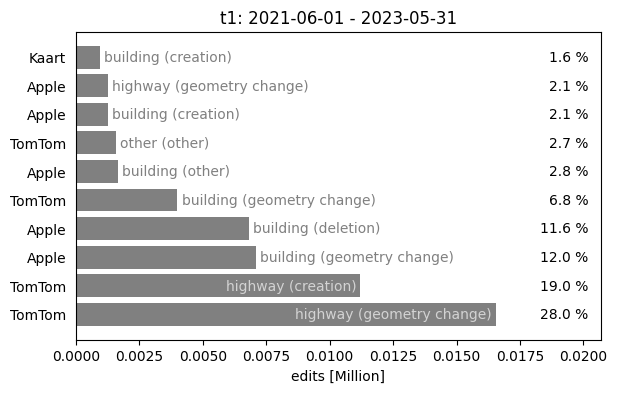

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,143055,0.457,0.457,954,0.763
1,41,1,t0,nc,geometry change,building,57609,0.184,0.642,595,0.476
2,42,2,t0,nc,other,building,29226,0.093,0.735,193,0.154
3,43,3,t0,nc,deletion,building,23700,0.076,0.811,398,0.318
4,44,4,t0,nc,geometry change,highway,14636,0.047,0.858,664,0.531
5,45,5,t0,nc,creation,highway,12076,0.039,0.896,584,0.467
6,46,6,t0,nc,tag change,building,6108,0.020,0.916,80,0.064
7,47,7,t0,nc,tag change,highway,3459,0.011,0.927,142,0.114
8,48,8,t0,nc,other,other,2753,0.009,0.936,149,0.119
9,49,9,t0,nc,geometry change,waterway,2234,0.007,0.943,238,0.190


0.143055


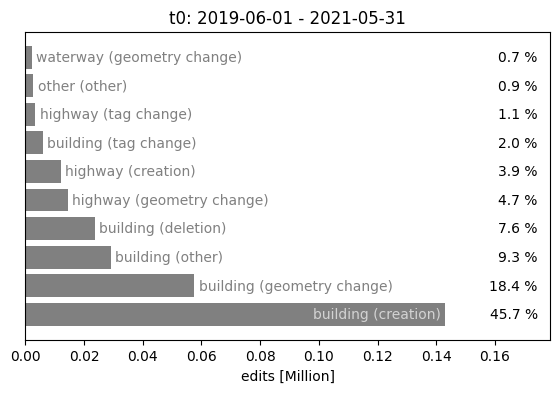

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,261911,0.536,0.536,2071,0.876
1,61,1,t1,nc,geometry change,building,102201,0.209,0.745,1015,0.429
2,62,2,t1,nc,deletion,building,32688,0.067,0.812,736,0.311
3,63,3,t1,nc,other,building,31139,0.064,0.875,292,0.123
4,64,4,t1,nc,geometry change,highway,18181,0.037,0.913,1012,0.428
5,65,5,t1,nc,tag change,building,7840,0.016,0.929,112,0.047
6,66,6,t1,nc,creation,highway,7399,0.015,0.944,407,0.172
7,67,7,t1,nc,tag change,highway,3121,0.006,0.950,136,0.058
8,68,8,t1,nc,deletion,highway,2601,0.005,0.956,158,0.067
9,69,9,t1,nc,geometry change,waterway,2218,0.005,0.960,276,0.117


0.261911


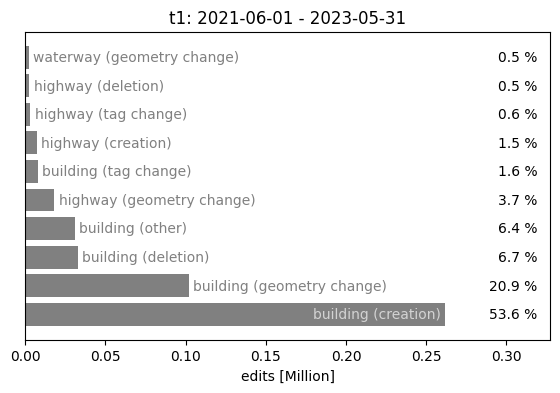

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Apple,geometry change,highway,58064,0.571,0.571,75,0.701
1,1,1,t0,Apple,creation,highway,17806,0.175,0.746,67,0.626
2,2,2,t0,Apple,tag change,highway,9266,0.091,0.838,60,0.561
3,3,3,t0,Kaart,tag change,highway,5993,0.059,0.897,2,0.019
4,4,4,t0,Apple,tag + geometry change,highway,2598,0.026,0.922,55,0.514
5,5,5,t0,Apple,other,other,1798,0.018,0.940,39,0.364
6,6,6,t0,Apple,other,highway,1737,0.017,0.957,45,0.421
7,7,7,t0,Apple,geometry change,building,844,0.008,0.965,25,0.234
8,8,8,t0,Apple,deletion,highway,658,0.006,0.972,40,0.374
9,9,9,t0,Apple,tag change,other,425,0.004,0.976,19,0.178


0.058064


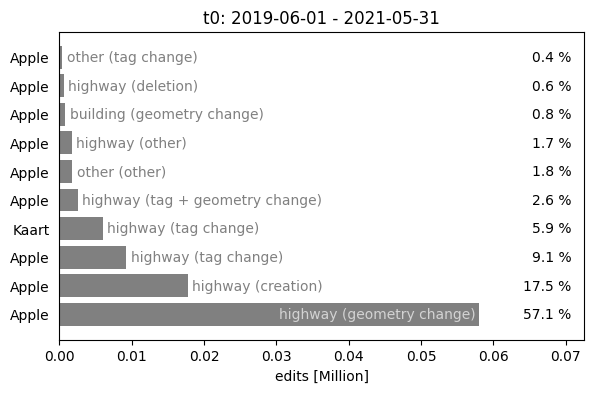

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,TomTom,geometry change,highway,32710,0.235,0.235,135,0.480
1,21,1,t1,DigitalEgypt,geometry change,highway,30701,0.221,0.456,27,0.096
2,22,2,t1,TomTom,creation,highway,30350,0.218,0.674,130,0.463
3,23,3,t1,DigitalEgypt,creation,highway,10149,0.073,0.747,26,0.093
4,24,4,t1,DigitalEgypt,tag change,highway,4871,0.035,0.782,23,0.082
5,25,5,t1,DigitalEgypt,other,highway,4491,0.032,0.815,23,0.082
6,26,6,t1,DigitalEgypt,tag + geometry change,highway,4071,0.029,0.844,27,0.096
7,27,7,t1,DigitalEgypt,tag change,other,3071,0.022,0.866,15,0.053
8,28,8,t1,DigitalEgypt,deletion,highway,2929,0.021,0.887,26,0.093
9,29,9,t1,Apple,geometry change,highway,2030,0.015,0.902,35,0.125


0.03271


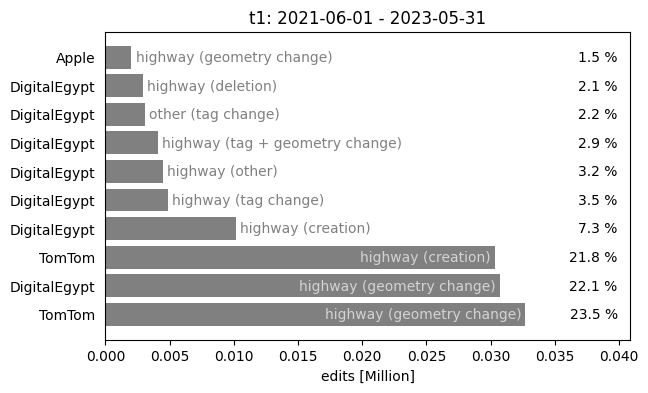

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,geometry change,highway,882264,0.520,0.520,758,0.392
1,41,1,t0,nc,creation,highway,324659,0.191,0.711,617,0.319
2,42,2,t0,nc,creation,power,95328,0.056,0.767,17,0.009
3,43,3,t0,nc,tag change,highway,75508,0.044,0.812,518,0.268
4,44,4,t0,nc,creation,building,74216,0.044,0.856,331,0.171
5,45,5,t0,nc,tag change,other,30191,0.018,0.873,257,0.133
6,46,6,t0,nc,other,other,22301,0.013,0.887,332,0.171
7,47,7,t0,nc,tag + geometry change,highway,19193,0.011,0.898,420,0.217
8,48,8,t0,nc,other,highway,17944,0.011,0.908,384,0.198
9,49,9,t0,nc,geometry change,building,12649,0.007,0.916,318,0.164


0.882264


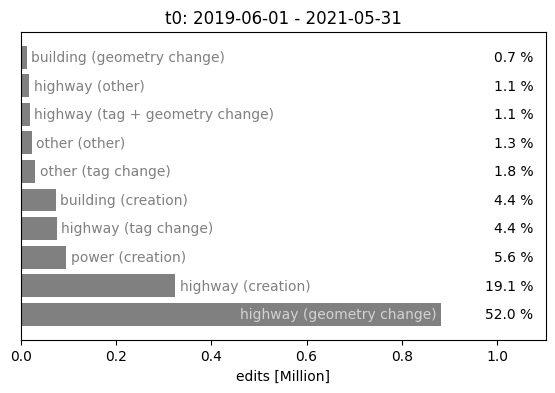

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,102116,0.324,0.324,395,0.270
1,61,1,t1,nc,creation,power,42844,0.136,0.460,20,0.014
2,62,2,t1,nc,geometry change,highway,28788,0.091,0.551,455,0.311
3,63,3,t1,nc,creation,highway,21718,0.069,0.620,313,0.214
4,64,4,t1,nc,tag change,highway,19680,0.062,0.683,236,0.161
5,65,5,t1,nc,creation,landuse,8195,0.026,0.709,130,0.089
6,66,6,t1,nc,other,highway,4519,0.014,0.723,169,0.116
7,67,7,t1,nc,creation,amenity,4517,0.014,0.737,342,0.234
8,68,8,t1,nc,tag change,public_transport' 'highway,4138,0.013,0.750,34,0.023
9,69,9,t1,nc,creation,natural,3988,0.013,0.763,107,0.073


0.102116


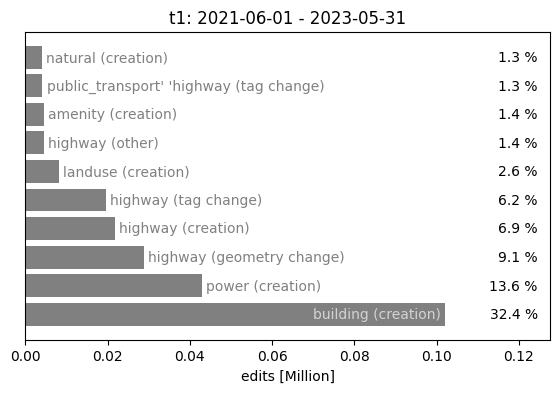

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,0,0,t0,Kaart,geometry change,highway,270773,0.260,0.260,35,0.123
1,1,1,t0,Kaart,creation,building,166449,0.160,0.419,7,0.025
2,2,2,t0,Kaart,geometry change,building,75149,0.072,0.491,16,0.056
3,3,3,t0,Lightcyphers,geometry change,highway,49376,0.047,0.539,9,0.032
4,4,4,t0,Kaart,tag change,building,44460,0.043,0.581,10,0.035
5,5,5,t0,Kaart,creation,highway,38120,0.037,0.618,24,0.085
6,6,6,t0,Apple,geometry change,highway,37652,0.036,0.654,130,0.458
7,7,7,t0,Kaart,creation,waterway,37294,0.036,0.690,13,0.046
8,8,8,t0,Kaart,geometry change,landuse,20175,0.019,0.709,20,0.070
9,9,9,t0,Kaart,geometry change,waterway,20090,0.019,0.728,18,0.063


0.270773


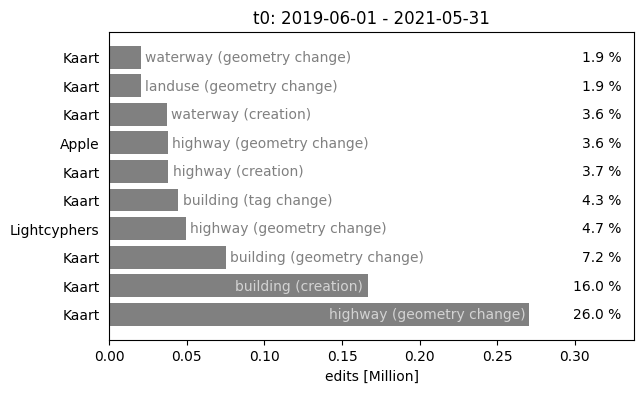

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,20,0,t1,Kaart,creation,building,63272,0.176,0.176,2,0.009
1,21,1,t1,Kaart,creation,highway,41870,0.116,0.292,9,0.042
2,22,2,t1,Kaart,tag change,highway,41620,0.116,0.408,7,0.032
3,23,3,t1,Kaart,geometry change,building,39783,0.110,0.518,5,0.023
4,24,4,t1,Kaart,geometry change,highway,34794,0.097,0.615,11,0.051
5,25,5,t1,Apple,geometry change,highway,17055,0.047,0.662,73,0.338
6,26,6,t1,Kaart,tag change,building,13366,0.037,0.699,3,0.014
7,27,7,t1,Kaart,deletion,highway,9274,0.026,0.725,7,0.032
8,28,8,t1,Kaart,creation,other,9100,0.025,0.750,6,0.028
9,29,9,t1,Kaart,tag change,other,8285,0.023,0.773,6,0.028


0.063272


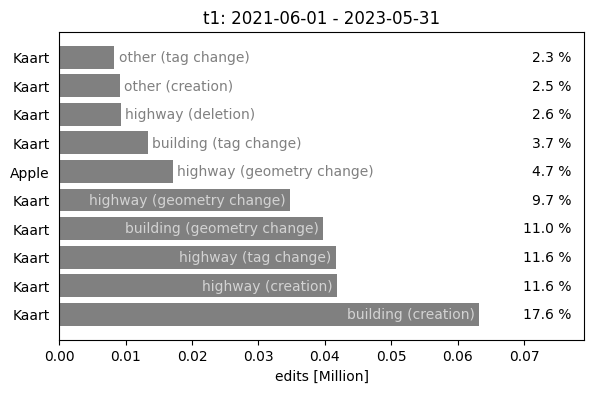

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,40,0,t0,nc,creation,building,1358944,0.216,0.216,2241,0.227
1,41,1,t0,nc,geometry change,highway,680804,0.108,0.324,3158,0.320
2,42,2,t0,nc,creation,highway,586496,0.093,0.418,2827,0.286
3,43,3,t0,nc,tag change,building,513432,0.082,0.499,2725,0.276
4,44,4,t0,nc,tag change,highway,441545,0.070,0.570,2242,0.227
5,45,5,t0,nc,geometry change,building,292223,0.046,0.616,1764,0.179
6,46,6,t0,nc,creation,natural,205764,0.033,0.649,1175,0.119
7,47,7,t0,nc,creation,landuse,205503,0.033,0.681,1180,0.119
8,48,8,t0,nc,creation,barrier,171592,0.027,0.709,933,0.094
9,49,9,t0,nc,geometry change,landuse,117021,0.019,0.727,1685,0.171


1.358944


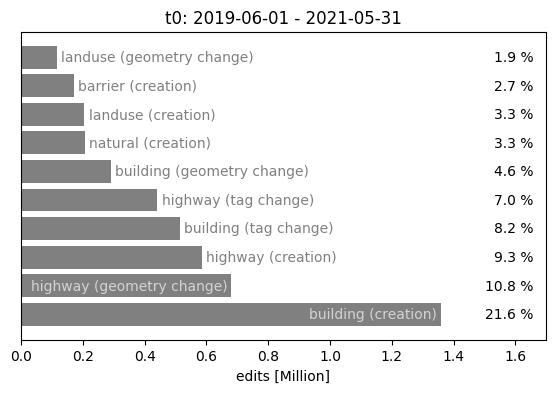

,index,Unnamed: 0,time_range,corporation,contrib_type,primary_osm_tag_keys,edits,edits_share,edits_cumulative_share,contributors,contributors_share
0,60,0,t1,nc,creation,building,909475,0.149,0.149,1815,0.269
1,61,1,t1,nc,tag change,highway,760696,0.124,0.273,1987,0.295
2,62,2,t1,nc,tag change,building,558212,0.091,0.364,1996,0.296
3,63,3,t1,nc,geometry change,highway,534724,0.087,0.452,2571,0.381
4,64,4,t1,nc,creation,highway,410673,0.067,0.519,2276,0.338
5,65,5,t1,nc,geometry change,building,205283,0.034,0.553,1478,0.219
6,66,6,t1,nc,tag change,amenity,164094,0.027,0.579,1328,0.197
7,67,7,t1,nc,creation,landuse,154874,0.025,0.605,989,0.147
8,68,8,t1,nc,creation,natural,151401,0.025,0.630,965,0.143
9,69,9,t1,nc,tag change,shop,136274,0.022,0.652,955,0.142


0.909475


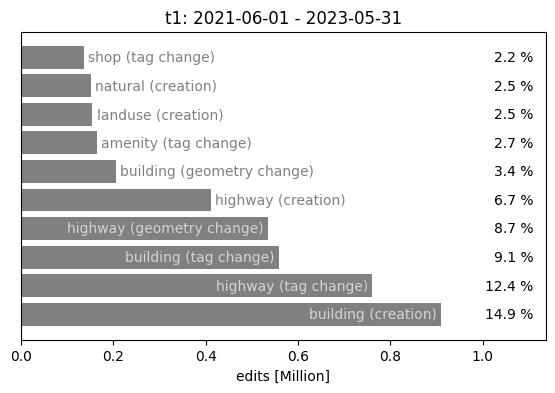

In [96]:
for iso_a3_code in country_list:
    df = read_csv(iso_a3_code)
    create_plot(df, iso_a3_code, "t0", True)
    create_plot(df, iso_a3_code, "t1", True)
    create_plot(df, iso_a3_code, "t0", False)
    create_plot(df, iso_a3_code, "t1", False)